In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import utils
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

import logging
from prophet import Prophet
from datetime import datetime, time, timedelta
from multiprocessing import cpu_count, Pool
import pycountry

## Upload all Data

In [2]:
dataT = pd.read_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Original_Data_Code/extract.csv')
dataT.head()

,city,type,provider,ts,nb_trip,rain,snow,main,time_lost,before_lag,nb_vehic_avail
0,aarhus,CAR,32,2021-05-11T10:00:00Z,7,NaN,NaN,NaN,0.0,0,88.0
1,aarhus,CAR,32,2021-05-11T11:00:00Z,15,NaN,NaN,NaN,0.0,0,88.0
2,aarhus,CAR,32,2021-05-11T12:00:00Z,25,NaN,NaN,NaN,0.0,0,88.0
3,aarhus,CAR,32,2021-05-11T13:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0
4,aarhus,CAR,32,2021-05-11T14:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0


In [3]:
dataT.columns

Index(['city', 'type', 'provider', 'ts', 'nb_trip', 'rain', 'snow', 'main',
       'time_lost', 'before_lag', 'nb_vehic_avail'],
      dtype='object')

In [4]:
#How many citys

print('Name of the citys', dataT.city.unique())
print('Number of citys', dataT.city.nunique())

Name of the citys ['aarhus' 'amsterdam' 'antwerp' 'barcelona' 'bari' 'berlin' 'bilbao'
 'bonn' 'bordeaux' 'bratislava' 'bremen' 'bristol' 'bruxelles' 'budapest'
 'delft' 'dortmund' 'dublin' 'dusseldorf' 'eindhoven' 'enschede' 'essen'
 'frankfurt' 'gdansk' 'geneva' 'gothenburg' 'haarlem' 'hamburg' 'hanover'
 'heilbronn' 'helsingborg' 'helsinki' 'istanbul' 'karlsruhe' 'koln'
 'leipzig' 'lisbon' 'ljubljana' 'london' 'lubeck' 'lund' 'lyon' 'madrid'
 'malmo' 'milano' 'modena' 'munchen' 'munster' 'nice' 'norrkoping'
 'nuremberg' 'odense' 'orebro' 'oslo' 'paris' 'pisa' 'potsdam' 'prague'
 'reggio_emilia' 'riga' 'rome' 'rotterdam' 'seville' 'stockholm' 'tallinn'
 'the_hague' 'tilburg' 'torino' 'trondheim' 'vilnius' 'warsaw'
 'washington' 'wien' 'winterthur' 'zurich' 'zwolle']
Number of citys 75


In [5]:
#How many types sharing

print('Name of types sharing', dataT.type.unique())
print('Number of types sharing', dataT.type.nunique())

Name of types sharing ['CAR' 'BIKE' 'MOTORSCOOTER' 'SCOOTER']
Number of types sharing 4


In [6]:
#How many types of providers

print('Name of the provider', dataT.provider.unique())
print('Number of provider', dataT.provider.nunique())

Name of the provider [32  7 41 42 21 35 47 51  6 44 23 22 53 30 26 25 37 10 46 20 34 39 45 19
 14  5  8  9 24 36 27 16 31 13  3 12 15 17 38  4 40 49 18  1 52 11  2 28
 48 29 43 50 33]
Number of provider 53


In [7]:
#Transform time that was in object to date time type
dataT['ts'] = pd.to_datetime(dataT['ts'], format='%Y/%m/%d %H:%M:%S')

In [8]:
#Fuction to remove time zone

def time_n_zone(data):
    data['ts'] = data['ts'].astype(str)
    ogdata = list(data['ts'])
    newtime = []
    for time in ogdata:
        time = time[:-6]
        newtime.append(time)
    data['ts'] = newtime
    data['ts'] = data['ts'].apply(pd.to_datetime)

In [9]:
#Select data by city, type and provider. Change column names of ds to ts and nb_vehic_avail to y

def subsetDataFrame(city, type_s, provider_num):
    DataFrame = dataT[(dataT['city'] == city) & (dataT['type'] == type_s) & (dataT['provider'] == provider_num)]
    #del DataFrame['Unnamed: 0']
    time_n_zone(DataFrame)
    DataFrame.rename(columns = {'ts':'ds', 'nb_trip':'y'}, inplace = True)
    DataFrame = DataFrame.drop(['city', 'type', 'provider'], axis=1)
    le = LabelEncoder()
    DataFrame['main'] = le.fit_transform(DataFrame.main.values)
    return DataFrame

### Define new data for city, type of sharing and provider

In [10]:
data = subsetDataFrame('rome', 'SCOOTER', 47)
data

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
752421,2020-12-11 15:00:00,31,0.0,0.0,0,0.0,0,436.0
752422,2020-12-11 16:00:00,51,0.0,0.0,0,0.0,0,436.0
752423,2020-12-11 17:00:00,47,0.0,0.0,0,0.0,0,436.0
752424,2020-12-11 18:00:00,64,0.0,0.0,0,0.0,0,436.0
752425,2020-12-11 19:00:00,66,0.0,0.0,1,0.0,0,436.0
...,...,...,...,...,...,...,...,...
766063,2022-07-03 01:00:00,0,0.0,0.0,1,0.0,0,NaN
766064,2022-07-03 02:00:00,0,0.0,0.0,1,0.0,0,NaN
766065,2022-07-03 03:00:00,0,0.0,0.0,1,0.0,0,NaN
766066,2022-07-03 04:00:00,0,0.0,0.0,1,0.0,0,NaN


### EDA of Data

In [11]:
# Any missing data to remove, our fill
data.isnull().sum()

ds                 0
y                  0
rain               1
snow               1
main               0
time_lost          0
before_lag         0
nb_vehic_avail    30
dtype: int64

In [12]:
#Fill missing values with near values
for col in ['rain','snow','main','nb_vehic_avail']:
        data[col] = data[col].ffill()
        data[col] = data[col].bfill()

In [13]:
#Check
data.isnull().sum()

ds                0
y                 0
rain              0
snow              0
main              0
time_lost         0
before_lag        0
nb_vehic_avail    0
dtype: int64

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13647 entries, 752421 to 766067
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ds              13647 non-null  datetime64[ns]
 1   y               13647 non-null  int64         
 2   rain            13647 non-null  float64       
 3   snow            13647 non-null  float64       
 4   main            13647 non-null  int64         
 5   time_lost       13647 non-null  float64       
 6   before_lag      13647 non-null  int64         
 7   nb_vehic_avail  13647 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3)
memory usage: 959.6 KB


In [15]:
data.head()

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
752421,2020-12-11 15:00:00,31,0.0,0.0,0,0.0,0,436.0
752422,2020-12-11 16:00:00,51,0.0,0.0,0,0.0,0,436.0
752423,2020-12-11 17:00:00,47,0.0,0.0,0,0.0,0,436.0
752424,2020-12-11 18:00:00,64,0.0,0.0,0,0.0,0,436.0
752425,2020-12-11 19:00:00,66,0.0,0.0,1,0.0,0,436.0


In [16]:
#What does each column mean?
data.describe().T

,count,mean,std,min,25%,50%,75%,max
y,13647.0,67.731370,54.500266,0.0,17.0,60.0,108.0,593.000000
rain,13647.0,0.141456,1.051900,0.0,0.0,0.0,0.0,33.020000
snow,13647.0,0.000149,0.015460,0.0,0.0,0.0,0.0,1.790000
main,13647.0,0.712977,1.282834,0.0,0.0,0.0,1.0,8.000000
time_lost,13647.0,0.005641,0.068709,0.0,0.0,0.0,0.0,1.220651
before_lag,13647.0,0.005642,0.212563,0.0,0.0,0.0,0.0,21.000000
nb_vehic_avail,13647.0,1920.622994,477.780102,142.0,1818.0,1947.0,2304.0,2566.000000


In [17]:
#Quantitie of outliers
numcol = list(data.describe().columns)

for x in numcol:
    Q3 = data[x].quantile(0.75)
    Q1= data[x].quantile(0.25)
    IQR = Q3 - Q1
    filters = data[data[x]>Q3 + 1.5*IQR]
    print('Column', x)
    print('Number of outliers', len(filters))
    print('Percentage of outliers', "{:.1f}".format((len(filters)/len(data[x]))*100))
    print('\n')

Column y
Number of outliers 24
Percentage of outliers 0.2


Column rain
Number of outliers 1289
Percentage of outliers 9.4


Column snow
Number of outliers 2
Percentage of outliers 0.0


Column main
Number of outliers 1062
Percentage of outliers 7.8


Column time_lost
Number of outliers 121
Percentage of outliers 0.9


Column before_lag
Number of outliers 26
Percentage of outliers 0.2


Column nb_vehic_avail
Number of outliers 0
Percentage of outliers 0.0




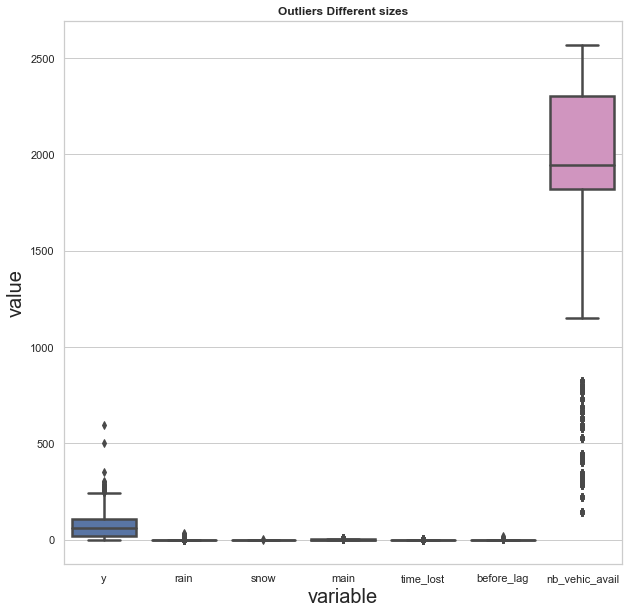

In [18]:
fig = plt.figure(figsize=(10,10))

sns.set_theme(style="whitegrid")

plt.title('Outliers Different sizes', fontweight='bold')

plt.xlabel("variable", fontsize = 20)
plt.ylabel("value", fontsize = 20)

sns.boxplot(data=data, linewidth=2.5)

plt.show()

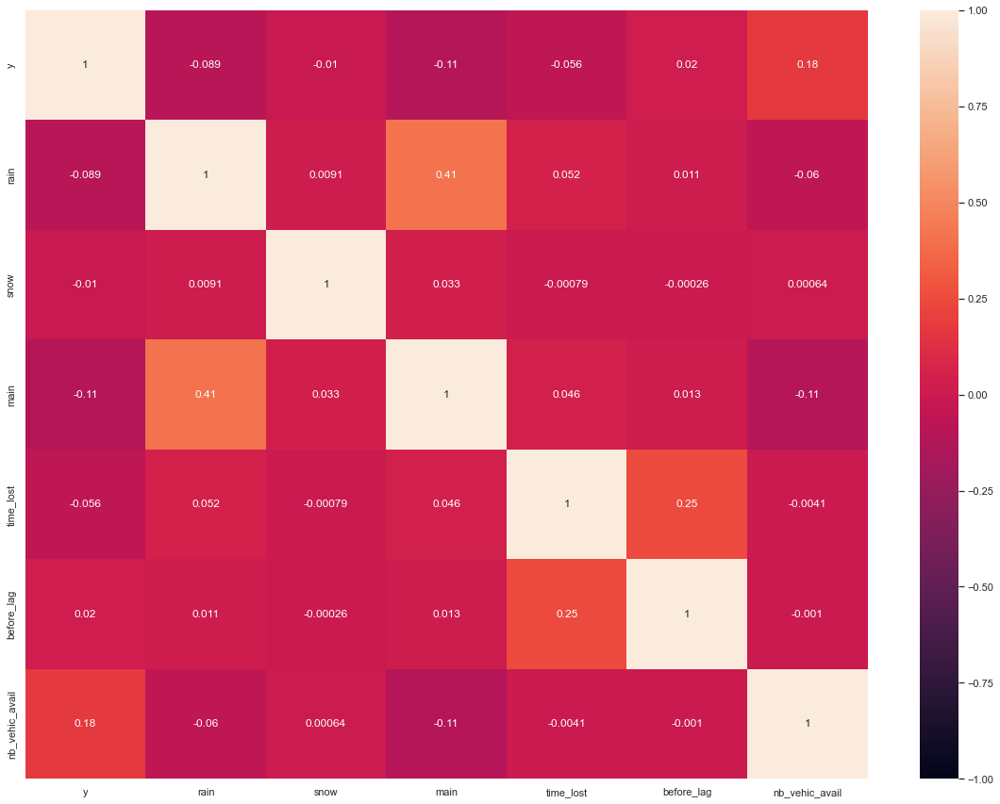

In [19]:
# Column collinearity - any high correlations?

plt.figure(figsize=(20, 15))

heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True)

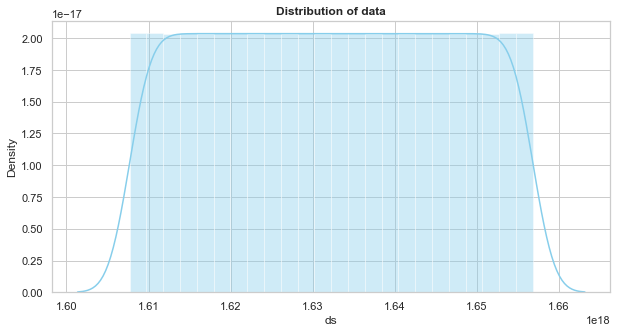

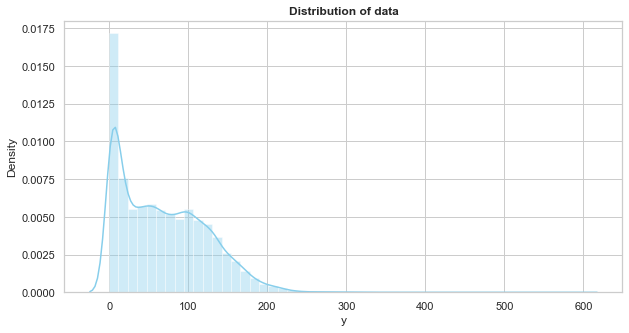

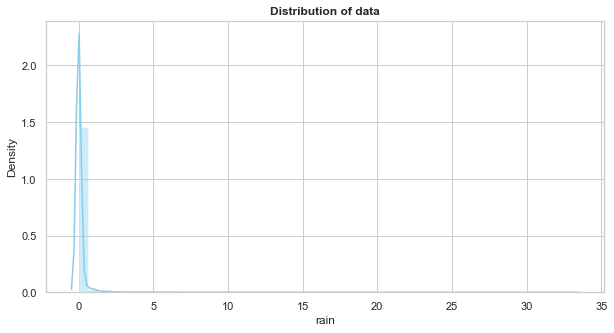

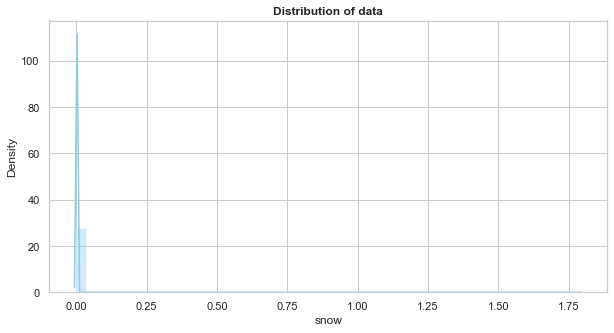

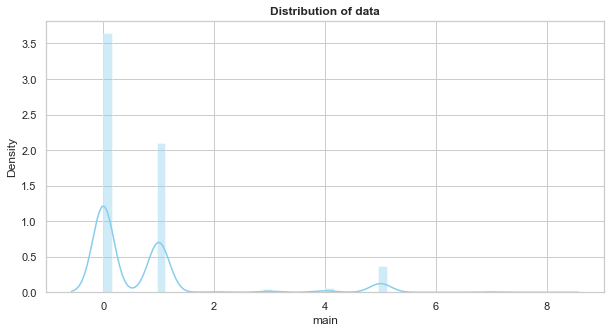

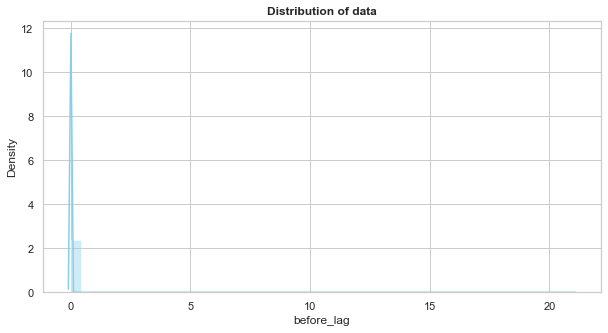

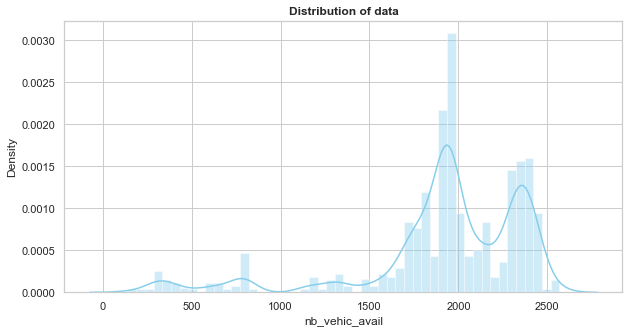

In [20]:
#Plot distribution of data of columns with numerical values
colum = ['ds','y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
#colum = ['y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
for col in colum:
    f, axes = plt.subplots(figsize=(10, 5), sharex=True)
    plt.title('Distribution of data', fontweight='bold')
    sns.distplot(data[col],hist=True, color="skyblue")
    plt.xlabel(col)
    plt.show()

In [21]:
data.to_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Data clean/clean_data_italy_rome_scooter.csv')

## Apply model Prophet

In [22]:
x = len(data) - len(data)*0.8
x

2729.3999999999996

In [23]:
#Train data set
data_train = data[:-2729]
data_train


,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
752421,2020-12-11 15:00:00,31,0.0,0.0,0,0.0,0,436.0
752422,2020-12-11 16:00:00,51,0.0,0.0,0,0.0,0,436.0
752423,2020-12-11 17:00:00,47,0.0,0.0,0,0.0,0,436.0
752424,2020-12-11 18:00:00,64,0.0,0.0,0,0.0,0,436.0
752425,2020-12-11 19:00:00,66,0.0,0.0,1,0.0,0,436.0
...,...,...,...,...,...,...,...,...
763334,2022-03-11 08:00:00,53,0.0,0.0,1,0.0,0,2566.0
763335,2022-03-11 09:00:00,60,0.0,0.0,1,0.0,0,2566.0
763336,2022-03-11 10:00:00,47,0.0,0.0,1,0.0,0,2566.0
763337,2022-03-11 11:00:00,57,0.0,0.0,1,0.0,0,2566.0


In [24]:
#Test data set
data_test = data[-2729:]
data_test

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
763339,2022-03-11 13:00:00,104,0.0,0.0,1,0.0,0,2566.0
763340,2022-03-11 14:00:00,88,0.0,0.0,1,0.0,0,2566.0
763341,2022-03-11 15:00:00,82,0.0,0.0,1,0.0,0,2566.0
763342,2022-03-11 16:00:00,87,0.0,0.0,1,0.0,0,2566.0
763343,2022-03-11 17:00:00,112,0.0,0.0,0,0.0,0,2566.0
...,...,...,...,...,...,...,...,...
766063,2022-07-03 01:00:00,0,0.0,0.0,1,0.0,0,1487.0
766064,2022-07-03 02:00:00,0,0.0,0.0,1,0.0,0,1487.0
766065,2022-07-03 03:00:00,0,0.0,0.0,1,0.0,0,1487.0
766066,2022-07-03 04:00:00,0,0.0,0.0,1,0.0,0,1487.0


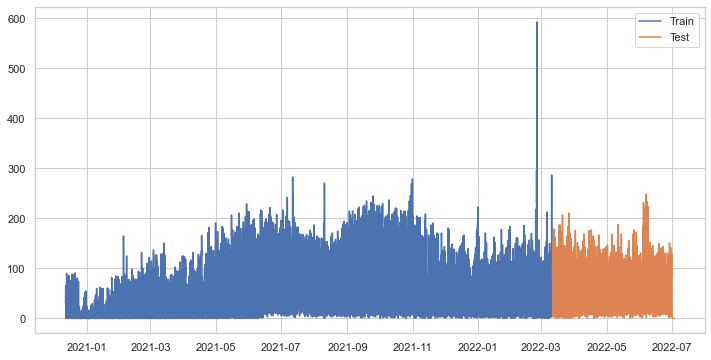

In [25]:
from matplotlib.pylab import rcParams

rcParams['figure.figsize']=12,6

#plotting the data
plt.plot(data_train['ds'],data_train['y'], label='Train')
plt.plot(data_test['ds'],data_test['y'], label='Test')
plt.legend()

In [26]:
#Aplly model

def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', yearly_seasonality = True, changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'ITALY'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)
    
    
    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [27]:
m = fit_model(data_train, 'ITALY')

Initial log joint probability = -49.693
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29797.3     0.0196194       9970.56           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       29966.8    0.00314914       961.162           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30035.3   0.000876807       203.939           1           1      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30046.3    0.00648315       1121.88      0.9061     0.09061      502   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30056.7    0.00391063       709.965      0.2757           1      620   
    Iter      log prob        ||dx||      ||grad||       alpha   

In [28]:
#To use forecast = m.predict(future), have to add future values of (rain,snow,main,time_lost,before_lag,nb_vehic_avail)
#Our use the model wihtout the regressoers for (rain,snow,main,time_lost,before_lag,nb_vehic_avail)

forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2724,2022-07-03 01:00:00,14.176811,-45.471369,72.618103
2725,2022-07-03 02:00:00,9.735271,-36.173458,54.089432
2726,2022-07-03 03:00:00,5.307731,-30.847814,42.038661
2727,2022-07-03 04:00:00,2.671906,-30.342053,33.699560
2728,2022-07-03 05:00:00,3.478656,-27.895924,36.896057


In [29]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Assunzione della Vergine,Assunzione della Vergine_lower,Assunzione della Vergine_upper,Capodanno,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2022-03-11 13:00:00,62.865283,63.068265,120.979635,62.865283,62.865283,0.0,0.0,0.0,0.0,...,0.047461,0.047461,0.047461,-0.149553,-0.149553,-0.149553,0.0,0.0,0.0,91.847285
1,2022-03-11 14:00:00,62.850558,69.604962,126.857492,62.850558,62.850558,0.0,0.0,0.0,0.0,...,0.048651,0.048651,0.048651,-0.150385,-0.150385,-0.150385,0.0,0.0,0.0,99.225382
2,2022-03-11 15:00:00,62.835834,70.990179,128.947406,62.835834,62.835834,0.0,0.0,0.0,0.0,...,0.049866,0.049866,0.049866,-0.151215,-0.151215,-0.151215,0.0,0.0,0.0,100.654525
3,2022-03-11 16:00:00,62.821109,72.114199,131.475491,62.821109,62.821109,0.0,0.0,0.0,0.0,...,0.051109,0.051109,0.051109,-0.152044,-0.152044,-0.152044,0.0,0.0,0.0,101.774491
4,2022-03-11 17:00:00,62.806385,82.876847,139.514843,62.806385,62.806385,0.0,0.0,0.0,0.0,...,0.052382,0.052382,0.052382,-0.152872,-0.152872,-0.152872,0.0,0.0,0.0,110.933418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2724,2022-07-03 01:00:00,22.755902,-45.471369,72.618103,-62.900287,104.608453,0.0,0.0,0.0,0.0,...,0.066355,0.066355,0.066355,0.137713,0.137713,0.137713,0.0,0.0,0.0,14.176811
2725,2022-07-03 02:00:00,22.741178,-36.173458,54.089432,-63.022542,104.651243,0.0,0.0,0.0,0.0,...,0.063620,0.063620,0.063620,0.137869,0.137869,0.137869,0.0,0.0,0.0,9.735271
2726,2022-07-03 03:00:00,22.726454,-30.847814,42.038661,-63.129186,104.694033,0.0,0.0,0.0,0.0,...,0.060597,0.060597,0.060597,0.138025,0.138025,0.138025,0.0,0.0,0.0,5.307731
2727,2022-07-03 04:00:00,22.711729,-30.342053,33.699560,-63.194455,104.736823,0.0,0.0,0.0,0.0,...,0.057291,0.057291,0.057291,0.138179,0.138179,0.138179,0.0,0.0,0.0,2.671906


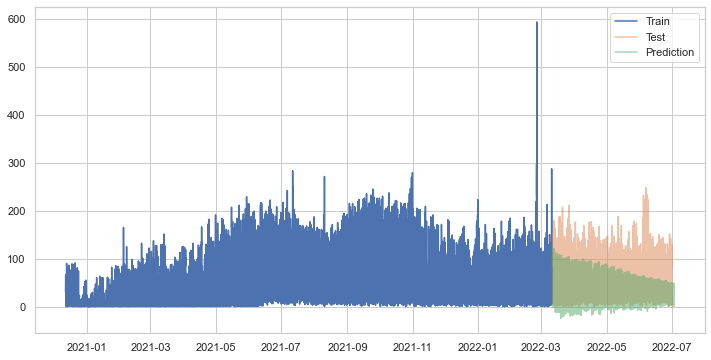

In [30]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

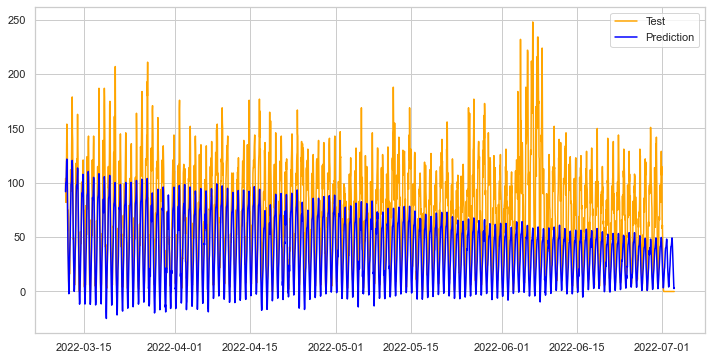

In [31]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

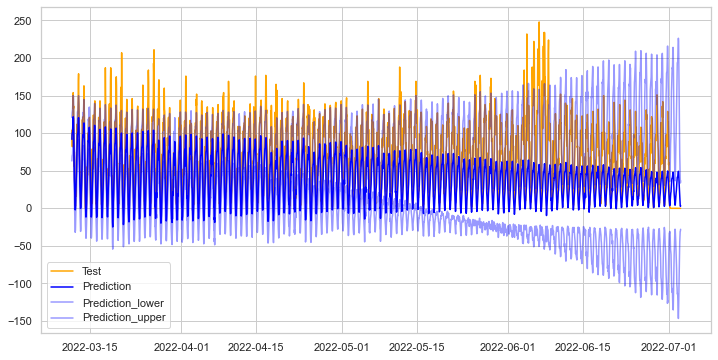

In [32]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

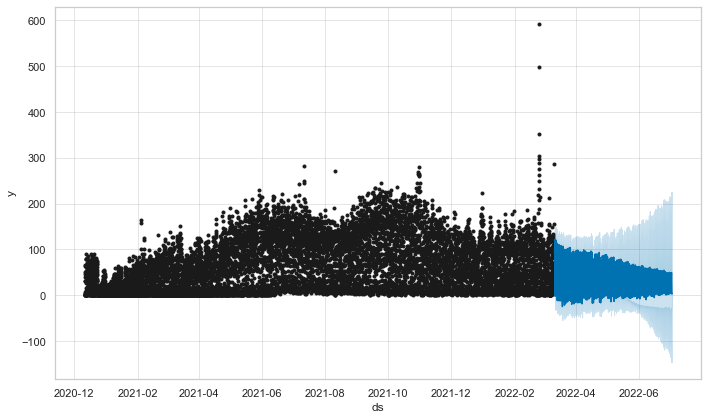

In [33]:
fig1 = m.plot(forecast)

In [34]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [35]:
plot_components_plotly(m, forecast)

## Test model - Cross validation

In [36]:
len(data_test['y'])


2729

In [37]:
len(forecast['yhat'])

2729

In [38]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  44.15615731063969


In [39]:
#calculate Mean Absolute Error(MAE)
from math import sqrt
from sklearn.metrics import mean_squared_error

mae = mean_squared_error(data_test['y'],forecast['yhat'])

print('The mean absolute error score for the model is: ', mae)

The mean absolute error score for the model is:  1949.7662284419591


In [40]:
#Coefficient of Determination or R^2
from sklearn.metrics import r2_score

r2 = r2_score(data_test['y'],forecast['yhat'])

print('The coefficient of determination of r2 score for the model is: ', r2)

The coefficient of determination of r2 score for the model is:  0.05270605034126852


In [41]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

y_true = data_test['y'].values
y_pred = forecast['yhat'].values

mae_01 = mean_absolute_error(y_true, y_pred)
mape_01 = mean_absolute_percentage_error(y_true, y_pred)

print('The mean absolute error for the model is: ', mae_01)
print('\n')
print('The mean absolute percentage error for the model is: ', mape_01)

The mean absolute error for the model is:  35.55510806788732


The mean absolute percentage error for the model is:  2326124831011161.0


In [42]:
days_train = data['ds'].iloc[13646] - data['ds'].iloc[0]
days_train

Timedelta('568 days 14:00:00')

In [43]:
days_test = data['ds'].iloc[13646] - data['ds'].iloc[10918]
days_test

Timedelta('113 days 16:00:00')

In [44]:
total_days = days_train + days_test
total_days

Timedelta('682 days 06:00:00')

In [45]:
import warnings
warnings.filterwarnings("ignore")

In [46]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='200 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 47 forecasts with cutoffs between 2021-07-04 12:00:00 and 2022-02-19 12:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53594a4f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -72.7498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -80.4346
Initial log joint probability = -121.916
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.2178
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -91.1693
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -109.716
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -77.2945
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -84.9455
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11008.6    0.00655015       1385.12      0.4939           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9737.21     0.0327242       629.902           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11240.6   0.000719853       358.298           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12000.2    0.00203079       325.612           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       117

     599       12076.5   0.000441167       634.607        0.21        0.21      742   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       11321.3   0.000506433        94.209           1           1      752   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       9825.15   0.000616969        132.87           1           1      873   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       11829.5   0.000798378       162.187       0.556       0.556      769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       11587.9    0.00477662        523.26           1           1      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       11087.4    0.00078186       220.119           1           1      899   
    Iter      log 

    1199       11106.2    0.00350048       487.894       2.234      0.2234     1555   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1104         10289   8.90653e-05       355.939    1.26e-06       0.001     1550  LS failed, Hessian reset 
    1099       11606.7    0.00444808       388.453           1           1     1352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       11836.9    8.0751e-05       170.285      0.1861           1     1429   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       11335.5    0.00108163       228.754      0.7764      0.7764     1553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1268       9841.67   1.14244e-05       115.938   5.389e-08       0.001     1720  LS failed, Hessian reset 
    1199       12103.3    0.00782519       266.482      0.2062

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599       11339.9    0.00106002       548.755      0.2904      0.7524     2089   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       12105.4   0.000220944       103.122       3.751           1     1974   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       10295.2    0.00281265       385.386       2.274      0.2274     2224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       9844.15   4.95679e-06       75.3469      0.5772      0.5772     2322   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1699       11113.4   1.10904e-05       68.8508       0.716       0.716     2215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       11845.8   0.000245106       485.754       0.611       0.611     2105   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       12360.4   5.24745e-05       109.466           1           1     1922   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       9844.88    0.00139126       107.799      0.6476      0.6476     2437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       10295.8   0.000361012        73.118      0.2847           1     2351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599         12106   7.30645e-05       98.5467      0.9131      0.9131     2099   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2099       11343.7    0.00129874       536.289           1           1     2767   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       12361.9   0.000911756       110.418           1           1     2490   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2278       9847.11   1.72542e-05        197.73   2.068e-07       0.001     3113  LS failed, Hessian reset 
    1999       11848.9   0.000720633       445.498           1           1     2779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       9847.12   1.80755e-07       56.6242      0.2109      0.2109     3140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2300       9847.12   6.58056e-07       63.0686      0.1418       0.482     3142   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2029         11849   5.65599e-06       74.9458   5.902e-08       0.001     2859  LS failed, Hessian reset 
    1960       12363.7   4.67612e-05       630.414   1.416e-07       0.001     2618  LS failed, Hessian reset 
    2399       11118.7    0.00132018       277.287      0.1103           1     3149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       12108.1   1.15721e-05       87.6058      0.5784      0.5784     2839   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       12364.9    0.00152456       2477.84      0.6738      0.6738     2663   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       11350.7    0.00189392       399.257           1           1     3035   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2096       11849.2   5.87924e-05       180.995   4.725e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2599       11119.2   1.34858e-05       143.787      0.1254      0.1254     3411   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       12111.6    0.00784245       228.577           1           1     3089   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2167       12366.1   1.72156e-06       57.0181      0.1985           1     2919   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2499       11354.2   0.000117066       197.717      0.6836      0.6836     3294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2530       11354.5   6.39855e-06       99.7741   1.841e-08       0.001     3377  LS failed, Hessian reset 
    2668       11119.2   1.40197e-05       213.929   1.314e-07       0.001     3547  LS failed, Hessian reset 
    2680       11119.2   3.42321e-07       70.2211      0.7137      0.7137     3565   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2399       12114.3     0.0147479       640.853           1           1     3221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -82.7369
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2561       11354.6   5.14452e-06       135.811   5.066e-08       0.001     3461  LS failed, Hessian reset 
    2599       11354.7   0.000160181       254.058      0.1015      0.2701     3518   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2499       12115.1   0.000457809       618.372           1           1     3348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12451.2    0.00912007       758.784           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       11354.8   0.000136443       86.5534           1           1     3652   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2701       11354.8   4.69681e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2799       12116.2    0.00180625       116.774           1           1     3759   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12533.3    0.00730549       597.463           1           1      489   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12539.8   0.000408429       617.968     0.03488           1      616   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2896       12116.6   3.40048e-06       74.5177   1.927e-08       0.001     3925  LS failed, Hessian reset 
    2899       12116.6   0.000234378       88.2992           1           1     3930   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.03
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       12544.3    0.00153962       158.196      0.9415      0.9415      741   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2999       12116.9   8.74672e-05       130.823           1           1     4061   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.3961
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12708.1     0.0100411       985.289           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3064       12116.9   4.87227e-07       64.8011      0.2231      0.2231     4139   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       12546.1   0.000457565       155.102           1           1      872   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       12963.5    0.00283398       514.076      0.1461           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12740.9     0.0549584       1078.71           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         12548    0.00335638       102.379       0.247           1     1006   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         12995    0.00788797       267.683           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12768.8    0.00524794       670.311       1.326      0.1326      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -90.4208
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       12552.8     0.0120706       599.098      0.4372           1     1136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       13015.4     0.0229314       186.279       1.525      0.1525      377   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12775.9   0.000233064       196.421           1           1      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -93.0435
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13212.9    0.00465351       638.351           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       12559.8    0.00873891       324.785           1           1     1258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       12784.8     0.0052878       920.558           1           1      603   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -106.225
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         13026    0.00320328       156.737      0.8938      0.8938      499   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13478.7    0.00583185       1781.96      0.4069      0.4069      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13247.5    0.00850898       314.711       3.128      0.3128      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1046         12561   7.27602e-06       93.2422   4.308e-08       0.001     1373  LS failed, Hessian reset 
     421         13028   4.71552e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -100.479
     399       13554.6    0.00347366       262.684      0.7096      0.7096      501   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       12562.4   0.000191362       134.031           1           1     1740   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       13301.7    0.00310973       338.831      0.3287           1      613   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       13040.8   0.000532939       190.897      0.6806      0.6806      987   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       13788.2     0.0127944       372.527           1           1      481   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599       12564.2   6.72845e-06       73.3565           1           1     2175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -136.095
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     622       13805.8   3.07984e-05       348.041   8.756e-08       0.001      795  LS failed, Hessian reset 
    1199       12815.3   0.000236066       81.9527           1           1     1499   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         14030    0.00129432       313.161           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       13046.6   8.78816e-05       108.132     0.02666      0.6294     1414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         13581    0.00259565    

    1099       13819.6   0.000135817       272.526      0.4422      0.4422     1474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       13590.2      0.001447       131.619           1           1     1631   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       14057.1     0.0146171       573.772           1           1     1081   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       12566.5   2.17775e-05       70.0157           1           1     3024   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       13327.3    0.00368655       102.597           1           1     1814   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       12823.5    0.00534114       434.135           1           1     2279   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599       13332.7     0.0249865       1327.68           1           1     2050   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1311       13826.4   2.32191e-05       327.774   1.415e-07       0.001     1770  LS failed, Hessian reset 
    1999         12826   0.000123683       132.899      0.2937           1     2532   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1499       13592.1    0.00107632       171.403      0.5443           1     1936   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1082       14059.6   1.11886e-05       121.731   4.732e-08       0.001     1395  LS failed, Hessian reset 
     799       14324.6   0.000249847       255.542      0.2232           1      984   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       13057.9      0.006767       841.182      0.3879       0.987     2427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         14060   0.000781169       103.273           1           1     1414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       13828.4   0.000917764       207.947           1           1     1870   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1990       13336.8   1.34304e-05       122.686   2.367e-08       0.001     2743  LS failed, Hessian reset 
    1999       13336.9   8.24912e-05       65.9027           1           1     2755   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       13064.9   0.000136324       96.1666      0.5598      0.5598     3123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       13601.2      0.004577       440.346           1           1     2640   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       14331.3   0.000406867       184.961       0.973       0.973     1658   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       14068.6   0.000984923       150.203      0.4931      0.4931     2085   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2022       13601.3   9.23026e-06       121.049   2.309e-08       0.001     2718  LS failed, Hessian reset 
    2038       13336.9   7.23995e-06       96.4258   1.146e-07       0.001     2850  LS failed, Hessian reset 
    1899       13832.4   1.93533e-05       166.782           1           1     2550   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2055       13336.9   5.95186e-07       63.1277      0.3412           1     2875   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2299         13065    0.00265776       324.9

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1257       14333.6   1.79439e-05       226.669   3.462e-08       0.001     1768  LS failed, Hessian reset 
    1934       13832.4   2.62288e-06       70.2534   4.873e-08       0.001     2639  LS failed, Hessian reset 
    2082       13601.4   4.57199e-06       55.3241   2.253e-08       0.001     2845  LS failed, Hessian reset 
    1699       14069.8    0.00113265        132.42      0.8298      0.8298     2209   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299         14335    0.00126992       638.638       1.289      0.1289     1821   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       13601.4   1.24619e-05        64.156      0.6592      0.6592     2872   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       13066.3    0.00267259       107.455      0.2611           1     3368   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -130.85
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       14336.8   1.37389e-05       79.4085      0.4867      0.4867     2238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2374       13602.2   5.79588e-06       127.386   6.746e-08       0.001     3334  LS failed, Hessian reset 
    2399       13602.2   4.25835e-05       183.332           1           1     3371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       14071.6   2.47292e-05       106.392      0.3653      0.7512     2716   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799       13069.2    0.00170825       290.842     0.04238           1     3893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       14337.1   0.000608411     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2858       13069.4   4.50999e-06       112.852    4.93e-08       0.001     4020  LS failed, Hessian reset 
    2199       14071.9   0.000394517       156.725     0.05128      0.5966     2853   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2899       13069.5     0.0001542       105.103           1           1     4074   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       14339.9    0.00583029       279.398      0.6143      0.6143     2467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       14483.7    0.00315581       339.152           1           1      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2269       14072.1    4.7143e-06       92.3763   4.146e-08       0.001     2982  LS failed, Hessian reset 
    2299       14072.1   9.99676e-05       100.709           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -133.943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3024       13069.7   3.50466e-06       59.0288   2.123e-08       0.001     4297  LS failed, Hessian reset 
    2372       14072.2   5.32884e-07        66.508      0.2286           1     3122   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1956       14345.4   6.35749e-06       161.026   4.014e-08       0.001     2706  LS failed, Hessian reset 
     399         14524   0.000814996       227.209           1           1      497   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3099       13069.8   2.45677e-06       80.5393     0.05683           1     4397   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999         14346   0.000672511       165.408      0.8033           1     2763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3120       13069.8   1.49969e-06       55.0513      0.1862           1     4419   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       14666.1    0.00698148       564.957           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -141.798
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2013       14346.1   3.51278e-06       88.0465   3.326e-08       0.001     2822  LS failed, Hessian reset 
     499       14530.8    0.00122053       851.697       0.251           1      619   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       14699.6     0.0029455       541.762      0.2128      0.2128      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       14346.6    0.00065314       574.878      0.4412      0.4412     2936   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       14767.5      0.023896       672.491           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       14540.7    0.00421014    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     780       14553.6   2.10519e-05       176.491   4.441e-08       0.001     1031  LS failed, Hessian reset 
Initial log joint probability = -112.252
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       14554.6    0.00222079       223.914           1           1     1053   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       14745.7    0.00870275       913.657      0.4531           1      618   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2295       14347.5   5.09502e-06       127.037   3.338e-08       0.001     3298  LS failed, Hessian reset 
    2299       14347.5   0.000258683       132.547          10           1     3303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       14852.7     0.0109717         886.6      0.2834      0.2834      489   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       14759.2     0.0254487       284.489      0.2266           1      738   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       14555.7     0.0150367       273.678           1           1     1187   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -132.409
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       14347.7   9.94503e-05       123.696           1           1     3429   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       14870.9   0.000417213        539.37      0.6434      0.6434      605   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       15041.2    0.00624893       535.105      0.6569      0.6569      242   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       15062.4     0.0105973       1249.06      0.8462      0.8462      473   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -128.867
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       14349.7   0.000873005       199.349           1           1     3798   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       14565.7   4.93941e-05       293.523      0.3224      0.3224     1571   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       14780.4   7.09518e-05       177.091      0.6841      0.6841     1107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       15279.7     0.0104507        1036.2           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     760       14885.2   1.98333e-05       128.182   4.934e-08       0.001      974  LS failed, Hessian reset 
Initial log joint probability = -124.401
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       15079.1   0.000117447       169.024           1           1      594   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       15438.9     0.0083284       773.273           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       14888.4    0.00437477       324.787           1           1     1022   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799       14350.2    0.00123862       698.458           1           1     3920   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       14567.7   0.000441771    

    1399         14788    0.00944829       367.301           1           1     1876   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3356       14351.9   1.82797e-05       216.213   1.793e-07       0.001     4649  LS failed, Hessian reset 
    1099       15113.6     0.0026314       288.565       1.619      0.1619     1339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3399         14352   3.43096e-05         67.45      0.3018           1     4708   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       15832.9    0.00115756       340.608           1           1      734   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       14572.9    0.00363627        273.45           1           1     2491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599       14913.5    0.00039216       994.037      0.3272           1     2174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2124       14576.9   9.56497e-05       147.645   1.956e-06       0.001     2946  LS failed, Hessian reset 
    1299       15342.3   0.000610666       146.963      0.8237      0.8237     1626   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1767       14798.3   1.85972e-05       441.076   3.845e-08       0.001     2497  LS failed, Hessian reset 
    1499       15126.8     0.0234275       561.726       1.042      0.1042     1831   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       15572.6   7.39447e-05       300.805     0.03704      0.6426     1301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     894       15843.8   2.03662e-05       185.611   2.663e-07       0.001     1236  LS failed, Hessian reset 
    1799       14798.6   0.000164613       200.185      0.1778           1     2539   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2099       14921.4     0.0120076       223.429           1           1     2940   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1381       15854.4   1.16082e-05       178.365   3.476e-08       0.001     1884  LS failed, Hessian reset 
    1499       15581.4   0.000629085       340.044      0.2226      0.2226     2010   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       15352.5   0.000176923       101.709      0.7426      0.7426     2385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       15854.8    0.00190887       335.752           1           1     1908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       15148.5    0.00253053        511.29           1           1     2581   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1999         15353    0.00122552       147.737      0.7355      0.7355     2506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -133.515
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       15149.2   4.28667e-05       218.781           1           1     2705   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       15855.5   0.000295272       118.326           1           1     2038   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2855       14582.9   8.78456e-06       124.923   1.666e-08       0.001     3933  LS failed, Hessian reset 
    1599       15582.1   0.000359014       105.075           1           1     2198   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       14923.2   8.07453e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3171       14585.1   4.38668e-05        479.31   4.721e-07       0.001     4427  LS failed, Hessian reset 
    2437       15149.7   2.32236e-06       64.5186   1.387e-08       0.001     3213  LS failed, Hessian reset 
    3199       14585.3   0.000645458       160.668           1           1     4460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1795         15858   1.31283e-05       205.749   3.097e-08       0.001     2515  LS failed, Hessian reset 
    2399       15356.4    0.00257377       232.902           1           1     3014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799         15858   0.000339434       186.202           1           1     2520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       16035.3   0.000825345       157.425           1           1      492   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3387       14585.4   8.01879e-07       58.0577      0.1752      0.4981     4706   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -130.673
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       15359.3     0.0144955       377.795           1           1     3264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     599       16055.5    0.00768603       551.668           1           1      753   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       15592.3    0.00119761       220.771       0.776       0.776     2941   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2688       15151.4   3.12659e-06       122.127   3.767e-08       0.001     3587  LS failed, Hessian reset 
      99         16080     0.0119939        856.12      0.2522      0.8196      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1989       15858.6   5.80531e-06       72.6609   2.737e-08       0.001     2870  LS failed, Hessian reset 
    2699       15362.3    0.00154237       249.194      0.6984      0.6984     3387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       15151.4   0.000223805       232.043           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2368       15866.7   1.97918e-05       216.345   2.715e-07       0.001     3399  LS failed, Hessian reset 
Initial log joint probability = -138.699
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       15866.9   0.000403339       92.5218      0.4076           1     3437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2619       15597.2   2.53189e-06        59.084   2.397e-08       0.001     3563  LS failed, Hessian reset 
    1099       16074.8    0.00643931       227.597           1           1     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3099         15152   7.98778e-05       211.016      0.6825      0.6825     4224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3099       15365.5   0.000700961       130.308      0.2346      0.7844     4037   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3170       15365.8   4.70111e-06       138.891   2.082e-08       0.001     4172  LS failed, Hessian reset 
    3199       15152.5   0.000400782        126.86           1           1     4419   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -136.684
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         16184    0.00532605       650.734      0.1465           1      868   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       16266.9    0.00172858       465.688           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3194       15365.9   2.69558e-06       89.6288   3.095e-08       0.001     4252  LS failed, Hessian reset 
    2799       15597.5    0.00756754       129.038           1           1     3849   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       16193.3   0.000717903       337.136      0.3508     0.03508     1108   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       16478.4     0.0023111       243.652      0.9811      0.9811      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2670         15868    1.3591e-05       125.961   1.813e-08       0.001     3933  LS failed, Hessian reset 
     399       16306.6    0.00198021       554.872           1           1      493   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       15868.2   0.000108262        193.25      0.5507           1     3969   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3440         15153   1.89413e-06        80.549   1.727e-08       0.001     4769  LS failed, Hessian reset 
    2999       15598.7   0.000269215       89.3032           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3521         15153   2.52264e-06       104.697   3.348e-08       0.001     4930  LS failed, Hessian reset 
    1013       16195.9    7.2455e-06        71.616   5.692e-08       0.001     1338  LS failed, Hessian reset 
    3099       15598.8   3.37277e-05       58.0782      0.5313      0.5313     4291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       16092.2    0.00101098       333.926           1           1     2062   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       16525.2     0.0034393       227.702           1           1      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       16328.6     0.0126141       1315.23           1           1      725   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3599         15153   7.54938e-06       79.6718       2.199

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3199         15599   5.23601e-05       203.446      0.6361      0.6361     4423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699         16094   0.000369385       510.622      0.3481      0.3481     2184   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       16344.2    0.00397631       1452.01      0.2627           1      849   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       16540.6    0.00210307       498.362      0.2186      0.2186      605   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3222       15599.1   3.72971e-06       108.076   3.522e-08       0.001     4505  LS failed, Hessian reset 
    1199       16201.6    0.00407902       239.643           1           1     1580   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -197.854
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       16095.6   0.000508603       218.936       0.206       0.206     2664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     989       16348.8   5.62977e-06       76.4838   4.853e-08       0.001     1301  LS failed, Hessian reset 
    1499       16206.7    0.00458448       524.571           1           1     1965   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16348.9   9.69992e-05       223.327           1           1     1314   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3581       15601.6   5.25902e-06       168.833    3.51e-08       0.001     5010  LS failed, Hessian reset 
     899       16566.5    0.00208588       821.343           1           1     1121   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       16353.1     0.0169771       794.789      0.6402      0.6402     1449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -141.843
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1585       16213.8   6.27841e-06       109.708    3.65e-08       0.001     2124  LS failed, Hessian reset 
    1599       16214.2   0.000180546       278.792      0.5523           1     2141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2115       16095.8   1.55129e-06       48.8701   2.413e-08       0.001     2875  LS failed, Hessian reset 
     199       16706.6    0.00276186       435.121           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16567.2    0.00330496       1329.45      0.2286           1     1261   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       16898.6     0.0193743       1437.05           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       16095.9   0.000201794       430.901          10           1     2982   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       16215.4    0.00210277       1363.31      0.3652           1     2264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -166.463
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3799       15602.3    0.00046415       215.238      0.2417           1     5297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       16732.8     0.0034554       594.322           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1808       16216.1   8.45128e-06       61.6104   2.638e-08       0.001     2451  LS failed, Hessian reset 
    1825       16216.2   2.25104e-07       45.0589    0.001241           1     2478   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1144         16570   1.42271e-05       177.357   3.564e-08       0.001     1561  LS failed, Hessian reset 
    1299       16359.8    4.9221e-05        137.97           1           1     1814   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3999       15602.6     0.0003232       374.265     0.09607           1     5549   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       16988.2    0.00382179       257.046           1           1      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17211.5     0.0274921       2441.88      0.3748           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       16570.2    7.1444e-05       73.5093      0.3557           1     1628   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       16786.3    0.00361931       1463.82           1           1      590   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       16360.5   0.000724529       338.031      0.6811      0.6811     1935   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       17018.3    0.00189452       1470.78     0.01061      0.3496      614   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       16801.9   0.000909312       190.699           1           1      827   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       17261.2    0.00237172       798.513      0.4684           1      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       16577.2    0.00014212       192.068     0.06597           1     1886   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       16362.5   0.000589966       129.547           1           1     2181   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       16804.8    0.00046999       484.102      0.2201      0.2201      945   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -150.369
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899       16368.7     0.0315767        1234.2           1           1     2609   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -168.839
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       16813.9    0.00016966         321.4      0.3716      0.3716     1303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     871       17043.7   8.30282e-05       349.732   1.059e-06       0.001     1108  LS failed, Hessian reset 
     799         17291    0.00248267       250.521      0.5187      0.5187      973   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       16585.7    0.00234887       418.919       2.781     0.02781     2382   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       17044.1   0.000453065    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -154.343
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17692.7     0.0166853       1206.45           1           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2096       16375.6   7.66575e-06       172.641   9.721e-08       0.001     2914  LS failed, Hessian reset 
    2099       16375.7   4.16899e-05        333.88           1           1     2919   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       16592.9   0.000596453       485.656      0.2731      0.2731     2640   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17295.7    0.00283823       125.452           1           1     1251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       16815.9   1.61139e-05    

    2499       16377.6   0.000354966         192.8           1           1     3641   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2501       16599.6    4.2658e-06       116.705   6.692e-08       0.001     3360  LS failed, Hessian reset 
     799       17546.5     0.0192926       3322.11           1           1     1007   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       17311.3   0.000317434       221.933           1           1     1923   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599         17060    0.00140358       177.521       0.821       0.821     2116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2505       16377.6   2.76681e-06       66.5705   1.858e-08       0.001     3700  LS failed, Hessian reset 
     599       18041.4    0.00673393       865.158      0.3585

    1199       17798.3    0.00388187       292.163      0.7953      0.7953     1553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799       16600.3   3.64528e-06       57.9395           1           1     4030   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1219       17565.5   3.46932e-06       58.7493   3.727e-08       0.001     1636  LS failed, Hessian reset 
     999       18054.6   0.000412556       187.623       0.858       0.858     1335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       17068.5    0.00107978         108.9      0.8227      0.8227     2780   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1953       17319.3   8.70451e-06       194.767   6.523e-08       0.001     2608  LS failed, Hessian reset 
    3031       16381.8   2.55956e-06       95.3135   2.141e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2199       17319.9   5.25573e-05       109.822      0.2521           1     2985   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       17075.2   0.000398162        216.07           1           1     3191   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       17801.7   0.000116319       122.391           1           1     1999   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       16845.7    0.00403665       319.284           1           1     3419   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599       17575.5    0.00368241       226.985      0.8803      0.8803     2159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       18074.8    0.00208587       415.729           1           1     1820   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3374       16383.3   2.38525e-06       81.8589    1.73e-08       0.001     4958  LS failed, Hessian reset 
    2499       17076.9   0.000229561       167.798           1           1     3315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       17802.6   0.000211827       127.241           1           1     2125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       16846.4   0.000741692       108.035      0.7664     0.07664     3552   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2999       16847.7   0.000407618        106.58           1           1     4054   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       18078.6     0.0014666        122.75           1           1     2331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3746       16384.7   2.08071e-05       414.823   1.104e-07       0.001     5521  LS failed, Hessian reset 
    2552       17320.6   7.18577e-06       159.393   1.009e-07       0.001     3653  LS failed, Hessian reset 
    1899       17803.6   0.000578361       244.229      0.6937      0.6937     2654   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099         17606    0.00253797       147.132           1           1     2754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3799       16385.1   7.71511e-05       68.4416      0.8461

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2589       17320.6   1.83259e-06        50.769      0.3034           1     3746   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    3099       16847.8   2.66858e-05       160.765       7.218      0.7218     4198   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -156.215
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1864         18079   2.90428e-06       68.4537   2.929e-08       0.001     2471  LS failed, Hessian reset 
    2199       17608.6    0.00517077       188.835           1           1     2871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3834       16385.2   6.29482e-06       57.4865   1.227e-08       0.001     5681  LS failed, Hessian reset 
    1999         17812    0.00434684       1318.47      0.2481           1     2780   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899         18079   2.55468e-06       86.3845      0.2652      0.2652     2521   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3899       16385.3   0.000126897       90.0774           1           1     5778   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3199       16847.9   3.16432e-05       74.5697       5.174

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2399       17828.6    6.9439e-05       532.821      0.3881      0.3881     3258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2199       18082.8   0.000497834       704.509      0.5813      0.5813     3024   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -164.763
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3599       16848.7   7.51175e-07       72.8622      0.3248           1     4846   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3601       16848.7   7.49825e-07       55.5612      0.3712           1     4849   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       18313.5    0.00767863       1263.99      0.5092           1      601   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2688       17616.4   1.22714e-06       136.711   9.071e-09       0.001     3514  LS failed, Hessian reset 
    2499       17830.4   0.000546919       218.605      0.2766      0.8361     3384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2299       18084.2    4.2073e-05       122.801       0.313           1     3164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2696       17616.4   1.58634e-06       143.645   1.648e-08       0.001     3568  LS failed, Hessian reset 
    2699       17616.4   2.19539e-05       242.211          10           1     3572   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18411.7    0.00522283       2312.06           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -229.829
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       18320.4    0.00172332       473.917           1           1      721   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2316       18084.3   4.17636e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3131         17619   5.26005e-06       221.017   4.536e-09       0.001     4189  LS failed, Hessian reset 
     599       18578.6    0.00115429       135.292           1           1      709   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       18825.8    0.00568325       1770.13           1           1      598   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2770       18086.1   8.46385e-06       158.184   1.245e-07       0.001     3843  LS failed, Hessian reset 
    2956       17835.1   5.18307e-06       265.651    1.27e-08       0.001     4142  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       18338.4     0.0170656       888.979           1           1     1388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3199       17619.1   0.000182617       395.714           1           1     4283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -172.533
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799       18086.2   4.92213e-06       48.8535      0.9383      0.9383     3878   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18921.8       0.01463       1471.88           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2814       18086.2    1.6146e-06       56.9421      0.2405           1     3898   
Optimization terminated normally: 
  Convergence detected: relat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       18584.9   0.000646456        129.11           1           1      836   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       18839.1    0.00361809       274.923           1           1      725   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3059       17835.3   4.15615e-06       84.6537      0.1951           1     4288   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1199       18343.7    0.00449796       1492.31           1           1     1511   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3299       17619.2   7.84221e-05        71.026      0.5468      0.5468     4414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19087.8    0.00979811       3112.02      0.1667           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       18993.8    0.00569588       623.917      0.5292      0.5292      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18588.9   0.000329792       425.399      0.2549           1      949   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3351       17619.2   2.24823e-06       58.6729       1.289      0.1289     4485   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       18844.8     0.0124247       478.609           1           1      846   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1299       18346.4   0.000789874       471.579      0.3768      0.3768     1634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19201.3     0.0110617        2072.5      0.8646      0.8646      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         18595    0.00399134       216.549           1           1     1072   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19015.1    0.00287385       188.737           1           1      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18854.3   0.000954955       218.777           1           1      983   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       18348.3   0.000226762       118.469           1           1     1760   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       18613.5   0.000246613       373.139           1           1     1494   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -185.082
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       18868.1    0.00168555       162.529      0.6569      0.6569     1360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       18356.1     0.0216089       1255.75           1           1     2177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       19282.8    0.00125999       308.454           1           1      740   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       19088.7     0.0138301       745.857      0.3639           1      852   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -174.233
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       18614.7    0.00631442       391.065           1           1     1613   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19343.7    0.00572599       1052.69           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       18871.4    0.00985027       299.749           1           1     1476   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     641       19284.3   2.52273e-05       276.876    1.36e-07       0.001      830  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -243.106
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       18364.5    0.00157969         474.4           1           1     2319   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19103.7    0.00357636       869.881           1           1      978   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19611.9     0.0184182       1047.62           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19285.9   0.000151724       298.569           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       18616.8   0.000343595       173.413      0.3959      0.9518     1735   
    Iter      log prob        ||dx||      ||grad||       alpha  

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       18884.5   0.000291258       712.596     0.04779           1     2245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       18377.1   0.000404307       193.218           1           1     3087   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       18631.1   0.000512056       157.266      0.4896      0.4896     2457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       19124.8   0.000167562       96.7594           1           1     1703   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     638         19739   4.04494e-05       139.838   1.828e-07       0.001      836  LS failed, Hessian reset 
    1199       19318.6     0.0111811        895.84      0.4394           1     16

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       20014.3   0.000486037       116.148           1           1     1102   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2199       18890.2   0.000845888       148.689           1           1     2745   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1460       19322.3   1.20817e-05         216.9   9.737e-08       0.001     2083  LS failed, Hessian reset 
     955       19743.9   5.21387e-05       115.008   1.421e-07       0.001     1273  LS failed, Hessian reset 
    2286         18633   3.32812e-06       93.2059    1.66e-08       0.001     2995  LS failed, Hessian reset 
    1061       19562.9   1.39483e-05       245.491   8.275e-08       0.001     1406  LS failed, Hessian reset 
    2299       18633.1   0.000373059       625.296           1           1     3012   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       19322.4   0.000145201       66.9818      0.7816      0.7816     2136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       1913

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1799       19326.2   0.000549992       288.418      0.5598      0.5598     2692   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1256       20017.9   7.15549e-06       72.2005      0.5727      0.5727     1749   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -181.114
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       18634.6   0.000698608       229.392        0.34        0.34     3619   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1801       19326.2   3.16319e-05        400.31   1.284e-07       0.001     2737  LS failed, Hessian reset 
    1385       19745.3   1.72715e-06       43.8092      0.3014           1     1900   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2299       19144.9    0.00630966       1276.96      0.1424           1     2841   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1599       19579.3   0.000659453       483.375      0.7378     0.07378     2049   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799       18904.3    0.00300576       122.841           1           1     3502   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         20157    0.00718665       990.085           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       19326.5   0.000165566       208.769     0.03997           1     2859   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       19147.4   0.000383435       116.409           1           1     2964   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2792       18636.8   8.50912e-06       280.004   5.439e-08       0.001     3813  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -181.375
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2758       19151.5   2.34868e-06       121.597   2.245e-08       0.001     3506  LS failed, Hessian reset 
     508       20260.6   0.000520903       626.556   4.001e-06       0.001      670  LS failed, Hessian reset 
    3210       18909.1   1.93978e-06       79.5151   1.441e-08       0.001     4168  LS failed, Hessian reset 
    3199       18638.6   0.000113797       173.923      0.9822      0.9822     4386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2031       19584.1   3.09545e-06        90.739   3.326e-08       0.001     2738  LS failed, Hessian reset 
Initial log joint probability = -193.995
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3224       18909.1   4.42593e-06       134.281   8.563e-08       0.001     4229  LS failed, Hessian reset 
    2780       19151.6   1.49545e-05       144.664   2.163e-07       0.001     3586  LS failed, Hessian reset 
    2399       19340.6    0.00518704        2637.8           1           1     3482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3218       18638.6   2.07686e-06       81.2841   2.903e-08       0.001     4458  LS failed, Hessian reset 
    2799       19151.7   4.11906e-05       35.7639      0.3142      0.3142     3613   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         20454     0.0043849       566.458           1   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2201       19586.6   2.66858e-06       80.4937   2.867e-08       0.001     3001  LS failed, Hessian reset 
    3399         18639   0.000119873       223.092      0.4629      0.4629     4696   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3394       18909.9   0.000111389       563.666   5.172e-07       0.001     4505  LS failed, Hessian reset 
    3399         18910   0.000366115        284.12           1           1     4513   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20769.3      0.013253       1201.13       1.911      0.1911      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       19344.2   0.000135356       154.982           1           1     3785   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20516.4     0.0179463       521.244           1           1      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       20268.6   2.50825e-05       110.931       0.274       0.274     1074   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2802       19345.6   5.24275e-06        235.25   1.918e-08       0.001     4085  LS failed, Hessian reset 
     499       20536.6    0.00029693       83.5013           1           1      638   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2399         19587   2.13449e-05       123.129           1           1     3363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3699       18639.7   0.000362261       349.114           1           1     5082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       20270.4     0.0010517       105.721           1           1     1327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     483       20808.6   4.41859e-05       109.194   1.423e-07       0.001      651  LS failed, Hessian reset 
    2860       19346.3   3.64524e-06       94.7468   1.183e-08       0.001     4199  LS failed, Hessian reset 
     499         20809   0.000632455       141.377           1           1      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2455       19587.2   1.23823e-05       348.641   2.398e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3899       18644.3      0.053191       2824.79      0.4805     0.04805     5343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2950       19346.5   3.93503e-06       181.235    2.18e-08       0.001     4369  LS failed, Hessian reset 
     578       20809.6   0.000184805       455.056   1.022e-06       0.001      812  LS failed, Hessian reset 
    1199         20271    0.00042068       111.846      0.3983           1     1576   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         20810   0.000466898       98.9776           1           1      833   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       19587.8   0.000255403       93.6754      0.5263      0.5263     3659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2999       19346.7   9.14108e-06       146.153           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    3999       18648.4   0.000305102       98.3547           1           1     5467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -195.351
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       20271.1   2.18363e-05       103.874      0.6066      0.6066     1697   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3031       19346.7    2.0482e-06       94.3088   1.573e-08       0.001     4513  LS failed, Hessian reset 
     699       20810.3     0.0067273        461.56           1           1      946   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       19589.6    0.00317271       574.159           1           1     3777   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3051       19346.7   1.78851e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       20811.4   0.000467333       71.9899           1           1     1180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -188.924
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2845       19594.2   7.49188e-06        158.15   1.448e-08       0.001     4039  LS failed, Hessian reset 
    3170       19347.3   3.34186e-06       113.165   1.255e-08       0.001     4815  LS failed, Hessian reset 
    3199       19347.7   0.000548911       227.782      0.8949      0.8949     4852   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2899       19594.7    0.00016777       159.262       0.888       0.888     4104   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     962       20811.5   9.27609e-07       47.8011      0.3171      0.3171     1262   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1562       20272.9    0.00238945       136.317   3.129e-05       0.001     2057  LS failed, Hessian reset 
     299       21059.8   0.000858061       312.772           1           1      368   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    4288         18650   1.76241e-06       89.6321   1.268e-08       0.001     5916  LS failed, Hessian reset 
    4299       18650.1    1.0188e-05       69.3675           1           1     5936   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3229       19347.8   2.08289e-06       92.6991   1.613e-08       0.001     4941  LS failed, Hessian reset 
      99       21205.2     0.0025118       505.397           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1598       20272.9   8.69423e-07       45.4867      0.0735           1     2115   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -196.104
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2969       19595.1   3.05172e-06       112.426   3.372e-08       0.001     4246  LS failed, Hessian reset 
     362       21067.6   7.96644e-05       309.022   3.182e-07       0.001      489  LS failed, Hessian reset 
    2999       19595.2   9.26079e-06       99.4031           1           1     4285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3274       19347.9   2.41912e-06       111.099   2.124e-08       0.001     5064  LS failed, Hessian reset 
     199       21300.7     0.0055253       505.315           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       21070.8    0.00123025       254.312      0.5544           1      538   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3099       19595.5   4.33836e-05       182.026           1           1     4456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       21316.8   0.000726152       462.113      0.2415      0.2415      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3399         19348   3.01891e-05       151.035           1           1     5221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       21075.6    0.00153103       248.433           1           1      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       21575.8     0.0118402        323.16      0.7591      0.7591      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       21331.7   0.000723988       406.728      0.2395     0.02395      488   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3599       19349.1   2.94755e-06       129.457   1.543e-08       0.001     5535  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         21607    0.00746713        173.78           1           1      486   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         21338   0.000141861       228.681      0.6227      0.6227      739   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       21080.3   0.000274926       67.7622      0.8453      0.8453     1041   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3699       19349.2   1.87126e-05        126.75      0.9305      0.9305     5661   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       21613.1   0.000696729       187.525      0.9103      0.9103      6

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    3799       19349.3   1.67439e-05       60.0093           1           1     5779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     570       21615.1   4.06257e-05       130.235   1.522e-07       0.001      727  LS failed, Hessian reset 
     599       21615.5   0.000494981       122.056           1           1      762   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     760       21340.4   0.000150098       279.659   1.447e-06       0.001      972  LS failed, Hessian reset 
    3899       19349.5   7.06791e-05       102.888           1           1     5902   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       21340.7   0.000157384       89.8027           1           1     1016   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    3925       19349.5   6.29501e-06       217.812   5.272e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     893         21621   6.56764e-05       159.821   1.372e-07       0.001     1166  LS failed, Hessian reset 
     899       21621.5   0.000571894       397.104     0.09431           1     1174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       21622.3   0.000424477       80.2145           1           1     1297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       21622.5    1.5652e-05       59.9469      0.9254      0.9254     1429   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       21623.2    0.00128696       93.1202      0.6161      0.6161     1543   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       21624.2   0.000288379       79.9115           1           1     1656   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [47]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-07-04 13:00:00,117.469969,93.732294,141.654024,121,2021-07-04 12:00:00
1,2021-07-04 14:00:00,127.426585,104.747186,151.512732,112,2021-07-04 12:00:00
2,2021-07-04 15:00:00,133.754758,109.662582,156.833870,130,2021-07-04 12:00:00
3,2021-07-04 16:00:00,142.171604,117.350954,166.770176,127,2021-07-04 12:00:00
4,2021-07-04 17:00:00,143.819986,119.017705,167.473233,128,2021-07-04 12:00:00


In [48]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,2 days 00:00:00,9.537183e+07,9765.849951,223.240550,0.211239,0.385038,0.788121
1,2 days 01:00:00,9.537183e+07,9765.850089,223.282667,0.212273,0.385977,0.786791
2,2 days 02:00:00,9.537184e+07,9765.850458,223.338972,0.212583,0.387225,0.787677
3,2 days 03:00:00,9.537185e+07,9765.850984,223.464210,0.212933,0.388530,0.785461
4,2 days 04:00:00,9.537185e+07,9765.851048,223.507122,0.213111,0.389043,0.785904


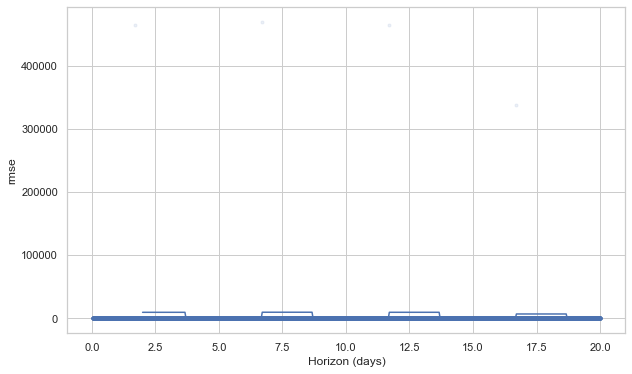

In [49]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

### Hyper Parameter Tuning

In [50]:
# Python
import itertools

param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0], 
    'holidays_prior_scale': [0.01, 0.1, 1.0, 10.0]}

In [51]:
# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

In [52]:
dictest = all_params[1]

In [53]:
dictest.values()

dict_values([0.001, 0.01, 0.1])

In [54]:
from prophet.diagnostics import cross_validation

# Use cross validation to evaluate all parameters
# By default, the initial training period is set to three times the horizon, and cutoffs are made every half a horizon.

rmses = []  # Store the RMSEs for each parameters here
d = {}
for params in all_params:
    liskeys = list(params.values())
    key = (liskeys[0],liskeys[1], liskeys[2])
    m = Prophet(**params, yearly_seasonality=True).fit(data)  # Fit model with given parameters
    data_cv = cross_validation(m, horizon = '30 days', parallel="processes")
    data_p = performance_metrics(data_cv, rolling_window=1)
    rmses.append(data_p['rmse'].values[0])
    d[key] = data_p['rmse'].values[0]

Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80         34642   0.000252338       3023.65   8.864e-08       0.001      175  LS failed, Hessian reset 
      99       34643.2   9.73572e-06       2439.01           1           1      202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       34643.2   6.43422e-08       2605.44      0.2421           1      235   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53594a5b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16176.7   9.49257e-05       4786.61      0.5439      0.5439      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17591.7   9.05771e-07       4739.91      0.3755      0.3755      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16840.4   1.24494e-05       5006.46      0.6824      0.6824      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       18360.2    0.00134339       5086.95    2.46e-07       0.001      140  LS failed, Hessian reset 
      99       29447.7    0.00563556       5129.58           1           1      133   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     146       16840.5   4.04003e-08       5064.36   7.948e-12       0.001      245  LS failed, Hessian reset 
     124       27542.9   6.38614e-08       4612.64   1.311e-11       0.001      210  LS failed, Hessian reset 
     144         28482   3.13035e-08       4832.65      0.1876           1      187   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     149       16840.5    8.9738e-09       4991.37      0.3955           1      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     135       27542.9   6.76617e-09        4753.4      0.2783      0.2783      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       18371.5   2.12243e-06       4934.07      0.7311      0.7311      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       16177.8   6.38726e-07       4570.36   1.139e-10       0.001      329  LS failed, Hessian reset 
     199       16177.8   1.75826e-07       4508.76      0.4057      0.8893      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       29462.8   2.34515e-05       5220.14   4.551e-09       0.001      278  LS failed, Hessian reset 
     197         17606   9.05396e-05       5978.61   1.807e-08       0.001      321  LS failed, Hessian reset 
     208       16177.8   9.31779e-09        4161.6       0.347           1      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       17606.2   4.15929e-05       3750.62           1           1      323   
    Iter      log prob        

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       29462.9   1.01621e-07       4580.09      0.3087      0.3087      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       18371.7   3.21234e-05       4807.96   6.319e-09       0.001      347  LS failed, Hessian reset 
     249       18371.8   8.74584e-09       5232.42      0.6716      0.6716      388   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     271         17608   1.19091e-08       4723.01      0.8363      0.8363      411   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     263       29463.5   6.21706e-09       5245.43      0.1255      0.2837      373   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30484.4   0.000277162       5075.91           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       31443.8   0.000483208       3851.84   1.073e-07       0.001      147  LS failed, Hessian reset 
      78       33227.2   0.000936386       2542.18    2.43e-07       0.001      148  LS failed, Hessian reset 
      79       32350.8   5.67477e-05       2426.48   1.836e-08       0.001      165  LS failed, Hessian reset 
      92       31444.3   1.44024e-05       2276.86   6.631e-09       0.001      202  LS f

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     104       33228.6   7.74054e-08       2325.24   3.191e-11       0.001      266  LS failed, Hessian reset 
     105       33228.6   4.60723e-08       2734.41           1           1      267   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     273       30490.8   1.34863e-07       3013.61   2.756e-11       0.001      395  LS failed, Hessian reset 
     281       30490.8   2.19144e-08       2744.68      0.4781      0.4781      403   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80         34642   0.000252338       3023.65   8.864e-08       0.001      175  LS failed, Hessian reset 
      99       34643.2   9.73572e-06       2439.01           1           1      202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       34643.2   6.43422e-08       2605.44      0.2421           1      235   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53406e130>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16840.4   1.24494e-05       5006.46      0.6824      0.6824      131   
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       29447.7    0.00563556       5129.58           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       16840.5   4.04003e-08       5064.36   7.948e-12       0.001      245  LS failed, Hessian reset 
     149       16840.5    8.9738e-09       4991.37      0.3955           1      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     124         17597    0.00120333       5259.71    2.35e-07       0.001      183  LS failed, Hessian reset 
     144         28482   3.13035e-08       4832.65      0.1876           1      187   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     124       27542.9   6.38614e-08       4612.64   1.311e-11       0.001      210  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     135       27542.9   6.76617e-09        4753.4      0.2783      0.2783      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     194       16177.8   6.38726e-07       4570.36   1.139e-10       0.001      329  LS failed, Hessian reset 
     199       18371.5   2.12243e-06       4934.07      0.7311      0.7311      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       16177.8   1.75826e-07       4508.76      0.4057      0.8893      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     208       16177.8   9.31779e-09        4161.6       0.347           1      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     197         17606   9.05396e-05       5978.61   1.807e-08       0.001      321  LS failed, Hessian reset 
     199       17606.2   4.15929e-05       3750.62           1           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     215       18371.7   3.21234e-05       4807.96   6.319e-09       0.001      347  LS failed, Hessian reset 
     181       29462.8   2.34515e-05       5220.14   4.551e-09       0.001      278  LS failed, Hessian reset 
     249       18371.8   8.74584e-09       5232.42      0.6716      0.6716      388   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       29462.9   1.01621e-07       4580.09      0.3087      0.3087      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     271         17608   1.19091e-08       4723.01      0.8363      0.8363      411   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     263       29463.5   6.21706e-09       5245.43      0.1255      0.2837      373   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30484.4   0.000277162       5075.91           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       31443.8   0.000483208       3851.84   1.073e-07       0.001      147  LS failed, Hessian reset 
      78       33227.2   0.000936386       2542.18    2.43e-07       0.001      148  LS failed, Hessian reset 
      92       31444.3   1.44024e-05       2276.86   6.631e-09       0.001      202  LS failed, Hessian reset 
      79       32350.8   5.67477e-05       2426.48   1.836e-08       0.001      165  LS failed, Hessian reset 
     199       30490.7   3.13349e-06       3318.36      0.9241      0.9241      256   
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     103       32350.9   5.60793e-07       2924.08   2.206e-10       0.001      246  LS failed, Hessian reset 
     109       32350.9   6.92185e-08       2530.45      0.8209      0.8209      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     104       33228.6   7.74054e-08       2325.24   3.191e-11       0.001      266  LS failed, Hessian reset 
     105       33228.6   4.60723e-08       2734.41           1           1      267   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     273       30490.8   1.34863e-07       3013.61   2.756e-11       0.001      395  LS failed, Hessian reset 
     281       30490.8   2.19144e-08       2744.68      0.4781      0.4781      403   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80         34642   0.000252338       3023.65   8.864e-08       0.001      175  LS failed, Hessian reset 
      99       34643.2   9.73572e-06       2439.01           1           1      202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       34643.2   6.43422e-08       2605.44      0.2421           1      235   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53595ea30>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16176.7   9.49257e-05       4786.61      0.5439      0.5439      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17591.7   9.05771e-07       4739.91      0.3755      0.3755      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16840.4   1.24494e-05       5006.46      0.6824      0.6824      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       18360.2    0.00134339       5086.95    2.46e-07       0.001      140  LS failed, Hessian reset 
     126       16177.6   6.34246e-05       4996.46   1.225e-08       0.001      194  L

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     124       27542.9   6.38614e-08       4612.64   1.311e-11       0.001      210  LS failed, Hessian reset 
     146       16840.5   4.04003e-08       5064.36   7.948e-12       0.001      245  LS failed, Hessian reset 
     149       16840.5    8.9738e-09       4991.37      0.3955           1      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     144         28482   3.13035e-08       4832.65      0.1876           1      187   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     135       27542.9   6.76617e-09        4753.4      0.2783      0.2783      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     194       16177.8   6.38726e-07       4570.36   1.139e-10       0.001      329  LS failed, Hessian reset 
     199       16177.8   1.75826e-07       4508.76      0.4057      0.8893      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       16177.8   9.31779e-09        4161.6       0.347           1      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     197         17606   9.05396e-05       5978.61   1.807e-08       0.001      321  LS failed, Hessian reset 
     199       17606.2   4.15929e-05       3750.62           1           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       18371.5   2.12243e-06       4934.07      0.7311      0.7311      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       29462.8   2.34515e-05       5220.14   4.551e-09       0.001      278  LS failed, Hessian reset 
     215       18371.7   3.21234e-05       4807.96   6.319e-09       0.001      347  LS failed, Hessian reset 
     199       29462.9   1.01621e-07       4580.09      0.3087      0.3087      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     271         17608   1.19091e-08       4723.01      0.8363      0.8363      411   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     249       18371.8   8.74584e-09       5232.42      0.6716      0.6716      388   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     263       29463.5   6.21706e-09       5245.43      0.1255      0.2837      373   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30484.4   0.000277162       5075.91           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       31443.8   0.000483208       3851.84   1.073e-07       0.001      147  LS failed, Hessian reset 
      78       33227.2   0.000936386       2542.18    2.43e-07       0.001      148  LS failed, Hessian reset 
      79       32350.8   5.67477e-05       2426.48   1.836e-08       0.001      165  LS failed, Hessian reset 
      92       31444.3   1.44024e-05       2276.86   6.631e-09       0.001      202  LS f

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     104       33228.6   7.74054e-08       2325.24   3.191e-11       0.001      266  LS failed, Hessian reset 
     105       33228.6   4.60723e-08       2734.41           1           1      267   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     273       30490.8   1.34863e-07       3013.61   2.756e-11       0.001      395  LS failed, Hessian reset 
     281       30490.8   2.19144e-08       2744.68      0.4781      0.4781      403   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80         34642   0.000252338       3023.65   8.864e-08       0.001      175  LS failed, Hessian reset 
      99       34643.2   9.73572e-06       2439.01           1           1      202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       34643.2   6.43422e-08       2605.44      0.2421           1      235   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b808e0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16176.7   9.49257e-05       4786.61      0.5439      0.5439      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19142  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       18366.5    7.6522e-06        4612.2      0.6776      0.6776      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29447.7    0.00563556       5129.58           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28481.7   4.24171e-05       4459.73       0.352           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124         17597    0.00120333       5259.71    2.35e-07       0.001      183  LS failed, Hessian reset 
     124       27542.9   6.38614e-08       4612.64   1.311e-11       0.001      210  LS failed, Hessian reset 
     135       27542.9   6.76617e-09        4753.4      0.2783      0.2783      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     144         28482   3.13035e-08       4832.6

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     149       16840.5    8.9738e-09       4991.37      0.3955           1      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     194       16177.8   6.38726e-07       4570.36   1.139e-10       0.001      329  LS failed, Hessian reset 
     199       16177.8   1.75826e-07       4508.76      0.4057      0.8893      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18371.5   2.12243e-06       4934.07      0.7311      0.7311      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       16177.8   9.31779e-09        4161.6       0.347           1      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     197         17606   9.05396e-05       5978.61   1.807e-08       0.001      321  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       17606.2   4.15929e-05       3750.62           1           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       29462.8   2.34515e-05       5220.14   4.551e-09       0.001      278  LS failed, Hessian reset 
     215       18371.7   3.21234e-05       4807.96   6.319e-09       0.001      347  LS failed, Hessian reset 
     199       29462.9   1.01621e-07       4580.09      0.3087      0.3087      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     249       18371.8   8.74584e-09       5232.42      0.6716      0.6716      388   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     271         17608   1.19091e-08       4723.01      0.8363      0.8363      411   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     263       29463.5   6.21706e-09       5245.43      0.1255      0.2837      373   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30484.4   0.000277162       5075.91           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       31443.8   0.000483208       3851.84   1.073e-07       0.001      147  LS failed, Hessian reset 
      79       32350.8   5.67477e-05       2426.48   1.836e-08       0.001      165  LS failed, Hessian reset 
      78       33227.2   0.000936386       2542.18    2.43e-07       0.001      148  LS failed, Hessian reset 
     199       30490.7   3.13349e-06       3318.36      0.9241      0.9241      256   
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     104       33228.6   7.74054e-08       2325.24   3.191e-11       0.001      266  LS failed, Hessian reset 
     105       33228.6   4.60723e-08       2734.41           1           1      267   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     273       30490.8   1.34863e-07       3013.61   2.756e-11       0.001      395  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     281       30490.8   2.19144e-08       2744.68      0.4781      0.4781      403   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       34697.4   7.32792e-06       2697.15   2.693e-09       0.001      172  LS failed, Hessian reset 
      99       34697.4   7.59636e-07       2607.82      0.5115      0.5115      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       34697.4   1.31908e-08       2564.94      0.2258      0.2258      197   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb534040130>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16431.2    7.0927e-05       4033.64      0.1803        

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       28543.9   7.58636e-06       4906.83      0.5849      0.5849      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27614.7   3.25447e-05       4806.38           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       29493.4   9.33273e-07       4760.36      0.4177           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       19402.1   9.01351e-09       4893.86       0.566       0.566      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     140       17101.9   1.76059e-07       4627.54    3.45e-11       0.001      214  LS failed, Hessian reset 
     150       16437.6   0.000109234       5387.18   2.368e-08       0.001      275  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     155       17101.9    6.1237e-09       4948.01       0.272       0.272      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     169       17867.8   3.86071e-09       4964.62      0.1221      0.3047      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     125         27615   2.88916e-05       4758.33   5.899e-09       0.001      197  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     195         16438   2.49149e-08       4564.98      0.9695      0.9695      330   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131       28545.3   0.000275295       4682.55   5.149e-08       0.001      215  LS failed, Hessian reset 
     157       27615.1   6.18037e-09        4403.9      0.3345      0.3345      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     173       28546.4   2.98673e-08       4755.53      0.5776      0.5776      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     193       29524.5   0.000191282       5186.41   3.787e-08       0.001      295  LS failed, Hessian reset 
     199       29525.1   8.79658e-05       4661.06           1           1      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       29525.5   4.47189e-08       4484.96      0.6766      0.6766      355   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30543.3   1.09277e-05        4550.4     0.08926      0.3664      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       32409.1   0.000464425       4952.35   1.236e-07       0.001      142  LS failed, Hessian reset 
      71       33286.2   0.000196231       2618.45   5.898e-08       0.001      144  LS failed, Hessian reset 
      99       31505.4   1.08378e-06       1379.46   5.641e-10       0.001      185  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       30549.9   0.000303953        5245.8   5.537e-08       0.001      234  LS failed, Hessian reset 
      99       3241

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     110       33286.9   1.46821e-06       2848.86   4.944e-10       0.001      251  LS failed, Hessian reset 
     125       31505.6   3.46212e-05       2511.95   1.394e-08       0.001      308  LS failed, Hessian reset 
     120       33286.9   1.73694e-08       2695.71      0.1661      0.5378      267   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     143       31505.6   7.60757e-08       1817.32   2.591e-11       0.001      378  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30552.3   3.85362e-07       2750.51           1           1      424   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     392       30552.4   7.01133e-08       3136.31      0.4534      0.4534      542   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       34697.4   7.32792e-06       2697.15   2.693e-09       0.001      172  LS failed, Hessian reset 
      99       34697.4   7.59636e-07       2607.82      0.5115      0.5115      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       34697.4   1.31908e-08       2564.94      0.2258      0.2258      197   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5343692e0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16431.2    7.0927e-05       4033.64      0.1803           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17101.8   3.09436e-06        4530.4       0.339       0.339      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17865.5   2.59426e-06       4719.84      0.5954      0.5954      127   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     122       19402.1   9.01351e-09       4893.86       0.566       0.566      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       29493.4   9.33273e-07       4760.36      0.4177           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28543.9   7.58636e-06       4906.83      0.5849      0.5849      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     140       17101.9   1.76059e-07       4627.54    3.45e-11       0.001      214  LS failed, Hessian reset 
     150       16437.6   0.000109234       5387.18   2.368e-08       0.001      275  LS failed, Hessian reset 
     155       17101.9    6.1237e-09       4948.01       0.272       0.272      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     169       17867.8   3.86071e-09       4964.62      0.1221      0.3047      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     125         27615   2.88916e-05       4758.33   5.899e-09       0.001      197  LS failed, Hessian reset 
     195         16438   2.49149e-08       4564.98      0.9695      0.9695      330   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     157       27615.1   6.18037e-09        4403.9      0.3345      0.3345      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     131       28545.3   0.000275295       4682.55   5.149e-08       0.001      215  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     173       28546.4   2.98673e-08       4755.53      0.5776      0.5776      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     193       29524.5   0.000191282       5186.41   3.787e-08       0.001      295  LS failed, Hessian reset 
     199       29525.1   8.79658e-05       4661.06           1           1      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     242       29525.5   4.47189e-08       4484.96      0.6766      0.6766      355   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30543.3   1.09277e-05        4550.4     0.08926      0.3664      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31505.4   1.08378e-06       1379.46   5.641e-10       0.001      185  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       32409.1   0.000464425       4952.35   1.236e-07       0.001      142  LS failed, Hessian reset 
      71       33286.2   0.000196231       2618.45   5.898e-08       0.001      144  LS failed, Hessian reset 
     146       30549.9   0.000303953        5245.8   5.537e-08       0.001      234  LS failed, Hessian reset 
     103       3150

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     110       33286.9   1.46821e-06       2848.86   4.944e-10       0.001      251  LS failed, Hessian reset 
     120       33286.9   1.73694e-08       2695.71      0.1661      0.5378      267   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     143       31505.6   7.60757e-08       1817.32   2.591e-11       0.001      378  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30552.3   3.85362e-07       2750.51           1           1      424   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     392       30552.4   7.01133e-08       3136.31      0.4534      0.4534      542   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       34697.4   7.32792e-06       2697.15   2.693e-09       0.001      172  LS failed, Hessian reset 
      99       34697.4   7.59636e-07       2607.82      0.5115      0.5115      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       34697.4   1.31908e-08       2564.94      0.2258      0.2258      197   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb534380be0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16431.2    7.0927e-05       4033.64      0.1803           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17865.5   2.59426e-06       4719.84      0.5954      0.5954      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19402.1   2.88767e-06       4945.43      0.5799      0.5799      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17101.8   3.09436e-06        4530.4       0.339  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       29493.4   9.33273e-07       4760.36      0.4177           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125         27615   2.88916e-05       4758.33   5.899e-09       0.001      197  LS failed, Hessian reset 
     140       17101.9   1.76059e-07       4627.54    3.45e-11       0.001      214  LS failed, Hessian reset 
     169       17867.8   3.86071e-09       4964.62      0.1221      0.3047      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     150       16437.6   0.000109234       5387.18   2.368e-08       0.001      275  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     155       17101.9    6.1237e-09       4948.01       0.272       0.272      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     131       28545.3   0.000275295       4682.55   5.149e-08       0.001      215  LS failed, Hessian reset 
     157       27615.1   6.18037e-09        4403.9      0.3345      0.3345      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     195         16438   2.49149e-08       4564.98      0.9695      0.9695      330   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     173       28546.4   2.98673e-08       4755.53      0.5776      0.5776      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     193       29524.5   0.000191282       5186.41   3.787e-08       0.001      295  LS failed, Hessian reset 
     199       29525.1   8.79658e-05       4661.06           1           1      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       29525.5   4.47189e-08       4484.96      0.6766      0.6766      355   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30543.3   1.09277e-05        4550.4     0.08926      0.3664      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       32409.1   0.000464425       4952.35   1.236e-07       0.001      142  LS failed, Hessian reset 
      71       33286.2   0.000196231       2618.45   5.898e-08       0.001      144  LS failed, Hessian reset 
      99       31505.4   1.08378e-06       1379.46   5.641e-10       0.001      185  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       30549.9   0.000303953        5245.8   5.537e-08       0.001      234  LS failed, Hessian reset 
      99       3328

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     143       31505.6   7.60757e-08       1817.32   2.591e-11       0.001      378  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30552.3   3.85362e-07       2750.51           1           1      424   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     392       30552.4   7.01133e-08       3136.31      0.4534      0.4534      542   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       34697.4   7.32792e-06       2697.15   2.693e-09       0.001      172  LS failed, Hessian reset 
      99       34697.4   7.59636e-07       2607.82      0.5115      0.5115      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       34697.4   1.31908e-08       2564.94      0.2258      0.2258      197   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb534040130>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16431.2    7.0927e-05       4033.64      0.1803           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17101.8   3.09436e-06        4530.4       0.339       0.339      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       178

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     140       17101.9   1.76059e-07       4627.54    3.45e-11       0.001      214  LS failed, Hessian reset 
     122       19402.1   9.01351e-09       4893.86       0.566       0.566      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     155       17101.9    6.1237e-09       4948.01       0.272       0.272      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     125         27615   2.88916e-05       4758.33   5.899e-09       0.001      197  LS failed, Hessian reset 
     169       17867.8   3.86071e-09       4964.62      0.1221      0.3047      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     150       16437.6   0.000109234       5387.18   2.368e-08       0.001      275  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     157       27615.1   6.18037e-09        4403.9      0.3345      0.3345      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     131       28545.3   0.000275295       4682.55   5.149e-08       0.001      215  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     195         16438   2.49149e-08       4564.98      0.9695      0.9695      330   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     173       28546.4   2.98673e-08       4755.53      0.5776      0.5776      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     193       29524.5   0.000191282       5186.41   3.787e-08       0.001      295  LS failed, Hessian reset 
     199       29525.1   8.79658e-05       4661.06           1           1      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       29525.5   4.47189e-08       4484.96      0.6766      0.6766      355   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30543.3   1.09277e-05        4550.4     0.08926      0.3664      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       32409.1   0.000464425       4952.35   1.236e-07       0.001      142  LS failed, Hessian reset 
      71       33286.2   0.000196231       2618.45   5.898e-08       0.001      144  LS failed, Hessian reset 
      99       31505.4   1.08378e-06       1379.46   5.641e-10       0.001      185  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       30549.9   0.000303953        5245.8   5.537e-08       0.001      234  LS failed, Hessian reset 
      99       32411.1   6.92774e-07        2826.3           1           1      200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     110       33286.9   1.46821e-06       2848.86   4.944e-10       0.001      251  LS failed, Hessian reset 
     125       31505.6   3.46212e-05       2511.95   1.394e-08       0.001      308  LS failed, Hessian reset 
     120       33286.9   1.73694e-08       2695.71      0.1661      0.5378      267   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     143       31505.6   7.60757e-08       1817.32   2.591e-11       0.001      378  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30552.3   3.85362e-07       2750.51           1           1      424   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     392       30552.4   7.01133e-08       3136.31      0.4534      0.4534      542   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34697.5   1.84261e-06       2625.07      0.2376           1      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       34697.5   8.46632e-09       2701.71     0.04398           1      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53595b9d0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16441.7   5.27341e-06       4981.09      0.5324      0.5324      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17868.7  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     165       16441.8   9.54397e-09       4888.48      0.4365      0.4365      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       29523.7   0.000217907       5027.21      0.3633      0.3633      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     132       17103.4   1.91692e-07       5150.02   3.801e-11       0.001      245  LS failed, Hessian reset 
     117       28536.8   0.000839271       5737.25   1.568e-07       0.001      189  LS failed, Hessian reset 
     119       19400.9   0.000211525       5485.97   3.903e-08       0.001      203  LS failed, Hessian reset 
     148       17103.4   5.59557e-09       5110.62     0.00677           1      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     158       27618.6   7.49015e-09       4265.03      0.1759      0.1759      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     171       28543.7   6.85062e-09       4827.17      0.1917      0.1917      259   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     178       29526.5   1.44818e-07       4587.97   2.891e-11       0.001      273  LS failed, Hessian reset 
     184       19401.9   2.70529e-05       4297.88    5.29e-09       0.001      326  LS failed, Hessian reset 
     187       29526.5   1.08473e-08       3817.43      0.5152      0.5152      283   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199         19402   1.07383e-06        4850.6      0.6291      0.6291      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     239         19402   6.23326e-08       4954.33   1.138e-11       0.001      429  LS failed, Hessian reset 
     242         19402   4.87153e-09       4509.94      0.2413      0.2413      433   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30547.2   0.000181993       4626.56      0.2392           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       31506.2   0.000241626       3836.32   7.231e-08       0.001      150  LS failed, Hessian reset 
      73       32409.5   0.000558283       6701.46   1.113e-07       0.001      139  LS failed, Hessian reset 
      99       31506.5   6.15376e-05       1456.44           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       30548.1   8.29974e-09       4334.34      0.2962      0.2962      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      72       33285.6    0.00113285       2576.92   2.915e-07       0.001      131  LS failed,

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      84       32411.9   0.000101671       2790.05    3.14e-08       0.001      195  LS failed, Hessian reset 
     100       31506.5   7.28335e-06        1757.7   5.001e-09       0.001      213  LS failed, Hessian reset 
      99         32412   1.31978e-06       2613.85           1           1      217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33287   0.000126947       3242.23      0.4922           1      179   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113         32412   4.65924e-08       2697.53      0.3138           1      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     140       31506.6      5.59e-08       2383.69           1           1      278   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     101         33287   3.58348e-05       2274.92   1.033e-08       0.001      225  LS failed, Hessian reset 
     125       33287.1   1.12176e-07       2576.78    4.65e-11       0.001      303  LS failed, Hessian reset 
     126       33287.1   3.00007e-08       2238.66      0.3324           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34697.5   1.84261e-06       2625.07      0.2376           1      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       34697.5   8.46632e-09       2701.71     0.04398           1      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5223f8370>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16441.7   5.27341e-06       4981.09      0.5324      0.5324      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17868.7   4.21997e-06       4985.74      0.7826      0.7826      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95         17103   0.000139309       5107.62   2.738e-08       0.001      153  LS failed, Hessian reset 
      99       17103.3   2.53832e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     127       18632.6   1.53861e-08       4971.24      0.3072           1      163   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       29523.7   0.000217907       5027.21      0.3633      0.3633      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28521.9   6.58874e-05       4583.28      0.4399           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     165       16441.8   9.54397e-09       4888.48      0.4365      0.4365      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     132       17103.4   1.91692e-07       5150.02   3.801e-11       0.001      245  LS failed, Hessian reset 
     119       19400.9   0.000211525       5485.97   3.903e-08       0.001      203  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     148       17103.4   5.59557e-09       5110.62     0.00677           1      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     117       28536.8   0.000839271       5737.25   1.568e-07       0.001      189  LS failed, Hessian reset 
     158       27618.6   7.49015e-09       4265.03      0.1759      0.1759      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     171       28543.7   6.85062e-09       4827.17      0.1917      0.1917      259   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     178       29526.5   1.44818e-07       4587.97   2.891e-11       0.001      273  LS failed, Hessian reset 
     187       29526.5   1.08473e-08       3817.43      0.5152      0.5152      283   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     184       19401.9   2.70529e-05       4297.88    5.29e-09       0.001      326  LS failed, Hessian reset 
     199         19402   1.07383e-06        4850.6      0.6291      0.6291      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239         19402   6.23326e-08       4954.33   1.138e-11       0.001      429  LS failed, Hessian reset 
     242         19402   4.87153e-09       4509.94      0.2413      0.2413      433   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30547.2   0.000181993       4626.56      0.2392           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       31506.2   0.000241626       3836.32   7.231e-08       0.001      150  LS failed, Hessian reset 
      73       32409.5   0.000558283       6701.46   1.113e-07       0.001      139  LS failed, Hessian reset 
      72       33285.6    0.00113285       2576.92   2.915e-07       0.001      131  LS failed, Hessian reset 
      99       31506.5   6.15376e-05       1456.44           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       30548.1   8.29974e-09       4334.34      0.2962      0.2962      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     100       31506.5   7.28335e-06        1757.7   5.001e-09       0.001      213  LS failed, Hessian reset 
      99         33287   0.000126947       3242.23      0.4922           1      179   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       32411.9   0.000101671       2790.05    3.14e-08       0.001      195  LS failed, Hessian reset 
      99         32412   1.31978e-06       2613.85           1           1      217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101         33287   3.58348e-05       2274.92   1.033e-08       0.001      225  LS failed, Hessian reset 
     113         32412   4.65924e-08       2697.53      0.3138           1      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     140       31506.6      5.59e-08       2383.69           1           1      278   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     125       33287.1   1.12176e-07       2576.78    4.65e-11       0.001      303  LS failed, Hessian reset 
     126       33287.1   3.00007e-08       2238.66      0.3324           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34697.5   1.84261e-06       2625.07      0.2376           1      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       34697.5   8.46632e-09       2701.71     0.04398           1      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e042ebe0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16441.7   5.27341e-06       4981.09      0.5324      0.5324      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17868.7   4.21997e-06       4985.74      0.7826      0.7826      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18632.6   2.60562e-07       4994.87      0.3437      0.3437      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95         17103   0.000139309       5107.62   2.738e-08  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       27615.4   4.52812e-05       5118.83      0.2092      0.6372      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       18632.6   1.53861e-08       4971.24      0.3072           1      163   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       29523.7   0.000217907       5027.21      0.3633      0.3633      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       16441.8   2.21353e-06       5259.35   4.279e-10       0.001      204  LS failed, Hessian reset 
      99       28521.9   6.58874e-05       4583.28      0.4399           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       17103.4   1.91692e-07       5150.02   3.801e-11       0.001      245  LS failed, Hessian reset 
     119       19400.9   0.000211525       5485.97   3.903e-08       0.001      203  LS failed, Hessian reset 
     165       16441.8   9.54397e-09       4888.48      0.4365      0.4365      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     158       27618.6   7.49015e-09       4265.03      0.1759      0.1759      203   
Optimization terminated normal

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     171       28543.7   6.85062e-09       4827.17      0.1917      0.1917      259   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     178       29526.5   1.44818e-07       4587.97   2.891e-11       0.001      273  LS failed, Hessian reset 
     184       19401.9   2.70529e-05       4297.88    5.29e-09       0.001      326  LS failed, Hessian reset 
     187       29526.5   1.08473e-08       3817.43      0.5152      0.5152      283   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199         19402   1.07383e-06        4850.6      0.6291      0.6291      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     239         19402   6.23326e-08       4954.33   1.138e-11       0.001      429  LS failed, Hessian reset 
     242         19402   4.87153e-09       4509.94      0.2413      0.2413      433   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30547.2   0.000181993       4626.56      0.2392           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       31506.2   0.000241626       3836.32   7.231e-08       0.001      150  LS failed, Hessian reset 
      99       31506.5   6.15376e-05       1456.44           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       30548.1   8.29974e-09       4334.34      0.2962      0.2962      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      73       32409.5   0.000558283       6701.46   1.113e-07       0.00

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     100       31506.5   7.28335e-06        1757.7   5.001e-09       0.001      213  LS failed, Hessian reset 
      99         33287   0.000126947       3242.23      0.4922           1      179   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       32411.9   0.000101671       2790.05    3.14e-08       0.001      195  LS failed, Hessian reset 
      99         32412   1.31978e-06       2613.85           1           1      217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       31506.6      5.59e-08       2383.69           1           1      278   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     101         33287   3.58348e-05       2274.92   1.033e-08       0.001      225  LS failed, Hessian reset 
     113         32412   4.65924e-08       2697.53      0.3138           1      241   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     125       33287.1   1.12176e-07       2576.78    4.65e-11       0.001      303  LS failed, Hessian reset 
     126       33287.1   3.00007e-08       2238.66      0.3324           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34697.5   1.84261e-06       2625.07      0.2376           1      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       34697.5   8.46632e-09       2701.71     0.04398           1      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb534040130>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16441.7   5.27341e-06       4981.09      0.5324      0.5324      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95         17103   0.000139309       5107.62   2.738e-08       0.001      153  LS failed, Hessian reset 
      99       17868.7   4.21997e-06       4985.74      0.7826      0.7826      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17103.3   2.53832e-05       5006.48           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18632.6   2.60562e-07       4994.87      0.3437      0.3437      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27615.4   4.52812e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       28521.9   6.58874e-05       4583.28      0.4399           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       16441.8   9.54397e-09       4888.48      0.4365      0.4365      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     132       17103.4   1.91692e-07       5150.02   3.801e-11       0.001      245  LS failed, Hessian reset 
     148       17103.4   5.59557e-09       5110.62     0.00677           1      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     119       19400.9   0.000211525       5485.97   3.903e-08       0.001      203  LS failed, Hessian reset 
      99       29523.7   0.000217907       5027.21      0.3633      0.3633      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       27618.6   7.49015e-09

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     117       28536.8   0.000839271       5737.25   1.568e-07       0.001      189  LS failed, Hessian reset 
     171       28543.7   6.85062e-09       4827.17      0.1917      0.1917      259   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     184       19401.9   2.70529e-05       4297.88    5.29e-09       0.001      326  LS failed, Hessian reset 
     199         19402   1.07383e-06        4850.6      0.6291      0.6291      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       29526.5   1.44818e-07       4587.97   2.891e-11       0.001      273  LS failed, Hessian reset 
     187       29526.5   1.08473e-08       3817.43      0.5152      0.5152      283   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     239         19402   6.23326e-08       4954.33   1.138e-11       0.001      429  LS failed, Hessian reset 
     242         19402   4.87153e-09       4509.94      0.2413      0.2413      433   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30547.2   0.000181993       4626.56      0.2392           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       31506.2   0.000241626       3836.32   7.231e-08       0.001      150  LS failed, Hessian reset 
      73       32409.5   0.000558283       6701.46   1.113e-07       0.001      139  LS failed, Hessian reset 
      99       31506.5   6.15376e-05       1456.44           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       33285.6    0.00113285       2576.92   2.915e-07       0.001      131  LS failed, Hessian reset 
     160       30548.1   8.29974e-09       4334.34      0.2962      0.2962      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     100       31506.5   7.28335e-06        1757.7   5.001e-09       0.001      213  LS failed, Hessian reset 
      84       32411.9   0.000101671       2790.05    3.14e-08       0.001      195  LS failed, Hessian reset 
      99         33287   0.000126947       3242.23      0.4922           1      179   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         32412   1.31978e-06       2613.85           1           1      217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113         32412   4.65924e-08       2697.53      0.3138           1      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     140       31506.6      5.59e-08       2383.69           1           1      278   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     101         33287   3.58348e-05       2274.92   1.033e-08       0.001      225  LS failed, Hessian reset 
     125       33287.1   1.12176e-07       2576.78    4.65e-11       0.001      303  LS failed, Hessian reset 
     126       33287.1   3.00007e-08       2238.66      0.3324           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34697.8   0.000105845       2932.63     0.05533           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       34697.8   2.84355e-05       2387.47   9.696e-09       0.001      192  LS failed, Hessian reset 
     145         34698   1.14966e-08       2401.83     0.07367     0.07367      261   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb534369e50>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -338.579
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16440.8   2.44708e-06       4882.56           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18627.3   4.03147e-06       4996.35      0.9138   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      92         19401    0.00029561        5084.7   5.897e-08       0.001      150  LS failed, Hessian reset 
      99       27613.9   2.41995e-05       4982.79       0.826       0.826      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       17106.2   1.24378e-08       4936.26      0.2992           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       19402.1   3.01882e-05       5039.87      0.3074      0.3074      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28542.4   5.60931e-06       4602.19           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       18627.4   1.88867e-05          5085   3.895e-09       0.001      178  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       29521.9   1.19147e-05        4540.3      0.2341      0.2341      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115         17869   1.44709e-06        4913.5   2.778e-10       0.001      195  LS failed, Hessian reset 
     134       19402.5   7.18604e-09       4989.54      0.3492      0.3492      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     149         17869   9.99664e-09       4721.84      0.5499      0.5499      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     149       18627.5    7.8513e-09       4578.29      0.4533      0.4533      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     120       27617.3   0.000109918       5259.67   2.083e-08       0.001      208  LS failed, Hessian reset 
     117       29524.5   0.000369033       4593.17    6.34e-08       0.001      210  LS failed, Hessian reset 
     139       28545.7   0.000185486       4911.06   3.523e-08       0.001      227  LS failed, Hessian reset 
     133       27618.4   9.73593e-05       5101.02   1.926e-08       0.001      265  LS failed, Hessian reset 
     169       29525.7   9.83438e-09       4620.71      0.3929      0.3929      273   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     191         28547    6.0934e-09       4687.81      0.1767      0.1767      297   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     159       27618.7   7.76811e-09       5169.32      0.1727      0.1727      300   
Optimization terminated normally: 
  Convergence detected: absolute parameter change 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30532.5    0.00176028       6578.76           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31506.4   1.37515e-05       2238.23      0.3938      0.3938      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       30539.3   0.000657279       5262.63   6.049e-08       0.001      168  LS failed, Hessian reset 
     105       31506.5   8.67806e-06       1748.66   3.928e-09       0.001      188  LS failed, Hessian reset 
      88       32412.3   6.07533e-06       2857.62   3.071e-09       0.001      185  LS failed, Hessian reset 
      97       33287.2   9.14171e-08       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     100       32412.3   5.86683e-10       2296.34   5.485e-05      0.1459      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     172       30550.5   0.000932703       4892.83   1.742e-07       0.001      286  LS failed, Hessian reset 
     156       31506.5   9.74569e-08       2434.39      0.4258           1      268   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       30552.7   2.79604e-05       3471.49       1.904      0.3253      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276         30553   3.53857e-06       5354.37    7.91e-10       0.001      456  LS failed, Hessian reset 
     299         30553   1.13519e-07       4655.29           1           1      482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       30553.1    2.4565e-0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34697.8   0.000105845       2932.63     0.05533           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       34697.8   2.84355e-05       2387.47   9.696e-09       0.001      192  LS failed, Hessian reset 
     145         34698   1.14966e-08       2401.83     0.07367     0.07367      261   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5223f8370>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16440.8   2.44708e-06       4882.56           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17869   3.19916e-07       5158.91      0.4884      0.4884      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17106.1   2.68758e-05       5035.71           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18627.3   4.03147e-06       4996.35      0.9138      0.9138      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27613.9   2.41995e-05       4982.79       0.826       0.826      133   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     130       17106.2   1.24378e-08       4936.26      0.2992           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       19402.1   3.01882e-05       5039.87      0.3074      0.3074      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115         17869   1.44709e-06        4913.5   2.778e-10       0.001      195  LS failed, Hessian reset 
     104       18627.4   1.88867e-05          5085   3.895e-09       0.001      178  LS failed, Hessian reset 
      99       29521.9   1.19147e-05        4540.3      0.2341      0.2341      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       19402.5   7.18604e-09       4989.54      0.3492      0.3492      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     149         17869   9.99664e-0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     149       18627.5    7.8513e-09       4578.29      0.4533      0.4533      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     139       28545.7   0.000185486       4911.06   3.523e-08       0.001      227  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     133       27618.4   9.73593e-05       5101.02   1.926e-08       0.001      265  LS failed, Hessian reset 
     117       29524.5   0.000369033       4593.17    6.34e-08       0.001      210  LS failed, Hessian reset 
     159       27618.7   7.76811e-09       5169.32      0.1727      0.1727      300   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     191         28547    6.0934e-09       4687.81      0.1767      0.1767      297   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     169       29525.7   9.83438e-09       4620.71      0.3929      0.3929      273   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30532.5    0.00176028       6578.76           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31506.4   1.37515e-05       2238.23      0.3938      0.3938      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       30539.3   0.000657279       5262.63   6.049e-08       0.001      168  LS failed, Hessian reset 
     105       31506.5   8.67806e-06       1748.66   3.928e-09       0.001      188  LS failed, Hessian reset 
      88       32412.3   6.07533e-06       2857.62   3.071e-09       0.001      185  LS failed, Hessian reset 
      97       33287.2   9.14171e-08       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     100       32412.3   5.86683e-10       2296.34   5.485e-05      0.1459      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     156       31506.5   9.74569e-08       2434.39      0.4258           1      268   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     172       30550.5   0.000932703       4892.83   1.742e-07       0.001      286  LS failed, Hessian reset 
     199       30552.7   2.79604e-05       3471.49       1.904      0.3253      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276         30553   3.53857e-06       5354.37    7.91e-10       0.001      456  LS failed, Hessian reset 
     299         30553   1.13519e-07       4655.29           1           1      482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       30553.1    2.4565e-0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34697.8   0.000105845       2932.63     0.05533           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       34697.8   2.84355e-05       2387.47   9.696e-09       0.001      192  LS failed, Hessian reset 
     145         34698   1.14966e-08       2401.83     0.07367     0.07367      261   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb535959c10>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17869   3.19916e-07       5158.91      0.4884      0.4884      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17106.1 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       19402.1   3.01882e-05       5039.87      0.3074      0.3074      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       16440.8   8.76015e-09       4705.05      0.4938      0.4938      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     104       18627.4   1.88867e-05          5085   3.895e-09       0.001      178  LS failed, Hessian reset 
     149         17869   9.99664e-09       4721.84      0.5499      0.5499      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       29521.9   1.19147e-05        4540.3      0.2341      0.2341      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     134       19402.5   7.18604e-09       4989.54      0.3492      0.3492      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     149       18627.5    7.8513e-09       4578.29      0.4533      0.4533      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     120       27617.3   0.000109918       5259.67   2.083e-08       0.001      208  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     139       28545.7   0.000185486       4911.06   3.523e-08       0.001      227  LS failed, Hessian reset 
     117       29524.5   0.000369033       4593.17    6.34e-08       0.001      210  LS failed, Hessian reset 
     133       27618.4   9.73593e-05       5101.02   1.926e-08       0.001      265  LS failed, Hessian reset 
     191         28547    6.0934e-09       4687.81      0.1767      0.1767      297   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     159       27618.7   7.76811e-09       5169.32      0.1727      0.1727      300   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     169       29525.7   9.83438e-09       4620.71      0.3929      0.3929      273   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30532.5    0.00176028       6578.76           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31506.4   1.37515e-05       2238.23      0.3938      0.3938      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       30539.3   0.000657279       5262.63   6.049e-08       0.001      168  LS failed, Hessian reset 
     105       31506.5   8.67806e-06       1748.66   3.928e-09       0.001      188  LS failed, Hessian reset 
      88       32412.3   6.07533e-06       2857.62   3.071e-09       0.001      185  LS failed, Hessian reset 
      99       32412.3   2.07484e-07       2258.29     0.07931      0.2661      208   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     156       31506.5   9.74569e-08       2434.39      0.4258           1      268   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     172       30550.5   0.000932703       4892.83   1.742e-07       0.001      286  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30552.7   2.79604e-05       3471.49       1.904      0.3253      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276         30553   3.53857e-06       5354.37    7.91e-10       0.001      456  LS failed, Hessian reset 
     299         30553   1.13519e-07       4655.29           1           1      482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       30553.1    2.4565e-08       2801.96      0.2379      0.6875      540   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       34697.8   0.000105845       2932.63     0.05533           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       34697.8   2.84355e-05       2387.47   9.696e-09       0.001      192  LS failed, Hessian reset 
     145         34698   1.14966e-08       2401.83     0.07367     0.07367      261   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e03f9d90>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -338.579
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17869   3.19916e-07       5158.91      0.4884      0.4884      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16440.8   2.44708e-06       4882.56           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       29521.9   1.19147e-05        4540.3      0.2341      0.2341      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       18627.4   1.88867e-05          5085   3.895e-09       0.001      178  LS failed, Hessian reset 
     149         17869   9.99664e-09       4721.84      0.5499      0.5499      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     134       19402.5   7.18604e-09       4989.54      0.3492      0.3492      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     120       27617.3   0.000109918       5259.67   2.083e-08       0.001      208  LS failed, Hessian reset 
     149       18627.5    7.8513e-09       4578.29      0.4533      0.4533      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     117       29524.5   0.000369033       4593.17    6.34e-08       0.001      210  LS failed, Hessian reset 
     133       27618.4   9.73593e-05       5101.02   1.926e-08       0.001      265  LS failed, Hessian reset 
     139       28545.7   0.000185486       4911.06   3.523e-08       0.001      227  LS failed, Hessian reset 
     159       27618.7   7.76811e-09       5169.32      0.1727      0.1727      300   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     169       29525.7   9.83438e-09       4620.71      0.3929      0.3929      273   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     191         28547    6.0934e-09       4687.81      0.1767      0.1767      297   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30532.5    0.00176028       6578.76           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31506.4   1.37515e-05       2238.23      0.3938      0.3938      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       30539.3   0.000657279       5262.63   6.049e-08       0.001      168  LS failed, Hessian reset 
     105       31506.5   8.67806e-06       1748.66   3.928e-09       0.001      188  LS failed, Hessian reset 
      88       32412.3   6.07533e-06       2857.62   3.071e-09       0.001      185  LS failed, Hessian reset 
      99       32412.3   2.07484e-07       2258.29     0.07931      0.2661      208   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     172       30550.5   0.000932703       4892.83   1.742e-07       0.001      286  LS failed, Hessian reset 
     156       31506.5   9.74569e-08       2434.39      0.4258           1      268   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       30552.7   2.79604e-05       3471.49       1.904      0.3253      321   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276         30553   3.53857e-06       5354.37    7.91e-10       0.001      456  LS failed, Hessian reset 
     299         30553   1.13519e-07       4655.29           1           1      482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       30553.1    2.4565e-08       2801.96      0.2379      0.6875      540   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35035.1   0.000335502       2358.28      0.2591      0.2591      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       35041.4   0.000116556       970.025   5.803e-08       0.001      254  LS failed, Hessian reset 
     179       35042.6   3.66521e-05       338.593   5.459e-08       0.001      323  LS failed, Hessian reset 
     199         35043   0.000117806       305.044           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       35043.4   5.82337e-05        391.53   4.883e-08       0.001      396  LS failed, Hessian reset 
     214       35043.6   4.39602e-05       447.691   1.097e-07       0.001      443  LS failed, Hessian reset 
     245       35044.2   0.000253719        546.86   7.064e-07   

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e042ebe0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16843.2   0.000686936       491.191      0.4451      0.4451      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17601.3    0.00850534         590.6           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      41       27556.7   6.85749e-05       539.634   1.042e-07       0.001      102  LS failed, Hessian reset 
      99       16193.9    0.00698611       592.139           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19134.4    0.00205976       835.582           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       28494.8    0.00178066    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     176         19143   7.52787e-05       289.407   2.221e-07       0.001      285  LS failed, Hessian reset 
     214       16196.7   3.77496e-05       419.492   8.779e-08       0.001      354  LS failed, Hessian reset 
     199       29479.4      0.001259       1074.06           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18374.4   0.000507028       462.271           1           1      316   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       17610.3   6.66766e-08       354.406      0.3025           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     187       28500.5   0.000258046       726.813   8.459e-07       0.001      298  LS failed, Hessian reset 
     199         19143   2.15333e-06       342.631           1           1      320   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     209         19143    5.2253e-07       342.797      0.2013           1      335   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       27566.3   2.76848e-05       267.922      0.2378      0.6017      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     197       28500.6    7.0756e-05       203.166   2.648e-07       0.001      357  LS failed, Hessian reset 
     199       28500.6   1.63198e-05       267.201           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       29479.9   7.33061e-05       635.592   9.731e-08       0.001      365  LS failed, Hessian reset 
     247         18375   0.000123988       393.838   4.318e-07       0.001      420  LS failed, Hessian reset 
     280       16196.7   1.18801e-05       490.847   2.628e-08       0.001      492  LS failed, Hessian reset 
     240         29480   4.61842e-08       235.627    0.002244           1      392   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     282       18375.1   1.90348e-07       402.745      0.2039           1      470   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     216       28500.6   1.14433e-05       182.576   4.689e-08       0.001      428  LS failed, Hessian reset 
     325       16196.8   5.94686e-08       502.581      0.2332           1      548   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     263       27566.4   6.06134e-07       178.414      0.6762           1      464   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     261       28500.7   2.79242e-05       241.499   9.505e-08       0.001      536  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       28500.7   1.62973e-06       201.117   8.041e-09       0.001      600  LS failed, Hessian reset 
     278       28500.7   6.52213e-08       227.313     0.05276           1      611   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30503.6   6.38743e-05       170.319      0.4207      0.4207      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31503.7   0.000186378       384.261      0.5315      0.5315      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32489.3   0.000116769       355.523      0.7216      0.7216      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       32489.4    3.2055e-05       263.282   1.016e-07       0.001      185  LS failed, Hessian reset 
     135       31505.5   8.48779e-05       783.668   1.336e-07       0.001      216  LS failed, Hessian reset 
      99       33453.1   8.93541e-05        415.67      0.2519           1      152   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     186       33454.2   0.000142712       842.016   3.174e-07       0.001      376  LS failed, Hessian reset 
     299       31511.5   0.000190543       258.184      0.7733      0.7733      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33454.4   6.08258e-05       265.444       1.973      0.1973      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       32495.7   0.000187704       483.292   4.263e-07       0.001      499  LS failed, Hessian reset 
     299       32495.7   9.15516e-06       157.004           1           1      521   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       31511.5   7.52196e-06       275.323   2.076e-08       0.001      559  LS failed, Hessian reset 
     328       31511.5   4.19639e-07       266.484      0.5077      0.5077      580   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     242       33454.6   2.90251e-05       268.215   1.025e-07       0.001      501  LS failed, Hessian reset 
     265       33454.7   2.81132e-06       255.942   9.079e-09       0.001      579  LS failed, Hessian reset 
     288       33454.7    1.0077e-06        251.26           1           1      615   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35035.1   0.000335502       2358.28      0.2591      0.2591      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       35041.4   0.000116556       970.025   5.803e-08       0.001      254  LS failed, Hessian reset 
     179       35042.6   3.66521e-05       338.593   5.459e-08       0.001      323  LS failed, Hessian reset 
     199         35043   0.000117806       305.044           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       35043.4   5.82337e-05        391.53   4.883e-08       0.001      396  LS failed, Hessian reset 
     214       35043.6   4.39602e-05       447.691   1.097e-07       0.001      443  LS failed, Hessian reset 
     245       35044.2   0.000253719        546.86   7.064e-07   

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5229a1280>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17601.3    0.00850534         590.6           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16843.2   0.000686936       491.191      0.4451      0.4451      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16193.9    0.00698611       592.139           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19134.4    0.00205976       835.582           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       29479.4      0.001259       1074.06           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     197       28500.6    7.0756e-05       203.166   2.648e-07       0.001      357  LS failed, Hessian reset 
     199       28500.6   1.63198e-05       267.201           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247         18375   0.000123988       393.838   4.318e-07       0.001      420  LS failed, Hessian reset 
     199       27566.3   2.76848e-05       267.922      0.2378      0.6017      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     280       16196.7   1.18801e-05       490.847   2.628e-08       0.001      492  LS failed, Hessian reset 
     224       29479.9   7.33061e-05       635.592   9.731e-08       0.001      365  LS failed, Hessian reset 
     299       16196.8   5.69274e-07       399.501      0.3717           1      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       1837

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     263       27566.4   6.06134e-07       178.414      0.6762           1      464   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     261       28500.7   2.79242e-05       241.499   9.505e-08       0.001      536  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     272       28500.7   1.62973e-06       201.117   8.041e-09       0.001      600  LS failed, Hessian reset 
     278       28500.7   6.52213e-08       227.313     0.05276           1      611   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30503.6   6.38743e-05       170.319      0.4207      0.4207      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31503.7   0.000186378       384.261      0.5315      0.5315      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32489.3   0.000116769       355.523      0.7216      0.7216      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       32489.4    3.2055e-05       263.282   1.016e-07       0.001      185  LS failed, Hessian reset 
     135       31505.5   8.48779e-05       783.668   1.336e-07       0.001      216  LS failed, Hessian reset 
      99       33453.1   8.93541e-05        415.67      0.2519           1      152   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33454.4   6.08258e-05       265.444       1.973      0.1973      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       32495.7   0.000187704       483.292   4.263e-07       0.001      499  LS failed, Hessian reset 
     299       32495.7   9.15516e-06       157.004           1           1      521   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       31511.5   7.52196e-06       275.323   2.076e-08       0.001      559  LS failed, Hessian reset 
     316       32495.7    7.8404e-07       243.714           1           1      548   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     328       31511.5   4.19639e-07       266.484      0.5077      0.5077      580   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     242       33454.6   2.90251e-05       268.215   1.025e-07       0.001      501  LS failed, Hessian reset 
     265       33454.7   2.81132e-06       255.942   9.079e-09       0.001      579  LS failed, Hessian reset 
     288       33454.7    1.0077e-06        251.26           1           1      615   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35035.1   0.000335502       2358.28      0.2591      0.2591      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       35041.4   0.000116556       970.025   5.803e-08       0.001      254  LS failed, Hessian reset 
     179       35042.6   3.66521e-05       338.593   5.459e-08       0.001      323  LS failed, Hessian reset 
     199         35043   0.000117806       305.044           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       35043.4   5.82337e-05        391.53   4.883e-08       0.001      396  LS failed, Hessian reset 
     214       35043.6   4.39602e-05       447.691   1.097e-07       0.001      443  LS failed, Hessian reset 
     245       35044.2   0.000253719        546.86   7.064e-07   

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b808e0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16193.9    0.00698611       592.139           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      41       27556.7  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       17610.3   6.66766e-08       354.406      0.3025           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     209         19143    5.2253e-07       342.797      0.2013           1      335   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       27566.3   2.76848e-05       267.922      0.2378      0.6017      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     280       16196.7   1.18801e-05       490.847   2.628e-08       0.001      492  LS failed, Hessian reset 
     197       28500.6    7.0756e-05       203.166   2.648e-07       0.001      357  LS failed, Hessian reset 
     199       28500.6   1.63198e-05       267.201           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247         18375   0.000123988       393.838   4.318e-07       0.001      420  LS failed, Hessian reset 
     299       16196.8   5.69274e-07       399.501      0.3717           1      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       29479.9   7.33061e-05       635.592   9.731e-08       0.001      365  LS failed, Hessian reset 
     325       1619

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     216       28500.6   1.14433e-05       182.576   4.689e-08       0.001      428  LS failed, Hessian reset 
     240         29480   4.61842e-08       235.627    0.002244           1      392   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     263       27566.4   6.06134e-07       178.414      0.6762           1      464   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     261       28500.7   2.79242e-05       241.499   9.505e-08       0.001      536  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     272       28500.7   1.62973e-06       201.117   8.041e-09       0.001      600  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     278       28500.7   6.52213e-08       227.313     0.05276           1      611   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30503.6   6.38743e-05       170.319      0.4207      0.4207      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31503.7   0.000186378       384.261      0.5315      0.5315      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32489.3   0.000116769       355.523      0.7216      0.7216      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       32489.4    3.2055e-05       263.282   1.016e-07       0.001      185  LS failed, Hessian reset 
     135       31505.5   8.48779e-05       783.668   1.336e-07       0.001      216  LS failed, Hessian reset 
      99       33453.1   8.93541e-05        415.67      0.2519           1      152   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     186       33454.2   0.000142712       842.016   3.174e-07       0.001      376  LS failed, Hessian reset 
     199       33454.4   6.08258e-05       265.444       1.973      0.1973      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31511.5   0.000190543       258.184      0.7733      0.7733      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       32495.7   0.000187704       483.292   4.263e-07       0.001      499  LS failed, Hessian reset 
     299       32495.7   9.15516e-06       157.004           1           1      521   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     316       32495.7    7.8404e-07       243.714           1           1      548   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     314       31511.5   7.52196e-06       275.3

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     265       33454.7   2.81132e-06       255.942   9.079e-09       0.001      579  LS failed, Hessian reset 
     288       33454.7    1.0077e-06        251.26           1           1      615   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35035.1   0.000335502       2358.28      0.2591      0.2591      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       35041.4   0.000116556       970.025   5.803e-08       0.001      254  LS failed, Hessian reset 
     179       35042.6   3.66521e-05       338.593   5.459e-08       0.001      323  LS failed, Hessian reset 
     199         35043   0.000117806       305.044           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       35043.4   5.82337e-05        391.53   4.883e-08       0.001      396  LS failed, Hessian reset 
     214       35043.6   4.39602e-05       447.691   1.097e-07       0.001      443  LS failed, Hessian reset 
     245       35044.2   0.000253719        546.86   7.064e-07   

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb534380be0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16193.9    0.00698611       592.139           1           1      127   
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     187       28500.5   0.000258046       726.813   8.459e-07       0.001      298  LS failed, Hessian reset 
     280       16196.7   1.18801e-05       490.847   2.628e-08       0.001      492  LS failed, Hessian reset 
     299       16196.8   5.69274e-07       399.501      0.3717           1      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247         18375   0.000123988       393.838   4.318e-07       0.001      420  LS failed, Hessian reset 
     199       27566.3   2.76848e-05       267.922      0.2378      0.6017      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     197       28500.6    7.0756e-05       203.166   2.648e-07       0.001      357  LS failed, Hessian reset 
     199       28500.6   1.63198e-05       267.201           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       2947

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     282       18375.1   1.90348e-07       402.745      0.2039           1      470   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     240         29480   4.61842e-08       235.627    0.002244           1      392   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     216       28500.6   1.14433e-05       182.576   4.689e-08       0.001      428  LS failed, Hessian reset 
     263       27566.4   6.06134e-07       178.414      0.6762           1      464   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     261       28500.7   2.79242e-05       241.499   9.505e-08       0.001      536  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       28500.7   1.62973e-06       201.117   8.041e-09       0.001      600  LS failed, Hessian reset 
     278       28500.7   6.52213e-08       227.313     0.05276           1      611   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30503.6   6.38743e-05       170.319      0.4207      0.4207      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32489.3   0.000116769       355.523      0.7216      0.7216      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31503.7   0.000186378       384.261      0.5315      0.5315      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       32489.4    3.2055e-05       263.282   1.016e-07       0.001      185  LS failed, Hessian reset 
     135       31505.5   8.48779e-05       783.668   1.336e-07       0.001      216  LS failed, Hessian reset 
      99       33453.1   8.93541e-05        415.67      0.2519           1      152   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31511.5   0.000190543       258.184      0.7733      0.7733      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33454.4   6.08258e-05       265.444       1.973      0.1973      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       32495.7   0.000187704       483.292   4.263e-07       0.001      499  LS failed, Hessian reset 
     299       32495.7   9.15516e-06       157.004           1           1      521   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     316       32495.7    7.8404e-07       243.714           1           1      548   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     314       31511.5   7.52196e-06       275.323   2.076e-08       0.001      559  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     328       31511.5   4.19639e-07       266.484      0.5077      0.5077      580   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     242       33454.6   2.90251e-05       268.215   1.025e-07       0.001      501  LS failed, Hessian reset 
     265       33454.7   2.81132e-06       255.942   9.079e-09       0.001      579  LS failed, Hessian reset 
     288       33454.7    1.0077e-06        251.26           1           1      615   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       35091.7   5.81141e-05       523.723   1.746e-07       0.001      166  LS failed, Hessian reset 
      99       35092.4   0.000347574       534.236      0.7863      0.7863      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153         35098    3.3941e-05       373.596   9.516e-08       0.001      282  LS failed, Hessian reset 
     199       35100.2   0.000718119       792.677      0.1588      0.2703      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       35100.2   4.11018e-05       360.445   5.185e-08       0.001      396  LS failed, Hessian reset 
     299       35100.8   9.12575e-05       357.495       4.381      0.4381      520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5223f8370>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       29533.8   0.000153595       261.068           1           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       18625.7   0.000382197       679.426   4.173e-07       0.001      234  LS failed, Hessian reset 
     199       16459.4   9.60885e-05       503.409           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17106.8   0.000159309        479.21      0.7643      0.7643      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143         19396    0.00048022        820.57   8.435e-07       0.001      248  LS failed, Hessian reset 
     199       18627.7   5.41693e-05       486.828      0.5137           1      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160         28558   0.000264701       542.259   3.807e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     207       29539.4   5.63128e-05       492.666   7.918e-08       0.001      337  LS failed, Hessian reset 
     293       16459.6   8.12319e-06       484.039   1.626e-08       0.001      489  LS failed, Hessian reset 
     220       27624.4   3.54932e-06       197.983   2.152e-08       0.001      384  LS failed, Hessian reset 
     299       16459.6   2.38678e-06       508.305      0.7291      0.7291      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       28558.8   0.000319196       457.203   6.591e-07       0.001      368  LS failed, Hessian reset 
     222       27624.4   5.71666e-08       195.025     0.01268           1      389   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       18628.2   1.95222e-05       430.319           1           1      429   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     320       18631.2    0.00187572       1501.77   2.371e-06       0.001      484  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     259       28559.1   1.68997e-06       232.188     8.7e-09       0.001      473  LS failed, Hessian reset 
     260       29539.9   6.68929e-06       195.869   2.429e-08       0.001      453  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     262       28559.1   5.68629e-07       153.629   3.611e-09       0.001      514  LS failed, Hessian reset 
     263       28559.1   1.55562e-07        198.44      0.2584           1      516   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     376       18634.2   9.93301e-05       507.711   1.972e-07       0.001      595  LS failed, Hessian reset 
     268       29539.9   1.38547e-06       231.936   8.175e-09       0.001      510  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     271       29539.9   7.32911e-08        210.47      0.1105      0.5648      515   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       18634.3   2.75282e-06       552.148           1           1      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     412       18634.3   1.80731e-07       472.021      0.3329           1      642   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       30562.7    0.00171762       412.572       3.272      0.3272      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       30563.5   5.41141e-05       278.706   3.246e-07       0.001      191  LS failed, Hessian reset 
      80       31562.1   3.49542e-05       326.015   7.293e-08       0.001      150  LS failed, Hessian reset 
      99         32549    0.00062446       649.342           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33509.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     335       30569.7     2.816e-07       215.594     0.01365           1      611   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     298       32554.8   4.26956e-05       432.607   8.733e-08       0.001      426  LS failed, Hessian reset 
     299       32554.8   1.58791e-05       282.834           1           1      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31571.1   1.25572e-05       307.809       0.494       0.494      498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     334       32554.8   6.34752e-06       383.993   1.287e-08       0.001      517  LS failed, Hessian reset 
     341       32554.8   1.60832e-07       324.271      0.2312           1      528   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     324       31571.3   1.83947e-05       333.844   6.827e-08       0.001      575  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     342       31571.3   2.11528e-07       289.506     0.07649           1      601   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       35091.7   5.81141e-05       523.723   1.746e-07       0.001      166  LS failed, Hessian reset 
      99       35092.4   0.000347574       534.236      0.7863      0.7863      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153         35098    3.3941e-05       373.596   9.516e-08       0.001      282  LS failed, Hessian reset 
     199       35100.2   0.000718119       792.677      0.1588      0.2703      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       35100.2   4.11018e-05       360.445   5.185e-08       0.001      396  LS failed, Hessian reset 
     299       35100.8   9.12575e-05       357.495       4.381      0.4381      520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b805e0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17865.5    0.00454546       509.842      0.8368      0.8368      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16457.3    0.00141216       628.991      0.8816      0.8816      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18624.1   0.000183237       509.363      0.6314      0.6314      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17104.5    0.00108664       479.307      0.6488  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      87       29532.8   8.52779e-05       767.449   8.598e-08       0.001      154  LS failed, Hessian reset 
     118       19393.8    0.00194649          1184   1.715e-06       0.001      179  LS failed, Hessian reset 
      99       29533.8   0.000153595       261.068           1           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       18625.7   0.000382197       679.426   4.173e-07       0.001      234  LS failed, Hessian reset 
     199       16459.4   9.60885e-05       503.409           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17106.8   0.000159309        479.21      0.7643      0.7643      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18627.7   5.41693e-05       486.828      0.5137           1      276   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     211       28558.8   0.000319196       457.203   6.591e-07       0.001      368  LS failed, Hessian reset 
     293       16459.6   8.12319e-06       484.039   1.626e-08       0.001      489  LS failed, Hessian reset 
     225       19396.9   6.85901e-08        475.91      0.4663      0.4663      380   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       16459.6   2.38678e-06       508.305      0.7291      0.7291      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       29539.4   5.63128e-05       492.666   7.918e-08       0.001      337  LS failed, Hessian reset 
     299       18628.2   1.95222e-05       430.319           1           1      429   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       27624.4   3.54932e-06       197.983   2.152e-08       0.001      384  LS failed, Hessian reset 
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     312       16459.6    7.2071e-08       455.136      0.2664           1      513   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     320       18631.2    0.00187572       1501.77   2.371e-06       0.001      484  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     259       28559.1   1.68997e-06       232.188     8.7e-09       0.001      473  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260       29539.9   6.68929e-06       195.869   2.429e-08       0.001      453  LS failed, Hessian reset 
     262       28559.1   5.68629e-07       153.629   3.611e-09       0.001      514  LS failed, Hessian reset 
     263       28559.1   1.55562e-07        198.44      0.2584           1      516   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     376       18634.2   9.93301e-05       507.711   1.972e-07       0.001      595  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       18634.3   2.75282e-06       552.148           1           1      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     268       29539.9   1.38547e-06       231.936   8.175e-09       0.001      510  LS failed, Hessian reset 
     271       29539.9   7.32911e-08        210.47      0.1105      0.5648      515   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     412       18634.3   1.80731e-07       472.021      0.3329           1      642   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       30562.7    0.00171762       412.572       3.272      0.3272      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       30563.5   5.41141e-05       278.706   3.246e-07       0.001      191  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       30566.7   0.000874972       1467.62   1.877e-06       0.001      299  LS failed, Hessian reset 
      80       31562.1   3.49542e-05       326.015   7.293e-08       0.001      150  LS failed, Hessian reset 
      99         32549    0.00062446       649.342           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33509.6   0.000295064       351.811      0.6017      0.6017      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         30568   0.000117162       377.016      0.4623           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31562.7   0.000794487       688.395           1           1      172   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     298       32554.8   4.26956e-05       432.607   8.733e-08       0.001      426  LS failed, Hessian reset 
     299       32554.8   1.58791e-05       282.834           1           1      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31571.1   1.25572e-05       307.809       0.494       0.494      498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     334       32554.8   6.34752e-06       383.993   1.287e-08       0.001      517  LS failed, Hessian reset 
     341       32554.8   1.60832e-07       324.271      0.2312           1      528   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     324       31571.3   1.83947e-05       333.844   6.827e-08       0.001      575  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     342       31571.3   2.11528e-07       289.506     0.07649           1      601   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       35091.7   5.81141e-05       523.723   1.746e-07       0.001      166  LS failed, Hessian reset 
      99       35092.4   0.000347574       534.236      0.7863      0.7863      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153         35098    3.3941e-05       373.596   9.516e-08       0.001      282  LS failed, Hessian reset 
     199       35100.2   0.000718119       792.677      0.1588      0.2703      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       35100.2   4.11018e-05       360.445   5.185e-08       0.001      396  LS failed, Hessian reset 
     299       35100.8   9.12575e-05       357.495       4.381      0.4381      520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb533f03f70>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16457.3    0.00141216       628.991      0.8816      0.8816      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18624.1   0.000183237       509.363      0.6314      0.6314      122   
    Iter      log prob        ||dx||      ||grad||       alpha      al

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     162       18625.7   0.000382197       679.426   4.173e-07       0.001      234  LS failed, Hessian reset 
     199       16459.4   9.60885e-05       503.409           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143         19396    0.00048022        820.57   8.435e-07       0.001      248  LS failed, Hessian reset 
     199       18627.7   5.41693e-05       486.828      0.5137           1      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17106.8   0.000159309        479.21      0.7643      0.7643      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27624.3   0.000124722       250.384       1.717           1      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160         28558   0.000264701       542.259   3.807e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     220       27624.4   3.54932e-06       197.983   2.152e-08       0.001      384  LS failed, Hessian reset 
     312       16459.6    7.2071e-08       455.136      0.2664           1      513   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     222       27624.4   5.71666e-08       195.025     0.01268           1      389   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     211       28558.8   0.000319196       457.203   6.591e-07       0.001      368  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     320       18631.2    0.00187572       1501.77   2.371e-06       0.001      484  LS failed, Hessian reset 
     260       29539.9   6.68929e-06       195.869   2.429e-08       0.001      453  LS failed, Hessian reset 
     259       28559.1   1.68997e-06       232.188     8.7e-09       0.001      473  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     376       18634.2   9.93301e-05       507.711   1.972e-07       0.001      595  LS failed, Hessian reset 
     262       28559.1   5.68629e-07       153.629   3.611e-09       0.001      514  LS failed, Hessian reset 
     263       28559.1   1.55562e-07        198.44      0.2584           1      516   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     268       29539.9   1.38547e-06       231.936   8.175e-09       0.001      510  LS failed, Hessian reset 
     399       18634.3   2.75282e-06       552.148           1           1      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     271       29539.9   7.32911e-08        210.47      0.1105      0.5648      515   
Optimization terminated normally: 
  Convergence detected: relative gradien

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     412       18634.3   1.80731e-07       472.021      0.3329           1      642   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       30562.7    0.00171762       412.572       3.272      0.3272      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       30563.5   5.41141e-05       278.706   3.246e-07       0.001      191  LS failed, Hessian reset 
      80       31562.1   3.49542e-05       326.015   7.293e-08       0.001      150  LS failed, Hessian reset 
      99         32549    0.00062446       649.342           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33509.6   0.000295064       351.811      0.6017      0.6017      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       30566.7   0.000874972       1467.62   1.877e-06       0.001      299  LS failed, Hessian reset 
      99       31562.7   0.000794487       688.395           1           1      172 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     298       32554.8   4.26956e-05       432.607   8.733e-08       0.001      426  LS failed, Hessian reset 
     299       32554.8   1.58791e-05       282.834           1           1      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     335       30569.7     2.816e-07       215.594     0.01365           1      611   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31571.1   1.25572e-05       307.809       0.494       0.494      498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     334       32554.8   6.34752e-06       383.993   1.287e-08       0.001      517  LS failed, Hessian reset 
     341       32554.8   1.60832e-07       324.271      0.2312           1      528   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     324       31571.3   1.83947e-05       333.844   6.827e-08       0.001      575  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     342       31571.3   2.11528e-07       289.506     0.07649           1      601   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb534070eb0>


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       35091.7   5.81141e-05       523.723   1.746e-07       0.001      166  LS failed, Hessian reset 
      99       35092.4   0.000347574       534.236      0.7863      0.7863      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153         35098    3.3941e-05       373.596   9.516e-08       0.001      282  LS failed, Hessian reset 
     199       35100.2   0.000718119       792.677      0.1588      0.2703      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       35100.2   4.11018e-05       360.445   5.185e-08       0.001      396  LS failed, Hessian reset 
     299       35100.8   9.12575e-05       357.495       4.381      0.4381      520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17104.5    0.00108664       479.307      0.6488      0.6488      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16457.3    0.00141216       628.991      0.8816      0.8816      132   
    Iter      log prob        ||dx||      ||grad||       alpha      al

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       29533.8   0.000153595       261.068           1           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17106.8   0.000159309        479.21      0.7643      0.7643      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       16459.4   9.60885e-05       503.409           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       18625.7   0.000382197       679.426   4.173e-07       0.001      234  LS failed, Hessian reset 
     143         19396    0.00048022        820.57   8.435e-07       0.001      248  LS failed, Hessian reset 
     199       18627.7   5.41693e-05       486.828      0.5137           1      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160         28558   0.000264701       542.259   3.807e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     240       18627.9   0.000221107       456.056   4.019e-07       0.001      362  LS failed, Hessian reset 
     225       19396.9   6.85901e-08        475.91      0.4663      0.4663      380   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     293       16459.6   8.12319e-06       484.039   1.626e-08       0.001      489  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     211       28558.8   0.000319196       457.203   6.591e-07       0.001      368  LS failed, Hessian reset 
     207       29539.4   5.63128e-05       492.666   7.918e-08       0.001      337  LS failed, Hessian reset 
     299       16459.6   2.38678e-06       508.305      0.7291      0.7291      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       27624.4   3.54932e-06       197.983   2.152e-08       0.001      384  LS failed, Hessian reset 
     222       27624.4   5.71666e-08       195.025     0.01268           1      389   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     312       16459.6    7.2071e-08       455.136      0.2664           1      513   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       18628.2   1.95222e-05       430.319           1           1      429   
    Iter      l

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     320       18631.2    0.00187572       1501.77   2.371e-06       0.001      484  LS failed, Hessian reset 
     259       28559.1   1.68997e-06       232.188     8.7e-09       0.001      473  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     260       29539.9   6.68929e-06       195.869   2.429e-08       0.001      453  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     262       28559.1   5.68629e-07       153.629   3.611e-09       0.001      514  LS failed, Hessian reset 
     263       28559.1   1.55562e-07        198.44      0.2584           1      516   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     376       18634.2   9.93301e-05       507.711   1.972e-07       0.001      595  LS failed, Hessian reset 
     268       29539.9   1.38547e-06       231.936   8.175e-09       0.001      510  LS failed, Hessian reset 
     271       29539.9   7.32911e-08        210.47      0.1105      0.5648      515   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       18634.3   2.75282e-06       552.148           1           1      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     412       18634.3   1.80731e-07       472.021      0.3329           1      642   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30562.7    0.00171762       412.572       3.272      0.3272      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       30563.5   5.41141e-05       278.706   3.246e-07       0.001      191  LS failed, Hessian reset 
      80       31562.1   3.49542e-05       326.015   7.293e-08       0.001      150  LS failed, Hessian reset 
      99         32549    0.00062446       649.342           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       30566.7   0.000874972       1467.62   1.877e-06       0.001      299  LS failed, Hessian reset 
      99       31562.7   0.000794487       688.395           1           1      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33509.6   0.000295064       351.811      0.6017      0.6017      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     298       32554.8   4.26956e-05       432.607   8.733e-08       0.001      426  LS failed, Hessian reset 
     299       32554.8   1.58791e-05       282.834           1           1      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     335       30569.7     2.816e-07       215.594     0.01365           1      611   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31571.1   1.25572e-05       307.809       0.494       0.494      498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     334       32554.8   6.34752e-06       383.993   1.287e-08       0.001      517  LS failed, Hessian reset 
     341       32554.8   1.60832e-07       324.271      0.2312           1      528   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     324       31571.3   1.83947e-05       333.844   6.827e-08       0.001      575  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     342       31571.3   2.11528e-07       289.506     0.07649           1      601   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35093.5    0.00039265       376.128       1.276      0.1276      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       35094.4   0.000124355       743.485   1.853e-07       0.001      194  LS failed, Hessian reset 
     124       35094.9   5.34131e-05       499.863   1.622e-07       0.001      253  LS failed, Hessian reset 
     199       35099.5   9.19201e-05       306.011           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       35100.5   7.10001e-05       720.591   7.169e-08       0.001      425  LS failed, Hessian reset 
     258       35101.2   6.57805e-07       247.874   2.459e-09       0.001      518  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relati

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5359598b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16461.2    0.00227897       559.185      0.3218        

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     126       19398.5   8.03808e-05       481.938   1.591e-07       0.001      219  LS failed, Hessian reset 
     199       17109.5   3.76205e-06        443.53           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17870.2   2.87442e-06       553.092      0.7507      0.7507      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       19398.6   7.55259e-05       505.028   1.587e-07       0.001      269  LS failed, Hessian reset 
     205       17109.5   3.13798e-05       522.071   7.778e-08       0.001      352  LS failed, Hessian reset 
     168       28558.7   9.45834e-05       803.603   1.077e-07       0.001      265  LS failed, Hessian reset 
     196       18634.1   0.000988716       1097.75   1.343e-06       0.001      323  LS failed, Hessian reset 
     199       18634.6    0.00142487       899.975           1           1      326   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       28559.4   3.46278e-05       318.394      0.3887      0.3887      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       19398.7    1.6178e-07       463.004      0.2453           1      335   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     234       17870.2   7.20654e-07       505.662   1.359e-09       0.001      385  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     239       17870.2   1.42681e-07       447.539      0.6357      0.6357      391   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     177       27622.8   7.37018e-05       589.099   1.362e-07       0.001      351  LS failed, Hessian reset 
     206       28559.6    4.3925e-05       377.146   1.157e-07       0.001      356  LS failed, Hessian reset 
     236       29540.3   4.50239e-05       417.644   1.158e-07       0.001      336  LS failed, Hessian reset 
     217       28559.6   3.43332e-08       198.492    0.004465      0.3628      380   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       27624.3   0.000153707       443.801       1.895      0.6437      380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       18636.9   7.12077e-07       463.194           1           1      450   
    Iter      l

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     331       18636.9   1.54484e-07       521.371        0.18      0.9413      494   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     251       29540.3   6.02262e-06       215.081   3.021e-08       0.001      401  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     228         27625   0.000204811       432.071   4.647e-07       0.001      462  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       29540.4    0.00014804       358.668      0.2693           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312       29540.4   6.70883e-08       181.855      0.0111      0.3193      490   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance
     279         27625    8.9384e-07       269.934      0.3073      0.7413      539   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       30562.2    0.00347411       871.321           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103         30563   0.000372642       1318.39   7.719e-07       0.001      189  LS failed, Hessian reset 
      99       31563.5     0.0012336       986.794      0.1228           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32548.3    0.00132912       628.523       3.299      0.3299      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33508   0.000363261       498.368      0.5356      0.5356      122   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     283       31571.8   1.14008e-05       363.685   2.524e-08       0.001      470  LS failed, Hessian reset 
     299       31571.8   3.15388e-07        338.29      0.3764      0.3764      494   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       33513.3   1.96294e-07       286.968     0.03659      0.4736      390   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     301       31571.8   7.27215e-07       239.184           1           1      497   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       32555.4   2.40527e-06       300.911           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       32555.4   5.80613e-07       364.725           1           1      451   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35093.5    0.00039265       376.128       1.276      0.1276      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       35094.4   0.000124355       743.485   1.853e-07       0.001      194  LS failed, Hessian reset 
     124       35094.9   5.34131e-05       499.863   1.622e-07       0.001      253  LS failed, Hessian reset 
     199       35099.5   9.19201e-05       306.011           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       35100.5   7.10001e-05       720.591   7.169e-08       0.001      425  LS failed, Hessian reset 
     258       35101.2   6.57805e-07       247.874   2.459e-09       0.001      518  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relati

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53595d250>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16461.2    0.00227897       559.185      0.3218           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17866.5    0.00108178       499.411           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17107.1   0.000317768       392.074      0.3935      0.3935      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       27618.2   0.000250974       423.029   6.525e-07       0.001      157  LS failed, Hessian reset 
      99       29533.7   0.000696215       965.981       4.382      0.4382      126   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     126       19398.5   8.03808e-05       481.938   1.591e-07       0.001      219  LS failed, Hessian reset 
     199       17109.5   3.76205e-06        443.53           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17870.2   2.87442e-06       553.092      0.7507      0.7507      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       19398.6   7.55259e-05       505.028   1.587e-07       0.001      269  LS failed, Hessian reset 
     199       29539.7   9.66151e-05       394.402      0.3849           1      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       18634.1   0.000988716       1097.75   1.343e-06       0.001      323  LS failed, Hessian reset 
     205       17109.5   3.13798e-05       522.071   7.778e-08       0.001      352  LS failed, Hessian reset 
     168       2855

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     239       17870.2   1.42681e-07       447.539      0.6357      0.6357      391   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       27624.3   0.000153707       443.801       1.895      0.6437      380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     236       29540.3   4.50239e-05       417.644   1.158e-07       0.001      336  LS failed, Hessian reset 
     206       28559.6    4.3925e-05       377.146   1.157e-07       0.001      356  LS failed, Hessian reset 
     299       18636.9   7.12077e-07       463.194           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       28559.6   3.43332e-08       198.492    0.004465      0.3628      380   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     228         27625   0.000204811       432.071   4.647e-07       0.001      462  LS failed, Hessian reset 
     251       29540.3   6.02262e-06       215.081   3.021e-08       0.001      401  LS failed, Hessian reset 
     331       18636.9   1.54484e-07       521.371        0.18      0.9413      494   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     279         27625    8.9384e-07       269.934      0.3073      0.7413      539   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       29540.4    0.00014804       358.668      0.2693           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     312       29540.4   6.70883e-08       181.855      0.0111      0.3193      490   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30562.2    0.00347411       871.321           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103         30563   0.000372642       1318.39   7.719e-07       0.001      189  LS failed, Hessian reset 
      99       31563.5     0.0012336       986.794      0.1228           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32548.3    0.00132912       628.523       3.299      0.3299      137   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       32555.4   2.40527e-06       300.911           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       32555.4   5.80613e-07       364.725           1           1      451   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     283       31571.8   1.14008e-05       363.685   2.524e-08       0.001      470  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31571.8   3.15388e-07        338.29      0.3764      0.3764      494   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     301       31571.8   7.27215e-07       239.184           1           1      497   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35093.5    0.00039265       376.128       1.276      0.1276      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       35094.4   0.000124355       743.485   1.853e-07       0.001      194  LS failed, Hessian reset 
     124       35094.9   5.34131e-05       499.863   1.622e-07       0.001      253  LS failed, Hessian reset 
     199       35099.5   9.19201e-05       306.011           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       35100.5   7.10001e-05       720.591   7.169e-08       0.001      425  LS failed, Hessian reset 
     258       35101.2   6.57805e-07       247.874   2.459e-09       0.001      518  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relati

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb533e67eb0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16461.2    0.00227897       559.185      0.3218           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17866.5    0.00108178       499.411           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17107.1   0.000317768       392.074      0.3935      0.3935      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18628.1   0.000357019       563.409   3.186e-07  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       17109.5   3.76205e-06        443.53           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       19398.6   7.55259e-05       505.028   1.587e-07       0.001      269  LS failed, Hessian reset 
     199       17870.2   2.87442e-06       553.092      0.7507      0.7507      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       18634.1   0.000988716       1097.75   1.343e-06       0.001      323  LS failed, Hessian reset 
     199       18634.6    0.00142487       899.975           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       28558.7   9.45834e-05       803.603   1.077e-07       0.001      265  LS failed, Hessian reset 
     199       29539.7   9.66151e-05       394.402      0.3849           1      253   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       27624.3   0.000153707       443.801       1.895      0.6437      380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     236       29540.3   4.50239e-05       417.644   1.158e-07       0.001      336  LS failed, Hessian reset 
     206       28559.6    4.3925e-05       377.146   1.157e-07       0.001      356  LS failed, Hessian reset 
     299       18636.9   7.12077e-07       463.194           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       28559.6   3.43332e-08       198.492    0.004465      0.3628      380   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     331       18636.9   1.54484e-07       521.371        0.18      0.9413      494   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     228         27625   0.000204811       432.071   4.647e-07       0.001      462  LS failed, Hessian reset 
     251       29540.3   6.02262e-06       215.081   3.021e-08       0.001      401  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     279         27625    8.9384e-07       269.934      0.3073      0.7413      539   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       29540.4    0.00014804       358.668      0.2693           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312       29540.4   6.70883e-08       181.855      0.0111      0.3193      490   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30562.2    0.00347411       871.321           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103         30563   0.000372642       1318.39   7.719e-07       0.001      189  LS failed, Hessian reset 
      99       31563.5     0.0012336       986.794      0.1228           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33508   0.000363261       498.368      0.5356      0.5356      122   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     296       30570.3   2.97244e-06       192.917      0.2904           1      536   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       32555.4   2.40527e-06       300.911           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       31571.8   1.14008e-05       363.685   2.524e-08       0.001      470  LS failed, Hessian reset 
     306       32555.4   5.80613e-07       364.725           1           1      451   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       31571.8   3.15388e-07        338.29      0.3764      0.3764      494   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     301       31571.8   7.27215e-07       239.184           1           1      497   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35093.5    0.00039265       376.128       1.276      0.1276      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       35094.4   0.000124355       743.485   1.853e-07       0.001      194  LS failed, Hessian reset 
     124       35094.9   5.34131e-05       499.863   1.622e-07       0.001      253  LS failed, Hessian reset 
     199       35099.5   9.19201e-05       306.011           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       35100.5   7.10001e-05       720.591   7.169e-08       0.001      425  LS failed, Hessian reset 
     258       35101.2   6.57805e-07       247.874   2.459e-09       0.001      518  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relati

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb501582190>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17866.5    0.00108178       499.411           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17107.1   0.000317768       392.074      0.3935      0.3935      135   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     141       19398.6   7.55259e-05       505.028   1.587e-07       0.001      269  LS failed, Hessian reset 
     205       17109.5   3.13798e-05       522.071   7.778e-08       0.001      352  LS failed, Hessian reset 
     196       18634.1   0.000988716       1097.75   1.343e-06       0.001      323  LS failed, Hessian reset 
     199       18634.6    0.00142487       899.975           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       29539.7   9.66151e-05       394.402      0.3849           1      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       28558.7   9.45834e-05       803.603   1.077e-07       0.001      265  LS failed, Hessian reset 
     233       17109.5   2.16018e-07       323.758      0.9382      0.9382      386   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       28559.4   3.46278e-05       318.394      0.3887      0.3887      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       27622.8   7.37018e-05       589.099   1.362e-07       0.001      351  LS failed, Hessian reset 
     236       29540.3   4.50239e-05       417.644   1.158e-07       0.001      336  LS failed, Hessian reset 
     199       27624.3   0.000153707       443.801       1.895      0.6437      380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       28559.6    4.3925e-05       377.146   1.157e-07       0.001      356  LS failed, Hessian reset 
     299       18636.9   7.12077e-07       463.194           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       28559.6   3.43332e-08       198.492    0.004465      0.3628      380   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     331       18636.9   1.54484e-07       521.371        0.18      0.9413      494   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     251       29540.3   6.02262e-06       215.081   3.021e-08       0.001      401  LS failed, Hessian reset 
     228         27625   0.000204811       432.071   4.647e-07       0.001      462  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       29540.4    0.00014804       358.668      0.2693           1      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279         27625    8.9384e-07       269.934      0.3073      0.7413      539   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     312       29540.4   6.70883e-08       181.855      0.0111      0.3193      490   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30562.2    0.00347411       871.321           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103         30563   0.000372642       1318.39   7.719e-07       0.001      189  LS failed, Hessian reset 
      99       31563.5     0.0012336       986.794      0.1228           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         33508   0.000363261       498.368      0.5356      0.5356      122   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32555.4   2.40527e-06       300.911           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     296       30570.3   2.97244e-06       192.917      0.2904           1      536   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     306       32555.4   5.80613e-07       364.725           1           1      451   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     283       31571.8   1.14008e-05       363.685   2.524e-08       0.001      470  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       31571.8   3.15388e-07        338.29      0.3764      0.3764      494   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     301       31571.8   7.27215e-07       239.184           1           1      497   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35091.4    0.00172832        897.43           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       35092.4    7.2222e-05       498.672   5.221e-08       0.001      184  LS failed, Hessian reset 
     199       35100.3   0.000300225       590.388           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       35100.7   0.000239674        958.71   3.417e-07       0.001      356  LS failed, Hessian reset 
     232       35101.2   2.77223e-05       301.916   1.054e-07       0.001      434  LS failed, Hessian reset 
     246       35101.2   4.92067e-07       260.056      0.4004           1      458   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b83d00>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17107.3    0.00126666        649.52           1        

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     114       17867.9   0.000416504       757.074   5.431e-07       0.001      193  LS failed, Hessian reset 
      99         29534   7.24567e-05       646.207   8.333e-08       0.001      180  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       16462.2   9.12323e-08       471.157      0.2623           1      243   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     107       27620.4    6.7744e-05       598.123   1.617e-07       0.001      194  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     178       18630.9     1.022e-07       468.647      0.1897           1      250   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     133       28555.5   2.17176e-05       190.071   8.678e-08       0.001      236  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       17870.1   4.84688e-06       476.268           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19404.3    0.00216495       524.935      0.7579      0.7579      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       27622.7   0.000167877       942.846   2.206e-07       0.001      301  LS failed, Hessian reset 
     210       17870.2    5.1697e-05       524.581   1.169e-07       0.001      343  LS failed, Hessian reset 
     199       29539.3   0.000958445       513.326           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       27624.3   9.16504e-05       521.216      0.3458      0.3458      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       19405.9   1.26634e-07         474.2      0.3845

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     269       17870.2   1.46008e-07       451.356      0.1703           1      417   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     193         28558   0.000113699       826.901   1.636e-07       0.001      362  LS failed, Hessian reset 
     199       28558.7   0.000656277       1172.63       0.521           1      369   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238         27625   4.33975e-05        310.28   1.336e-07       0.001      440  LS failed, Hessian reset 
     247       29540.2   0.000432046       623.363   1.107e-06       0.001      408  LS failed, Hessian reset 
     250         27625   3.12405e-07        249.83     0.08327           1      462   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       29540.5   7.57006e-07       207.809      0.7603      0.4497      484   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256       28559.5   4.83047e-05       432.434   9.253e-08       0.001      512  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       29540.5   1.04545e-07       163.245   6.327e-10       0.001      535  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       30563.6   0.000475658       646.468      0.1181           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293       28559.7   7.09381e-07       165.372    3.44e-09       0.001      614  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     100       30563.6   8.21806e-05       768.103   1.271e-07       0.001      173  LS failed, Hessian reset 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31563.3   0.000516002       392.784           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       32547.5   0.000305001       819.091   9.346e-07       0.001      149  LS failed, Hessian reset 
      99       32548.1   0.000288092       1556.17      0.7749      0.7749      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31570.1   0.000368769        452.69      0.5896      0.5896      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33508.1    0.00331264       757.073      0.3995           1      129   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     240       33513.4   3.39473e-05       263.958   1.488e-07       0.001      395  LS failed, Hessian reset 
     299       33513.5   1.79191e-05       237.861           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     360       33514.3   4.62661e-05       350.145   5.272e-08       0.001      606  LS failed, Hessian reset 
     399       33514.4    9.4349e-06       327.595       0.474       0.474      655   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       33514.4   8.61485e-06       376.307   4.481e-08       0.001      718  LS failed, Hessian reset 
     436       33514.4   4.86106e-07        362.08       1.233      0.1233      755   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35091.4    0.00172832        897.43           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       35092.4    7.2222e-05       498.672   5.221e-08       0.001      184  LS failed, Hessian reset 
     199       35100.3   0.000300225       590.388           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       35100.7   0.000239674        958.71   3.417e-07       0.001      356  LS failed, Hessian reset 
     232       35101.2   2.77223e-05       301.916   1.054e-07       0.001      434  LS failed, Hessian reset 
     246       35101.2   4.92067e-07       260.056      0.4004           1      458   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53595aeb0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17107.3    0.00126666        649.52           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16461.6    0.00147899       466.874      0.5703      0.5703      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17865.4    0.00123952       473.517      0.4624      0.4624      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91         18628    0.00130813       751.114   2.584e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       28554.5   0.000140273       434.985      0.1806      0.1806      142   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       16462.2   9.12323e-08       471.157      0.2623           1      243   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99         29534   7.24567e-05       646.207   8.333e-08       0.001      180  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     107       27620.4    6.7744e-05       598.123   1.617e-07       0.001      194  LS failed, Hessian reset 
     178       18630.9     1.022e-07       468.647      0.1897           1      250   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       17870.1   4.84688e-06       476.268           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       19404.3    0.00216495       524.935      0.7579      0.7579      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       28555.5   2.17176e-05       190.071   8.678e-08       0.001      236  LS failed, Hessian reset 
     210       17870.2    5.1697e-05       524.581   1.169e-07       0.001      343  LS failed, Hessian reset 
     162       27622.7   0.000167877       942.846   2.206e-07       0.001      301  LS failed, Hessian reset 
     199       29539.3   0.000958445       513.326           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     269       17870.2   1.46008e-07       451.356      0.1703           1      417   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       27624.3   9.16504e-05       521.216      0.3458      0.3458      345   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     193         28558   0.000113699       826.901   1.636e-07       0.001      362  LS failed, Hessian reset 
     199       28558.7   0.000656277       1172.63       0.521           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       29540.2   0.000432046       623.363   1.107e-06       0.001      408  LS failed, Hessian reset 
     238         27625   4.33975e-05        310.28   1.336e-07       0.001      440  LS failed, Hessian reset 
     250         27625   3.12405e-07        249.83     0.08327           1      462   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
     299       29540.5   7.57006e-07       207.809      0.7603      0.4497      484   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
     256       28559.5   4.83047e-05       432.434   9.253e-08       0.001      512  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       29540.5   1.04545e-07       163.245   6.327e-10       0.001      535  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       30563.6   0.000475658       646.468      0.1181           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293       28559.7   7.09381e-07       165.372    3.44e-09       0.001      614  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       31563.3   0.000516002       392.784           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     100       30563.6   8.21806e-05       768.103   1.271e-07       0.001      173  LS failed, Hessian reset 
      85       32547.5   0.000305001       819.091   9.346e-07       0.001      149  LS failed, Hessian reset 
      99       32548.1   0.000288092       1556.17      0.7749      0.7749      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31570.1   0.000368769        452.69      0.5896      0.5896      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33508.1    0.00331264       757.073      0.3995           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       30567.9   0.000365897       1479.87   8.515e-07       0.001      320  LS failed, Hessian reset 
     199       30568.4   0.000403973       679.184           1           1      343   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     304       30570.2    3.3473e-07       167.543      0.2455           1      527   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       32555.4   7.29448e-07       372.337           1           1      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     301       32555.4   2.28015e-07       275.753     0.04851           1      448   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     240       33513.4   3.39473e-05       263.958   1.488e-07       0.001      395  LS failed, Hessian reset 
     299       33513.5   1.79191e-05       237.861           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     360       33514.3   4.62661e-05       350.145   5.272e-08       0.001      606  LS failed, Hessian reset 
     399       33514.4    9.4349e-06       327.595       0.474       0.474      655   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       33514.4   8.61485e-06       376.307   4.481e-08       0.001      718  LS failed, Hessian reset 
     436       33514.4   4.86106e-07        362.08       1.233      0.1233      755   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35091.4    0.00172832        897.43           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       35092.4    7.2222e-05       498.672   5.221e-08       0.001      184  LS failed, Hessian reset 
     199       35100.3   0.000300225       590.388           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       35100.7   0.000239674        958.71   3.417e-07       0.001      356  LS failed, Hessian reset 
     232       35101.2   2.77223e-05       301.916   1.054e-07       0.001      434  LS failed, Hessian reset 
     246       35101.2   4.92067e-07       260.056      0.4004           1      458   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b808e0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16461.6    0.00147899       466.874      0.5703      0.5703      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17107.3    0.00126666        649.52           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17865.4    0.00123952       473.517      0.4624      0.4624      134   
      89       19396.5    0.00356453       991.927   6.019e-06       0.001      142  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||gr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     107       27620.4    6.7744e-05       598.123   1.617e-07       0.001      194  LS failed, Hessian reset 
      99         29534   7.24567e-05       646.207   8.333e-08       0.001      180  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       18630.9     1.022e-07       468.647      0.1897           1      250   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       19404.3    0.00216495       524.935      0.7579      0.7579      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17870.1   4.84688e-06       476.268           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       28555.5   2.17176e-05       190.071   8.678e-08       0.001      236  LS failed, Hessian reset 
     162       27622.7   0.000167877       942.846   2.206e-07       0.001      301  LS failed, Hessian reset 
     210       17870.2    5.1697e-05       524.581   1.169e-07       0.001      343  LS failed, Hessian reset 
     272       19405.9   1.26634e-07         474.2      0.3845      0.3845      357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       27624.3   9.16504e-05       521.216      0.3458      0.3458      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       29539.3   0.000958445       513.326           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     269       17870.2   1.46008e-07       451.356      0.1703           1      417   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     193         28558   0.000113699       826.901   1.636e-07       0.001      362  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       28558.7   0.000656277       1172.63       0.521           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238         27625   4.33975e-05        310.28   1.336e-07       0.001      440  LS failed, Hessian reset 
     250         27625   3.12405e-07        249.83     0.08327           1      462   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     247       29540.2   0.000432046       623.363   1.107e-06       0.001      408  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       29540.5   7.57006e-07       207.809      0.7603      0.4497      484   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256       28559.5   4.83047e-05       432.434   9.253e-08       0.001      512  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       29540.5   1.04545e-07       163.245   6.327e-10       0.001      535  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       30563.6   0.000475658       646.468      0.1181           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293       28559.7   7.09381e-07       165.372    3.44e-09       0.001      614  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31563.3   0.000516002       392.784           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       30563.6   8.21806e-05       768.103   1.271e-07       0.001      173  LS failed, Hessian reset 
      85       32547.5   0.000305001       819.091   9.346e-07       0.001      149  LS failed, Hessian reset 
      99       32548.1   0.000288092       1556.17      0.7749      0.7749      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31570.1   0.000368769        452.69      0.5896      0.5896      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33508.1    0.00331264       757.073      0.3995           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       30567.9   0.000365897       1479.87   8.515e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     304       30570.2    3.3473e-07       167.543      0.2455           1      527   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       32555.4   7.29448e-07       372.337           1           1      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     301       32555.4   2.28015e-07       275.753     0.04851           1      448   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     240       33513.4   3.39473e-05       263.958   1.488e-07       0.001      395  LS failed, Hessian reset 
     299       33513.5   1.79191e-05       237.861           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     360       33514.3   4.62661e-05       350.145   5.272e-08       0.001      606  LS failed, Hessian reset 
     399       33514.4    9.4349e-06       327.595       0.474       0.474      655   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       33514.4   8.61485e-06       376.307   4.481e-08       0.001      718  LS failed, Hessian reset 
     436       33514.4   4.86106e-07        362.08       1.233      0.1233      755   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35091.4    0.00172832        897.43           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       35092.4    7.2222e-05       498.672   5.221e-08       0.001      184  LS failed, Hessian reset 
     199       35100.3   0.000300225       590.388           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       35100.7   0.000239674        958.71   3.417e-07       0.001      356  LS failed, Hessian reset 
     232       35101.2   2.77223e-05       301.916   1.054e-07       0.001      434  LS failed, Hessian reset 
     246       35101.2   4.92067e-07       260.056      0.4004           1      458   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53406b430>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16461.6    0.00147899       466.874      0.5703      0.5703      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17107.3    0.00126666        649.52           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17865.4    0.00123952       473.517      0.4624      0.4624      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91         18628    0.00130813       751.114   2.584e-06       0.001      145  LS failed, Hessian reset 
      89       19396.5    0.00356453       991.927   6.019e-06       0.001      142  LS failed, Hessian reset 
      99       18628.7   0.000451278       484.584           1           1      153   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     107       27620.4    6.7744e-05       598.123   1.617e-07       0.001      194  LS failed, Hessian reset 
      99         29534   7.24567e-05       646.207   8.333e-08       0.001      180  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       18630.9     1.022e-07       468.647      0.1897           1      250   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       19404.3    0.00216495       524.935      0.7579      0.7579      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       28555.5   2.17176e-05       190.071   8.678e-08       0.001      236  LS failed, Hessian reset 
     199       17870.1   4.84688e-06       476.268           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       27622.7   0.000167877       942.846   2.206e-07       0.001      301  LS failed, Hessian reset 
     210       17870.2    5.1697e-05       524.581   1.169e-07       0.001      343  LS failed, Hessian reset 
     272       19405.9   1.26634e-07         474.2      0.3845      0.3845      357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       27624.3   9.16504e-05       521.216      0.3458      0.3458      345   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       29539.3   0.000958445       513.326           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193         28558   0.000113699       826.901   1.636e-07       0.001      362  LS failed, Hessian reset 
     269       17870.2   1.46008e-07       451.356      0.1703           1      417   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       28558.7   0.000656277       1172.63       0.521           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     238         27625   4.33975e-05        310.28   1.336e-07       0.001      440  LS failed, Hessian reset 
     250         27625   3.12405e-07        249.83     0.08327           1      462   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     247       29540.2   0.000432046       623.363   1.107e-06       0.001      408  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       29540.5   7.57006e-07       207.809      0.7603      0.4497      484   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256       28559.5   4.83047e-05       432.434   9.253e-08       0.001      512  LS failed, Hessian reset 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       29540.5   1.04545e-07       163.245   6.327e-10       0.001      535  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     293       28559.7   7.09381e-07       165.372    3.44e-09       0.001      614  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       30563.6   0.000475658       646.468      0.1181           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31563.3   0.000516002       392.784           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       30563.6   8.21806e-05       768.103   1.271e-07       0.001      173  LS failed, Hessian reset 
      85       32547.5   0.000305001       819.091   9.346e-07       0.001      149  LS failed, Hessian reset 
      99       32548.1   0.000288092       1556.17      0.7749      0.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32555.4   7.29448e-07       372.337           1           1      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     301       32555.4   2.28015e-07       275.753     0.04851           1      448   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30570.2   1.95628e-06       253.887           1           1      520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     304       30570.2    3.3473e-07       167.543      0.2455           1      527   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     240       33513.4   3.39473e-05       263.958   1.488e-07       0.001      395  LS failed, Hessian reset 
     299       33513.5   1.79191e-05       237.861           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     360       33514.3   4.62661e-05       350.145   5.272e-08       0.001      606  LS failed, Hessian reset 
     399       33514.4    9.4349e-06       327.595       0.474       0.474      655   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       33514.4   8.61485e-06       376.307   4.481e-08       0.001      718  LS failed, Hessian reset 
     436       33514.4   4.86106e-07        362.08       1.233      0.1233      755   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         35151     0.0092312       591.891           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         35157   0.000361341       108.659           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35160.2    0.00698376       372.339           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       35164.3   2.44114e-05       230.962    5.95e-08       0.001      455  LS failed, Hessian reset 
     399       35165.9    0.00229061       163.594      0.9715      0.9715      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35167.4    0.00060975    

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb533e67eb0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       16224.7   2.74566e-05       41.6095   5.476e-07       0.001      137  LS failed, Hessian reset 
      99       18403.6    0.00140564       428.514      0.2206      0.2206      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16871.9   0.000244251       52.

     399       16226.4     0.0043318       44.7397           1           1      749   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       16879.1      0.000213        65.231      0.4825      0.4825      711   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       29499.5   2.28555e-05        155.24   6.722e-08       0.001      546  LS failed, Hessian reset 
     399       17639.2    0.00044033       35.9028       2.468      0.2468      691   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         28525   0.000491617       140.662      0.2975           1      599   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     363       19178.5   0.000140182       112.757   1.388e-06       0.001      662  LS failed, Hessian reset 
     454       27594.7   7.23124e-05       76.5749   2.871e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       27595.9   9.19878e-05        521.46      0.6735      0.6735      755   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     402       29499.7   4.00539e-06       33.7773   7.469e-08       0.001      699  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       18411.2   5.49269e-05       48.1558      0.6251      0.6251      884   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     478       17639.8   2.75318e-05       33.0669   3.091e-07       0.001      915  LS failed, Hessian reset 
     499       19179.6     0.0064109       132.577           1           1      839   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       17639.8   4.91842e-05       128.113     0.03182           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       16880.1   1.48203e-05       28.5521      0.4158      0.4158     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     525       27596.1    6.1072e-05       127.027   2.782e-07       0.001      828  LS failed, Hessian reset 
     699       28525.9    0.00196661       298.687      0.1642

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     661         19181    6.6386e-05       121.708   3.943e-07       0.001     1131  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     840       28526.3   1.99515e-06       29.9215      0.2293      0.2293     1064   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     835       16881.6   3.57515e-06       20.1566      0.6402      0.6402     1357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       19181.1   9.73557e-05       69.9657      0.3745      0.8655     1182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     752       17641.5   4.26285e-05       72.7897   4.805e-07       0.001     1319  LS failed, Hessian reset 
     799       27597.6    0.00518159       1153.09        0.48           1     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       17641.5   5.78544e-05       25.2445      0.4591           1     1383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30525.9    0.00189433       170.873           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31539.3    0.00254913       98.5181           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       31544.5   0.000326222       121.794      0.3295      0.8112      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     890       19182.5   3.17659e-05       62.4651   3.588e-07       0.001     1454  LS failed, Hessian reset 
     214       30529.1   4.53065e-05       202.663   4.627e-07       0.001      296  LS failed, Hessian reset 
     899       19182.5   1.08576e-05       27.9705      0.8235      0.4825     1468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     923       17642.2   2.75973e-05       47.1405   3.624e-07       0.001     1620  LS failed, Hessian reset 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     928       19182.5   1.05718e-06       31.7319       0.293       0.293     1509   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     959       17642.2   2.28365e-06       30.2237           1           1     1670   
Optimization terminated normally: 
  Convergence detected: relative gradien

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       31545.9    0.00160885       235.703           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         32543     0.0262102       487.999           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30530.2   0.000940419       229.146           1           1      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       27598.6   1.93337e-05       44.4981      0.2863           1     1525   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33527.4    0.00146988       634.657           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1038       27598.6   1.52183e-06        27.862     0.05653           1     1579   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32555.2   0.000495163       593.501           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30530.8   9.08163e-06       66.0122     0.01312           1      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     378       31547.3   2.45087e-05       217.395   1.609e-07       0.001      485  LS failed, Hessian reset 
     399       31547.6     0.0113241       241.185           1           1      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         33541   9.94941e-05       130.344           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       32556.6   1.56449e-05       147.684   1.048e-07       0.001      312  LS failed, Hessian reset 
     403       31547.7   4.82202e-06       46.0478   8.504e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     773       33551.9    3.8777e-06       41.6386   9.183e-08       0.001     1051  LS failed, Hessian reset 
     799       33551.9    0.00010099       102.798           1           1     1084   
     899       31549.1   0.000252577       66.0825       2.279      0.5395     1434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32564.6   0.000452283       215.329           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     820         33552   1.25526e-05       120.734   6.484e-08       0.001     1156  LS failed, Hessian reset 
     932       31549.3   1.08444e-05        52.394     5.2e-08       0.001     1519  LS failed, Hessian reset 
     841       32564.8   9.92103e-06       73.2856   1.622e-07       0.001     1240  LS failed, Hessian reset 
     899       3256

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     972         32565   4.50429e-05       144.923   4.958e-07       0.001     1492  LS failed, Hessian reset 
     999       32565.1   0.000111208       62.7005      0.7211      0.7211     1526   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1023       33554.3   4.96792e-05       83.4199   2.769e-07       0.001     1460  LS failed, Hessian reset 
    1099       33555.1   0.000318292       78.2057           1           1     1554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32565.4   0.000157985       74.1159          10           1     1646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1182       32565.6   1.85174e-06        29.502     0.05836     0.05836     1751   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1199       33555.5   0.000604907       117.6

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1200       33555.5   1.37516e-05       125.056   1.168e-07       0.001     1732  LS failed, Hessian reset 
    1299       33555.6    0.00013209        167.27      0.9792      0.9792     1848   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       33555.9   0.000245002       121.209           1           1     1970   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1407       33555.9   2.84047e-05       104.808   6.427e-07       0.001     2021  LS failed, Hessian reset 
    1499       33556.1    0.00527224       682.583           1           1     2133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1502       33556.2   0.000109633       159.175   3.664e-07       0.001     2181  LS failed, Hessian reset 
    1599       33556.3    0.00164513       131.868      0.6429           1     2302   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         35151     0.0092312       591.891           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         35157   0.000361341       108.659           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35160.2    0.00698376       372.339           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       35164.3   2.44114e-05       230.962    5.95e-08       0.001      455  LS failed, Hessian reset 
     399       35165.9    0.00229061       163.594      0.9715      0.9715      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35167.4    0.00060975    

INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb533e67eb0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureW

Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16871.9   0.000244251       52.5374           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18403.6    0.00140564       428.514      0.2206      0.2206      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       16224.7   2.74566e-05       41.6095   5.476e-07       0.001      137  LS failed, Hessian reset 
      99       19174.4    0.00168489       48.4656           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17634.2     0.0013667       123.988      0.7714      0.7714      129   

     399       17639.2    0.00044033       35.9028       2.468      0.2468      691   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       29499.5   2.28555e-05        155.24   6.722e-08       0.001      546  LS failed, Hessian reset 
     399       16226.4     0.0043318       44.7397           1           1      749   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     363       19178.5   0.000140182       112.757   1.388e-06       0.001      662  LS failed, Hessian reset 
     499         28525   0.000491617       140.662      0.2975           1      599   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     416       17639.4   0.000170163       65.8703   3.292e-06       0.001      757  LS failed, Hessian reset 
     454       27594.7   7.23124e-05       76.5749   2.871e-07       0.001      662  LS failed, Hessian reset 
     399       1917

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28525.2     7.881e-05       119.921      0.1958           1      722   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       16226.5   2.53711e-06       22.2903      0.3238      0.3238      960   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     478       17639.8   2.75318e-05       33.0669   3.091e-07       0.001      915  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       19179.6     0.0064109       132.577           1           1      839   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       17639.8   4.91842e-05       128.113     0.03182           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       18411.2   5.49269e-05       48.1558      0.6251      0.6251      884   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     525       27596.1    6.1072e-05       127.027   2.782e-07       0.001      828  LS failed, Hessian reset 
     599       16880.1   1.48203e-05       28.5521      0.4158      0.4158     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28525.9    0.00196661       298.687      0.1642           1      835   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     835       16881.6   3.57515e-06       20.1566      0.6402      0.6402     1357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19181.1   9.73557e-05       69.9657      0.3745      0.8655     1182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     840       28526.3   1.99515e-06       29.9215      0.2293      0.2293     1064   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     752       17641.5   4.26285e-05       72.7897   4.805e-07       0.001     1319  LS failed, Hessian reset 
     799       27597.6    0.00518159       1153.09        0.48           1     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       17641.5   5.78544e-05       25.2445      0.4591           1     1383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30525.9    0.00189433       170.873           1           1      123   
     799       19181.9     0.0229846       219.643           1           1     1299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     923       17642.2   2.75973e-05       47.1405   3.624e-07       0.001     1620  LS failed, Hessian reset 
     214       30529.1   4.53065e-05       202.663   4.627e-07       0.001      296  LS failed, Hessian reset 
     928       19182.5   1.05718e-06       31.7319       0.293       0.293     1509   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     959       17642.2   2.28365e-06       30.2237           1           1     1670   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     958       27598.5   1.71757e-05       136.601   1.422e-07       0.001     1470  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31545.9    0.00160885       235.703           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         32543     0.0262102       487.999           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30530.2   0.000940419       229.146           1           1      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       27598.6   1.93337e-05       44.4981      0.2863           1     1525   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33527.4    0.00146988       634.657           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1038       27598.6   1.52183e-06        27.862     0.05653           1     1579   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32555.2   0.000495163       593.501           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30530.8   9.08163e-06       66.0122     0.01312           1      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     378       31547.3   2.45087e-05       217.395   1.609e-07       0.001      485  LS failed, Hessian reset 
     399       31547.6     0.0113241       241.185           1           1      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         33541   9.94941e-05       130.344           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       32556.6   1.56449e-05       147.684   1.048e-07       0.001      312  LS failed, Hessian reset 
     403       31547.7   4.82202e-06       46.0478   8.504e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     773       33551.9    3.8777e-06       41.6386   9.183e-08       0.001     1051  LS failed, Hessian reset 
     799       32564.6   0.000452283       215.329           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       31549.1   0.000252577       66.0825       2.279      0.5395     1434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33551.9    0.00010099       102.798           1           1     1084   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     841       32564.8   9.92103e-06       73.2856   1.622e-07       0.001     1240  LS failed, Hessian reset 
     820         33552   1.25526e-05       120.734   6.484e-08       0.001     1156  LS failed, Hessian reset 
     932       31549.3   1.08444e-05        52.394     5.2e-08       0.001     1519  LS failed, Hessian reset 
     899       3256

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     972         32565   4.50429e-05       144.923   4.958e-07       0.001     1492  LS failed, Hessian reset 
     999       32565.1   0.000111208       62.7005      0.7211      0.7211     1526   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1023       33554.3   4.96792e-05       83.4199   2.769e-07       0.001     1460  LS failed, Hessian reset 
    1099       32565.4   0.000157985       74.1159          10           1     1646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33555.1   0.000318292       78.2057           1           1     1554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1182       32565.6   1.85174e-06        29.502     0.05836     0.05836     1751   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       33555.5   0.000604907       117.692     0.09145           1     1678   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1200       33555.5   1.37516e-05       125.056   1.168e-07       0.001     1732  LS failed, Hessian reset 
    1299       33555.6    0.00013209        167.27      0.9792      0.9792     1848   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       33555.9   0.000245002       121.209           1           1     1970   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1407       33555.9   2.84047e-05       104.808   6.427e-07       0.001     2021  LS failed, Hessian reset 
    1499       33556.1    0.00527224       682.583           1           1     2133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1502       33556.2   0.000109633       159.175   3.664e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb535953eb0>


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         35151     0.0092312       591.891           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         35157   0.000361341       108.659           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35160.2    0.00698376       372.339           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       35164.3   2.44114e-05       230.962    5.95e-08       0.001      455  LS failed, Hessian reset 
     399       35165.9    0.00229061       163.594      0.9715      0.9715      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35167.4    0.00060975    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       16224.7   2.74566e-05       41.6095   5.476e-07       0.001      137  LS failed, Hessian reset 
      99       16871.9   0.000244251       52.5374           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19174.4    0.00168489       48.4656           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

     318       29499.5   2.28555e-05        155.24   6.722e-08       0.001      546  LS failed, Hessian reset 
     399       17639.2    0.00044033       35.9028       2.468      0.2468      691   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     363       19178.5   0.000140182       112.757   1.388e-06       0.001      662  LS failed, Hessian reset 
     499         28525   0.000491617       140.662      0.2975           1      599   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     454       27594.7   7.23124e-05       76.5749   2.871e-07       0.001      662  LS failed, Hessian reset 
     416       17639.4   0.000170163       65.8703   3.292e-06       0.001      757  LS failed, Hessian reset 
     399       19178.8   0.000154281       96.9168      0.2871      0.2871      714   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1687

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       19179.6     0.0064109       132.577           1           1      839   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     478       17639.8   2.75318e-05       33.0669   3.091e-07       0.001      915  LS failed, Hessian reset 
     525       27596.1    6.1072e-05       127.027   2.782e-07       0.001      828  LS failed, Hessian reset 
     499       17639.8   4.91842e-05       128.113     0.03182           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       18411.2   5.49269e-05       48.1558      0.6251      0.6251      884   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       16880.1   1.48203e-05       28.5521      0.4158      0.4158     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28525.9    0.00196661       298.687      0.1642

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       16881.6   3.13034e-05       24.5348   1.165e-06       0.001     1304  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     782       18413.1   1.97308e-06       32.0497      0.2852      0.2852     1168   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19181.1   9.73557e-05       69.9657      0.3745      0.8655     1182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     840       28526.3   1.99515e-06       29.9215      0.2293      0.2293     1064   
Optimization terminated normally: 
  Convergence detected: relative grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       27597.6    0.00518159       1153.09        0.48           1     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     752       17641.5   4.26285e-05       72.7897   4.805e-07       0.001     1319  LS failed, Hessian reset 
     799       17641.5   5.78544e-05       25.2445      0.4591           1     1383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19181.9     0.0229846       219.643           1           1     1299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30525.9    0.00189433       170.873           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31539.3    0.00254913       98.5181           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     923       17642.2   2.75973e-05       47.1405   3.624e-07       0.001     1620  LS failed, Hessian reset 
     214       30529.1   4.53065e-05       202.663   4.627e-07       0.001      296  LS failed, Hessian reset 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     928       19182.5   1.05718e-06       31.7319       0.293       0.293     1509   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     958       27598.5   1.71757e-05       136.601   1.422e-07       0.001     1470  LS failed, Hessian reset 
     959       17642.2   2.28365e-06       30.2237           1           1     1670   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       27598.6   1.93337e-05       44.4981      0.2863           1     1525   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31545.9    0.00160885       235.703           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30530.2   0.000940419       229.146           1           1      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1038       27598.6   1.52183e-06        27.862     0.05653           1     1579   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         32543     0.0262102       487.999           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33527.4    0.00146988       634.657           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     378       31547.3   2.45087e-05       217.395   1.609e-07       0.001      485  LS failed, Hessian reset 
     399       30530.8   9.08163e-06       66.0122     0.01312           1      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31547.6     0.0113241       241.185           1           1      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32555.2   0.000495163       593.501           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       31549.1   0.000252577       66.0825       2.279      0.5395     1434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     773       33551.9    3.8777e-06       41.6386   9.183e-08       0.001     1051  LS failed, Hessian reset 
     799       33551.9    0.00010099       102.798           1           1     1084   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32564.6   0.000452283       215.329           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     932       31549.3   1.08444e-05        52.394     5.2e-08       0.001     1519  LS failed, Hessian reset 
     820         33552   1.25526e-05       120.734   6.484e-08       0.001     1156  LS failed, Hessian reset 
     841       32564.8   9.92103e-06       73.2856   1.622e-07       0.001     1240  LS failed, Hessian reset 
     988       3154

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       33553.9   0.000157604       93.2165     0.09076           1     1374   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     972         32565   4.50429e-05       144.923   4.958e-07       0.001     1492  LS failed, Hessian reset 
     999       32565.1   0.000111208       62.7005      0.7211      0.7211     1526   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1023       33554.3   4.96792e-05       83.4199   2.769e-07       0.001     1460  LS failed, Hessian reset 
    1099       33555.1   0.000318292       78.2057           1           1     1554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32565.4   0.000157985       74.1159          10           1     1646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1182       32565.6   1.85174e-06        29.502     0.05836

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1200       33555.5   1.37516e-05       125.056   1.168e-07       0.001     1732  LS failed, Hessian reset 
    1299       33555.6    0.00013209        167.27      0.9792      0.9792     1848   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       33555.9   0.000245002       121.209           1           1     1970   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1407       33555.9   2.84047e-05       104.808   6.427e-07       0.001     2021  LS failed, Hessian reset 
    1499       33556.1    0.00527224       682.583           1           1     2133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1502       33556.2   0.000109633       159.175   3.664e-07       0.001     2181  LS failed, Hessian reset 
    1599       33556.3    0.00164513       131.868      0.6429           1     2302   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         35151     0.0092312       591.891           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         35157   0.000361341       108.659           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35160.2    0.00698376       372.339           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       35164.3   2.44114e-05       230.962    5.95e-08       0.001      455  LS failed, Hessian reset 
     399       35165.9    0.00229061       163.594      0.9715      0.9715      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35167.4    0.00060975    

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53405c5b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       16224.7   2.74566e-05       41.6095   5.476e-07       0.001      137  LS failed, Hessian reset 
      99       19174.4    0.00168489       48.4656           1           1      121   
    Iter      log prob        ||dx||      ||g

     386       16878.9   2.55873e-05       37.2895   3.768e-07       0.001      696  LS failed, Hessian reset 
     399       18409.4    0.00622772       102.991      0.7663      0.7663      634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       29499.5   2.28555e-05        155.24   6.722e-08       0.001      546  LS failed, Hessian reset 
     399       16879.1      0.000213        65.231      0.4825      0.4825      711   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     363       19178.5   0.000140182       112.757   1.388e-06       0.001      662  LS failed, Hessian reset 
     399       17639.2    0.00044033       35.9028       2.468      0.2468      691   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19178.8   0.000154281       96.9168      0.2871      0.2871      714   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     490       27595.6   3.38032e-05       214.411    6.99e-08       0.001      746  LS failed, Hessian reset 
     402       29499.7   4.00539e-06       33.7773   7.469e-08       0.001      699  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       27595.9   9.19878e-05        521.46      0.6735      0.6735      755   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       19179.6     0.0064109       132.577           1           1      839   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28525.2     7.881e-05       119.921      0.1958           1      722   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     478       17639.8   2.75318e-05       33.0669   3.091e-07       0.001      915  LS failed, Hessian reset 
     599       18411.2   5.49269e-05       48.1558      0.6251      0.6251      884   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       17639.8   4.91842e-05       128.113     0.03182           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     525       27596.1    6.1072e-05       127.027   2.782e-07       0.001      828  LS failed, Hessian reset 
     599       16880.1   1.48203e-05       28.5521      0.4158

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     766       18413.1   1.47404e-05        26.386   4.329e-07       0.001     1145  LS failed, Hessian reset 
     791       28526.3   2.33406e-05       64.1182   6.044e-07       0.001     1000  LS failed, Hessian reset 
     699       17641.5   0.000108299       49.1354      0.6967      0.6967     1212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28526.3   2.89701e-05       56.8287           1           1     1009   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     782       18413.1   1.97308e-06       32.0497      0.2852      0.2852     1168   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       16881.6   3.13034e-05       24.5348   1.165e-06       0.001     1304  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       19181.1   9.73557e-05       69.9657      0.3745      0.8655     1182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     840       28526.3   1.99515e-06       29.9215      0.2293      0.2293     1064   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     835       16881.6   3.57515e-06       20.1566      0.6402      0.6402     1357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       27597.6    0.00518159       1153.09        0.48           1     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     752       17641.5   4.26285e-05       72.7897   4.805e-07       0.001     1319  LS failed, Hessian reset 
      99       30525.9    0.00189433       170.873           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19181.9     0.0229846       219.643           1           1     1299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31539.3    0.00254913       98.5181           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       17641.5   5.78544e-05       25.2445      0.4591           1     1383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     928       19182.5   1.05718e-06       31.7319       0.293       0.293     1509   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     923       17642.2   2.75973e-05       47.1405   3.624e-07       0.001     1620  LS failed, Hessian reset 
     958       27598.5   1.71757e-05       136.601   1.422e-07       0.001     1470  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30530.2   0.000940419       229.146           1           1      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     959       17642.2   2.28365e-06       30.2237           1           1     1670   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       31545.9    0.00160885       235.703           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       27598.6   1.93337e-05       44.4981      0.2863           1     1525   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         32543     0.0262102       487.999           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1038       27598.6   1.52183e-06        27.862     0.05653           1     1579   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       33527.4    0.00146988       634.657           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30530.8   9.08163e-06       66.0122     0.01312           1      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     378       31547.3   2.45087e-05       217.395   1.609e-07       0.001      485  LS failed, Hessian reset 
     399       31547.6     0.0113241       241.185           1           1      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32555.2   0.000495163       593.501           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     450       30531.2   1.92553e-05       162.711   8.247e-08       0.001      619  LS failed, Hessian reset 
     403       31547.7   4.82202e-06       46.0478   8.504e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       31549.1   0.000252577       66.0825       2.279      0.5395     1434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     773       33551.9    3.8777e-06       41.6386   9.183e-08       0.001     1051  LS failed, Hessian reset 
     799       33551.9    0.00010099       102.798           1           1     1084   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32564.6   0.000452283       215.329           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     932       31549.3   1.08444e-05        52.394     5.2e-08       0.001     1519  LS failed, Hessian reset 
     820         33552   1.25526e-05       120.734   6.484e-08       0.001     1156  LS failed, Hessian reset 
     841       32564.8   9.92103e-06       73.2856   1.622e-07       0.001     1240  LS failed, Hessian reset 
     988       3154

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       33553.9   0.000157604       93.2165     0.09076           1     1374   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     972         32565   4.50429e-05       144.923   4.958e-07       0.001     1492  LS failed, Hessian reset 
    1023       33554.3   4.96792e-05       83.4199   2.769e-07       0.001     1460  LS failed, Hessian reset 
     999       32565.1   0.000111208       62.7005      0.7211      0.7211     1526   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33555.1   0.000318292       78.2057           1           1     1554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32565.4   0.000157985       74.1159          10           1     1646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       33555.5   0.000604907       117.692     0.09145

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1200       33555.5   1.37516e-05       125.056   1.168e-07       0.001     1732  LS failed, Hessian reset 
    1299       33555.6    0.00013209        167.27      0.9792      0.9792     1848   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       33555.9   0.000245002       121.209           1           1     1970   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1407       33555.9   2.84047e-05       104.808   6.427e-07       0.001     2021  LS failed, Hessian reset 
    1499       33556.1    0.00527224       682.583           1           1     2133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1502       33556.2   0.000109633       159.175   3.664e-07       0.001     2181  LS failed, Hessian reset 
    1599       33556.3    0.00164513       131.868      0.6429           1     2302   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e03cd2b0>


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35202.2    0.00186543       1184.84           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35217.6    0.00204356       245.879           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35226.6    0.00123273       112.087           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         35229    0.00068733       313.649      0.1433           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     422       35230.1   3.94735e-05       291.258   2.793e-07       0.001      530  LS failed, Hessian reset 
     499       35232.3    0.00148785    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16458.3   0.000483837       43.1763           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       17870.7   7.38296e-06       12.8105   4.335e-07       0.001      114  LS failed, Hessian reset 
      88       17112.5   7.82868e-05       90.8154   3.391e-07       0.001      151  LS failed, Hessian reset 
      99       19406.8   0.000492979       65.7915      0.9688     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     236       17113.2   5.18951e-05       75.9895   4.484e-07       0.001      426  LS failed, Hessian reset 
     299       16459.3   0.000263986       55.3934        0.47           1      474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19407.7   0.000770366       64.2591      0.4741           1      415   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       27645.8   2.59777e-05       173.917   2.103e-07       0.001      375  LS failed, Hessian reset 
     299       28581.9   0.000187439       67.3673           1           1      367   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       17113.3   2.58824e-05       30.0382     1.7e-06       0.001      493  LS failed, Hessian reset 
     299         29557    0.00179442       318.111           1           1      362   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     416       16459.5   3.38466e-06        31.019      0.8325      0.8325      661   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       28582.3    0.00186079       207.305      0.8203      0.8203      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     364       19407.8   2.81658e-05       47.9653   3.354e-07       0.001      552  LS failed, Hessian reset 
     399       29558.3     0.0157857       525.028           1           1      483   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     308       17113.3   2.83875e-05       15.3954   2.023e-06       0.001      659  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     310       17113.3   9.50922e-06       11.0878      0.2674           1      662   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       19407.9   7.02324e-05       19.5012           1           1      595   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27647.3   5.30135e-05       30.6896           1           1      604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28582.8   0.000153124        59.473           1           1      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29558.8    0.00127082       130.654           1           1      597   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     469       19407.9   6.72434e-05       72.7156   9.634e-07       0.001      732  LS failed, Hessian reset 
     499       27647.7   0.000287795       116.815           1           1      726   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19407.9   3.98116e-05        26.515      0.8505      0.8505      775   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28583.3     0.0143601       521.871           1           1      714   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       19407.9   3.92979e-06       23.7596      0.9259      0.9259      792   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     575       29559.2   1.04466e-05       84.2695    7.48e-08       0.001      729  LS failed, Hessian reset 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30584.4    0.00242096        537.77           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29559.3   6.76556e-05       72.4433           1           1      758   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     588       27649.1   4.76972e-05       185.768    6.12e-08       0.001      871  LS failed, Hessian reset 
     599       27649.2   0.000144736       62.6261           1           1      882   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     672       28583.6    4.8275e-06       40.0725   1.347e-07       0.001      857  LS failed, Hessian reset 
     699       28583.6    1.3247e-05       73.1975      0.7324      0.7324      890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       30587.5   2.72207e-05        109.23   2.775e-07       0.001      248  LS failed, Hessian reset 
      99       31597.4       0.02414       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     789       29559.9   2.80168e-05       229.494    9.82e-08       0.001     1100  LS failed, Hessian reset 
     799         29560   0.000374712       232.184       0.884       0.884     1111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31603.9    0.00117709       242.774           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32618.4    0.00724796       497.433      0.4668     0.04668      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30590.2   0.000483571       284.656     0.01512     0.05656      530   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28583.8   2.16213e-05       29.2902           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     931       28583.8   3.71443e-05       79.8354   7.686e-07       0.001     1311  LS failed, Hessian reset 
     941       28583.8   1.70086e-06       42.2481      0.3582           1     1325   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       32620.7    0.00151234       333.597           1           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30590.6   4.39758e-05       46.3573           1           1      648   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       31605.6   7.01803e-05       485.468   1.621e-07       0.001      507  LS failed, Hessian reset 
     399       31605.8   2.41291e-05       123.178      0.3704      0.3704      519   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     353       33603.9   1.21095e-05       128.617   9.802e-08       0.001      458  LS failed, Hessian reset 
     399       33604.8    0.00139525       856.157           1           1      511   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32622.7   0.000323719       198.536           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31609.5   0.000484451       58.5982           1           1      879   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     603       33606.8   1.57476e-05       98.6658   3.826e-07       0.001      793  LS failed, Hessian reset 
     676       32624.4   1.06832e-05       94.6495   9.937e-08       0.001      864  LS failed, Hessian reset 
     699       32624.6   8.89071e-06       151.172     0.02439     0.02439      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         31610   4.49587e-05       107.092      0.5246      0.5246     1010   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33607.5   0.000210664       64.7264           1           1      910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32624.9   0.000314605       74.2735       0.989

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     767       33607.7   5.06211e-05       143.822     2.7e-07       0.001     1037  LS failed, Hessian reset 
     847       32625.1   1.20014e-05       111.076   1.484e-07       0.001     1110  LS failed, Hessian reset 
     799       33607.8   1.53055e-05       39.8364      0.2256           1     1073   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32625.3   3.98186e-05       94.6392      0.3543      0.3543     1169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     850       33607.8    1.0719e-05       97.1176   6.343e-08       0.001     1189  LS failed, Hessian reset 
     951       32626.4   9.75252e-05       950.186   7.823e-08       0.001     1272  LS failed, Hessian reset 
     899       33607.8   6.04765e-06       78.8318      0.3232      0.3232     1247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       3262

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1205       32628.5   9.83805e-06       96.4294   7.375e-08       0.001     1667  LS failed, Hessian reset 
    1299       32628.6    0.00154126       65.2113       1.348      0.1348     1781   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1374       32628.7   5.57253e-06       57.1272   6.591e-08       0.001     1919  LS failed, Hessian reset 
    1390       32628.7   4.96581e-06       37.8903           1           1     1938   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb501585130>


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35202.2    0.00186543       1184.84           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35217.6    0.00204356       245.879           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35226.6    0.00123273       112.087           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         35229    0.00068733       313.649      0.1433           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     422       35230.1   3.94735e-05       291.258   2.793e-07       0.001      530  LS failed, Hessian reset 
     499       35232.3    0.00148785    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16458.3   0.000483837       43.1763           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       17870.7   7.38296e-06       12.8105   4.335e-07       0.001      114  LS failed, Hessian reset 
      88       17112.5   7.82868e-05       90

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     236       17113.2   5.18951e-05       75.9895   4.484e-07       0.001      426  LS failed, Hessian reset 
     299       16459.3   0.000263986       55.3934        0.47           1      474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       27645.8   2.59777e-05       173.917   2.103e-07       0.001      375  LS failed, Hessian reset 
     259       17113.3   2.58824e-05       30.0382     1.7e-06       0.001      493  LS failed, Hessian reset 
     299       28581.9   0.000187439       67.3673           1           1      367   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         29557    0.00179442       318.111           1           1      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19407.7   0.000770366       64.2591      0.4741           1      415   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       17113.3   0.000167828       36.2086           1           1      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     416       16459.5   3.38466e-06        31.019      0.8325      0.8325      661   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       28582.3    0.00186079       207.305      0.8203      0.8203      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       29558.3     0.0157857       525.028           1           1      483   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     308       17113.3   2.83875e-05       15.3954   2.023e-06       0.001      659  LS failed, Hessian reset 
     310       17113.3   9.50922e-06       11.0878      0.2674           1      662   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     364       19407.8   2.81658e-05       47.9653   3.354e-07       0.001      552  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       19407.9   7.02324e-05       19.5012           1           1      595   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27647.3   5.30135e-05       30.6896           1           1      604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29558.8    0.00127082       130.654           1           1      597   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28582.8   0.000153124        59.473           1           1      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27647.7   0.000287795       116.815           1           1      726   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     469       19407.9   6.72434e-05       72.7156   9.634e-07       0.001      732  LS failed, Hessian reset 
     499       19407.9   3.98116e-05        26.515      0.8505      0.8505      775   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28583.3     0.0143601    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     575       29559.2   1.04466e-05       84.2695    7.48e-08       0.001      729  LS failed, Hessian reset 
      99       30584.4    0.00242096        537.77           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
     599       29559.3   6.76556e-05       72.4433           1           1      758   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     588       27649.1   4.76972e-05       185.768    6.12e-08       0.001      871  LS failed, Hessian reset 
     599       27649.2   0.000144736       62.6261           1           1      882   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     672       28583.6    4.8275e-06       40.0725   1.347e-07       0.001      857  LS failed, Hessian reset 
     699       28583.6    1.3247e-05       73.1975      0.7324      0.7324      890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       30587.5   2.72207e-05        109.23   2.775e-07       0.001      248  LS failed, Hessian reset 
     659       29559.6   8.48905e-06       60.3008   1.617e-07       0.001      885  LS failed, Hessian reset 
      99       32595.5    0.00019009       213.528       0.801       0.801      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31597.4       0.02414       723.702           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     789       29559.9   2.80168e-05       229.494    9.82e-08       0.001     1100  LS failed, Hessian reset 
     799         29560   0.000374712       232.184       0.884       0.884     1111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32618.4    0.00724796       497.433      0.4668     0.04668      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31603.9    0.00117709       242.774           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30590.2   0.000483571       284.656     0.01512     0.05656      530   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28583.8   2.16213e-05       29.2902           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         33603    0.00164775       643.816      0.5834      0.5834      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     931       28583.8   3.71443e-05       79.8354   7.686e-07       0.001     1311  LS failed, Hessian reset 
     941       28583.8   1.70086e-06       42.2481      0.3582           1     1325   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       32620.7    0.00151234       333.597           1           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30590.6   4.39758e-05       46.3573           1           1      648   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       31605.6   7.01803e-05       485.468   1.621e-07       0.001      507  LS failed, Hessian reset 
     399       31605.8   2.41291e-05       123.178      0.3704      0.3704      519   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     353       33603.9   1.21095e-05       128.617   9.802e-08       0.001      458  LS failed, Hessian reset 
     499       32622.7   0.000323719       198.536           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33604.8    0.00139525       856.157           1           1      511   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         30591   8.22735e-05        90.744           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31609.5   0.000484451       58.5982           1           1      879   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     603       33606.8   1.57476e-05       98.6658   3.826e-07       0.001      793  LS failed, Hessian reset 
     676       32624.4   1.06832e-05       94.6495   9.937e-08       0.001      864  LS failed, Hessian reset 
     699       32624.6   8.89071e-06       151.172     0.02439     0.02439      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         31610   4.49587e-05       107.092      0.5246      0.5246     1010   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33607.5   0.000210664       64.7264           1           1      910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32624.9   0.000314605       74.2735       0.989

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     847       32625.1   1.20014e-05       111.076   1.484e-07       0.001     1110  LS failed, Hessian reset 
     767       33607.7   5.06211e-05       143.822     2.7e-07       0.001     1037  LS failed, Hessian reset 
     799       33607.8   1.53055e-05       39.8364      0.2256           1     1073   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32625.3   3.98186e-05       94.6392      0.3543      0.3543     1169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     850       33607.8    1.0719e-05       97.1176   6.343e-08       0.001     1189  LS failed, Hessian reset 
     951       32626.4   9.75252e-05       950.186   7.823e-08       0.001     1272  LS failed, Hessian reset 
     999       32627.3   0.000258338       106.532           1           1     1328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3360

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1205       32628.5   9.83805e-06       96.4294   7.375e-08       0.001     1667  LS failed, Hessian reset 
    1299       32628.6    0.00154126       65.2113       1.348      0.1348     1781   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1374       32628.7   5.57253e-06       57.1272   6.591e-08       0.001     1919  LS failed, Hessian reset 
    1390       32628.7   4.96581e-06       37.8903           1           1     1938   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5340705b0>


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35202.2    0.00186543       1184.84           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35217.6    0.00204356       245.879           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35226.6    0.00123273       112.087           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         35229    0.00068733       313.649      0.1433           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     422       35230.1   3.94735e-05       291.258   2.793e-07       0.001      530  LS failed, Hessian reset 
     499       35232.3    0.00148785    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       17870.7   7.38296e-06       12.8105   4.335e-07       0.001      114  LS failed, Hessian reset 
      99       16458.3   0.000483837       43.1763           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       17112.5   7.82868e-05       90.8154   3.391e-07       0.001      151  LS failed, Hessian reset 
      99       17112.5   0.000411322       43.7578           1     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     211       27645.8   2.59777e-05       173.917   2.103e-07       0.001      375  LS failed, Hessian reset 
     299       16459.3   0.000263986       55.3934        0.47           1      474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       17113.3   2.58824e-05       30.0382     1.7e-06       0.001      493  LS failed, Hessian reset 
     299       28581.9   0.000187439       67.3673           1           1      367   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19407.7   0.000770366       64.2591      0.4741           1      415   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         29557    0.00179442       318.111           1           1      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     264       17871.4   0.000181068       128.809   4.677e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     416       16459.5   3.38466e-06        31.019      0.8325      0.8325      661   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       28582.3    0.00186079       207.305      0.8203      0.8203      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     308       17113.3   2.83875e-05       15.3954   2.023e-06       0.001      659  LS failed, Hessian reset 
     310       17113.3   9.50922e-06       11.0878      0.2674           1      662   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     364       19407.8   2.81658e-05       47.9653   3.354e-07       0.001      552  LS failed, Hessian reset 
     399       29558.3     0.0157857       525.028           1           1      483   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19407.9   7.02324e-05       19.5012           1           1      595   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27647.3   5.30135e-05       30.6896           1           1      604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28582.8   0.000153124        59.473           1           1      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29558.8    0.00127082       130.654           1           1      597   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     469       19407.9   6.72434e-05       72.7156   9.634e-07       0.001      732  LS failed, Hessian reset 
     499       27647.7   0.000287795       116.815           1           1      726   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19407.9   3.98116e-05        26.515      0.8505      0.8505      775   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28583.3     0.0143601       521.871           1           1      714   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       19407.9   3.92979e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       30584.4    0.00242096        537.77           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     575       29559.2   1.04466e-05       84.2695    7.48e-08       0.001      729  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29559.3   6.76556e-05       72.4433           1           1      758   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     588       27649.1   4.76972e-05       185.768    6.12e-08       0.001      871  LS failed, Hessian reset 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27649.2   0.000144736       62.6261           1           1      882   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     672       28583.6    4.8275e-06       40.0725   1.347e-07       0.001      857  LS failed, Hessian reset 
     699       28583.6    1.3247e-05       73.1975      0.7324      0.7324      890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       30587.5   2.72207e-05        109.23   2.775e-07       0.001      248  LS failed, Hessian reset 
      99       31597.4       0.02414       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     789       29559.9   2.80168e-05       229.494    9.82e-08       0.001     1100  LS failed, Hessian reset 
     799         29560   0.000374712       232.184       0.884       0.884     1111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31603.9    0.00117709       242.774           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30590.2   0.000483571       284.656     0.01512     0.05656      530   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32618.4    0.00724796       497.433      0.4668     0.04668      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28583.8   2.16213e-05       29.2902           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     931       28583.8   3.71443e-05       79.8354   7.686e-07       0.001     1311  LS failed, Hessian reset 
     941       28583.8   1.70086e-06       42.2481      0.3582           1     1325   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30590.6   4.39758e-05       46.3573           1           1      648   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32620.7    0.00151234       333.597           1           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       31605.6   7.01803e-05       485.468   1.621e-07       0.001      507  LS failed, Hessian reset 
     353       33603.9   1.21095e-05       128.617   9.802e-08       0.001      458  LS failed, Hessian reset 
     399       31605.8   2.41291e-05       123.178      0.3704      0.3704      519   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33604.8    0.00139525       856.157           1           1      511   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         30591   8.22735e-05        90.744           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     603       33606.8   1.57476e-05       98.6658   3.826e-07       0.001      793  LS failed, Hessian reset 
     699       31609.5   0.000484451       58.5982           1           1      879   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     676       32624.4   1.06832e-05       94.6495   9.937e-08       0.001      864  LS failed, Hessian reset 
     699       32624.6   8.89071e-06       151.172     0.02439     0.02439      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33607.5   0.000210664       64.7264           1           1      910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         31610   4.49587e-05       107.092      0.5246      0.5246     1010   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32624.9   0.000314605       74.2735       0.989

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       33607.8   1.53055e-05       39.8364      0.2256           1     1073   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     847       32625.1   1.20014e-05       111.076   1.484e-07       0.001     1110  LS failed, Hessian reset 
     899       32625.3   3.98186e-05       94.6392      0.3543      0.3543     1169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     850       33607.8    1.0719e-05       97.1176   6.343e-08       0.001     1189  LS failed, Hessian reset 
     951       32626.4   9.75252e-05       950.186   7.823e-08       0.001     1272  LS failed, Hessian reset 
     899       33607.8   6.04765e-06       78.8318      0.3232      0.3232     1247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32627.3   0.000258338       106.532           1           1     1328   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       32628.5   0.000312816       89.0721           1           1     1613   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1205       32628.5   9.83805e-06       96.4294   7.375e-08       0.001     1667  LS failed, Hessian reset 
    1299       32628.6    0.00154126       65.2113       1.348      0.1348     1781   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1374       32628.7   5.57253e-06       57.1272   6.591e-08       0.001     1919  LS failed, Hessian reset 
    1390       32628.7   4.96581e-06       37.8903           1           1     1938   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35202.2    0.00186543       1184.84           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35217.6    0.00204356       245.879           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35226.6    0.00123273       112.087           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         35229    0.00068733       313.649      0.1433           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     422       35230.1   3.94735e-05       291.258   2.793e-07       0.001      530  LS failed, Hessian reset 
     499       35232.3    0.00148785    

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e042ebe0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16458.3   0.000483837       43.1763           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       17870.7   7.38296e-06       12.8105   4.335e-07       0.001      114  LS failed, Hessian reset 
      88       17112.5   7.82868e-05       90.8154   3.391e-07       0.001      151  LS failed, Hessian reset 
      99       19406.8   0.000492979       65.7915      0.9688      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     268       16459.1   9.40891e-05       109.656   1.463e-06       0.001      435  LS failed, Hessian reset 
     199       27645.5   0.000705825       285.575      0.9344      0.9344      313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       17871.3   4.52976e-05       43.8685   1.916e-06       0.001      367  LS failed, Hessian reset 
     236       17113.2   5.18951e-05       75.9895   4.484e-07       0.001      426  LS failed, Hessian reset 
     199       17871.3   3.17512e-05       25.5834      0.1865           1      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       16459.3   0.000263986       55.3934        0.47           1      474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28581.9   0.000187439       67.3673           1           1      367   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     364       19407.8   2.81658e-05       47.9653   3.354e-07       0.001      552  LS failed, Hessian reset 
     308       17113.3   2.83875e-05       15.3954   2.023e-06       0.001      659  LS failed, Hessian reset 
     310       17113.3   9.50922e-06       11.0878      0.2674           1      662   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29558.3     0.0157857       525.028           1           1      483   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19407.9   7.02324e-05       19.5012           1           1      595   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27647.3   5.30135e-05       30.6896           1           1      604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28582.8   0.000153124        59.473           1           1      607   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29558.8    0.00127082       130.654           1           1      597   
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     469       19407.9   6.72434e-05       72.7156   9.634e-07       0.001      732  LS failed, Hessian reset 
     499       19407.9   3.98116e-05        26.515      0.8505      0.8505      775   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28583.3     0.0143601       521.871           1           1      714   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27647.7   0.000287795       116.815           1           1      726   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       19407.9   3.92979e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       30584.4    0.00242096        537.77           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     575       29559.2   1.04466e-05       84.2695    7.48e-08       0.001      729  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29559.3   6.76556e-05       72.4433           1           1      758   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     588       27649.1   4.76972e-05       185.768    6.12e-08       0.001      871  LS failed, Hessian reset 
     599       27649.2   0.000144736       62.6261           1           1      882   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     672       28583.6    4.8275e-06       40.0725   1.347e-07       0.001      857  LS failed, Hessian reset 
     166       30587.5   2.72207e-05        109.23   2.775e-07       0.001      248  LS failed, Hessian reset 
     699       28583.6    1.3247e-05       73.1975      0.7324      0.7324      890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31597.4       0.02414       723.702           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     659       29559.6   8.48905e-06       60.3008   1.617e-07       0.001      885  LS failed, Hessian reset 
      99       3259

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         29560   0.000374712       232.184       0.884       0.884     1111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31603.9    0.00117709       242.774           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30590.2   0.000483571       284.656     0.01512     0.05656      530   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32618.4    0.00724796       497.433      0.4668     0.04668      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33603    0.00164775       643.816      0.5834      0.5834      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28583.8   2.16213e-05       29.2902           1           1     1233   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30590.6   4.39758e-05       46.3573           1           1      648   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     931       28583.8   3.71443e-05       79.8354   7.686e-07       0.001     1311  LS failed, Hessian reset 
     941       28583.8   1.70086e-06       42.2481      0.3582           1     1325   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       32620.7    0.00151234       333.597           1           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     388       31605.6   7.01803e-05       485.468   1.621e-07       0.001      507  LS failed, Hessian reset 
     353       33603.9   1.21095e-05       128.617   9.802e-08       0.001      458  LS failed, Hessian reset 
     399       31605.8   2.41291e-05       123.178      0.3704      0.3704      519   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33604.8    0.00139525       856.157           1           1      511   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         30591   8.22735e-05        90.744           1           1      770   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32622.7   0.000323719       198.536           1           1      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31608.5   0.000645144       654.121      0.2838

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33606.8   0.000669178       170.089      0.4084           1      745   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     603       33606.8   1.57476e-05       98.6658   3.826e-07       0.001      793  LS failed, Hessian reset 
     699       31609.5   0.000484451       58.5982           1           1      879   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     676       32624.4   1.06832e-05       94.6495   9.937e-08       0.001      864  LS failed, Hessian reset 
     699       32624.6   8.89071e-06       151.172     0.02439     0.02439      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33607.5   0.000210664       64.7264           1           1      910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         31610   4.49587e-05       107.092      0.5246

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     847       32625.1   1.20014e-05       111.076   1.484e-07       0.001     1110  LS failed, Hessian reset 
     799       33607.8   1.53055e-05       39.8364      0.2256           1     1073   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32625.3   3.98186e-05       94.6392      0.3543      0.3543     1169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     850       33607.8    1.0719e-05       97.1176   6.343e-08       0.001     1189  LS failed, Hessian reset 
     951       32626.4   9.75252e-05       950.186   7.823e-08       0.001     1272  LS failed, Hessian reset 
     899       33607.8   6.04765e-06       78.8318      0.3232      0.3232     1247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32627.3   0.000258338       106.532           1           1     1328   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       32628.5   0.000312816       89.0721           1           1     1613   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1205       32628.5   9.83805e-06       96.4294   7.375e-08       0.001     1667  LS failed, Hessian reset 
    1299       32628.6    0.00154126       65.2113       1.348      0.1348     1781   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1374       32628.7   5.57253e-06       57.1272   6.591e-08       0.001     1919  LS failed, Hessian reset 
    1390       32628.7   4.96581e-06       37.8903           1           1     1938   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53594a5b0>


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35211.1   0.000643683       420.356           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35215.8   0.000523376       192.099      0.5684      0.5684      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         35218    0.00298544       405.461           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35227.6    0.00120709       275.265           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35231.5    0.00101486       255.782           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         16461    0.00134001       119.495           1           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17115.9    0.00416391       187.124      0.3255           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18636.9     0.0024266       77.6301           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27643.8    0.00121642       211.121      0.3584   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       28578.1     0.0015035       383.923           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       18637.4   3.86867e-05       24.0812      0.8391      0.8391      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     181       29557.7   3.42299e-05       259.641   7.637e-08       0.001      256  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       19409.7    0.00151313       114.489      0.6088      0.6088      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     246       16461.9   3.19914e-05       47.8217   4.026e-07       0.001      399  LS failed, Hessian reset 
     199         29558     0.0032425       788.249           1           1      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       17873.9   0.000124877       64.7181   2.051e-06       0.001      345  LS failed, Hessian reset 
     299       27647.2    0.00314376       337.937           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         16462   3.93911e-05       37.0273           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     234       28578.3   1.72223e-05        96.294   3.322e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     295         17874   2.67089e-05       38.2494    8.43e-07       0.001      661  LS failed, Hessian reset 
     299         17874   7.81548e-05       47.7982           1           1      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     329         17874   2.07769e-06       20.0058      0.7077      0.7077      699   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       27648.1    0.00117625       60.2139       1.172      0.1172      657   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     449       19410.4   2.37522e-05       41.2367   6.444e-07       0.001      685  LS failed, Hessian reset 
     499       28583.3    0.00129397       76.9759           1           1      628   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     440       29559.8   9.02193e-06       77.6759   8.399e-08       0.001      615  LS failed, Hessian reset 
      99       30585.4    0.00203796       718.006           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       28583.4   6.72545e-05       436.067   1.962e-07       0.001      693  LS failed, Hessian reset 
     547       27648.7   4.25772e-05       333.632   9.338e-08       0.001      769  LS failed, Hessian reset 
      99       31601.2    0.00217686       421.556           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     498       1941

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     583       27649.7   2.70816e-05       129.306   1.892e-07       0.001      864  LS failed, Hessian reset 
     599       28583.8   0.000578384       126.483           1           1      799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30587.8   0.000477837       95.3001           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27649.9   0.000477757        234.65           1           1      885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     606       28583.8   1.58366e-05       94.5262    2.02e-07       0.001      849  LS failed, Hessian reset 
     599       29560.3   7.56035e-05       106.962           1           1      822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       31604.8   1.44547e-05       95.2021   5.563e-08       0.001      276  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       31605.1    0.00449311        930.04           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27650.2   4.45529e-05       37.7185           1           1     1004   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30589.8   0.000261704       237.506           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     674       28583.9   1.31234e-05       101.078   2.176e-07       0.001      975  LS failed, Hessian reset 
     219       31605.9   7.27672e-06       71.3888   9.681e-08       0.001      365  LS failed, Hessian reset 
     699       29560.8    0.00101902       85.2835           1           1      939   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     399       32619.9   0.000239062       106.971      0.3027      0.3027      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         31610    0.00178466       192.262           1           1      741   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     910         29561   5.03903e-06       44.2179   6.903e-08       0.001     1360  LS failed, Hessian reset 
     399       33607.3    0.00290404       287.138      0.7405      0.7405      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     958         29561   5.88547e-06       32.7289       0.498       0.498     1416   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       30591.8   1.20134e-05       89.6235      0.6596      0.6596      883   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31610.8   0.000224291       60.7142           1           1      861   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32621.3   0.000195128       143.731      0.7991      0.7991      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     434       33607.7   1.80039e-05       171.536   1.209e-07       0.001      558  LS failed, Hessian reset 
     799       30591.9   0.000105988       61.6718           1           1     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33608.2   0.000351997       285.173     0.07252           1      637   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       32624.2   0.000879159       289.373           1           1      847   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33608.8   3.34096e-05        60.913      0.9728      0.9728      898   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     888       31611.5   2.59326e-05       213.658   7.442e-08       0.001     1260  LS failed, Hessian reset 
     799       32625.6    0.00263892       424.416           1           1      964   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       31611.5   1.82629e-05       43.3505           1           1     1274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     751       33608.9   1.48125e-05       145.579   6.681e-08       0.001     1002  LS failed, Hessian reset 
     952       31611.6   5.91726e-06       52.0787   6.357e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32626.2   0.000147304        401.39      0.4413      0.4413     1132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     830       33609.1   4.72474e-06       25.6884           1           1     1096   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       32626.6   0.000378627       434.292      0.6882      0.6882     1255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32627.4   0.000852778       293.661      0.8246      0.8246     1370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       32628.8    0.00144339       472.878      0.3045      0.9667     1481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32629.1   6.76102e-05       88.9204      0.4831      0.4831     1592   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1307       32629.1   1.11165e-05       95.0087   1.649e-07       0.001     1644  LS failed, Hessian reset 
    1335       32629.1   2.74434e-06       38.4538      0.2982           1     1679   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35211.1   0.000643683       420.356           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35215.8   0.000523376       192.099      0.5684      0.5684      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         35218    0.00298544       405.461           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35227.6    0.00120709       275.265           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35231.5    0.00101486       255.782           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb535115700>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         16461    0.00134001       119.495           1           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17115.9    0.00416391       187.124      0.3255           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18636.9     0.0024266       77.6301           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19409.2   0.000103865       33.2977      0.1579           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       16461.1   0.000124921       113.313   1.541e-06       0.001      183  LS failed, Hessian reset 
      99       27643.8    0.00121642    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     237       18637.4   3.86867e-05       24.0812      0.8391      0.8391      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       19409.7    0.00151313       114.489      0.6088      0.6088      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       29557.7   3.42299e-05       259.641   7.637e-08       0.001      256  LS failed, Hessian reset 
     199       28578.1     0.0015035       383.923           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     246       16461.9   3.19914e-05       47.8217   4.026e-07       0.001      399  LS failed, Hessian reset 
     199         29558     0.0032425       788.249           1           1      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       17873.9   0.000124877       64.7181   2.051e-06       0.001      345  LS failed, Hessian reset 
     299         16462   3.93911e-05       37.0273           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       17873.9   1.10787e-05       16.1315   3.517e-07       0.001      403  LS failed, Hessian reset 
     234       28578.3   1.72223e-05        96.294   3.322e-07       0.001      331  LS failed, Hessian reset 
     299       27647.2    0.00314376       337.937           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1787

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     295         17874   2.67089e-05       38.2494    8.43e-07       0.001      661  LS failed, Hessian reset 
     299         17874   7.81548e-05       47.7982           1           1      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     329         17874   2.07769e-06       20.0058      0.7077      0.7077      699   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       27648.1    0.00117625       60.2139       1.172      0.1172      657   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     449       19410.4   2.37522e-05       41.2367   6.444e-07       0.001      685  LS failed, Hessian reset 
     440       29559.8   9.02193e-06       77.6759   8.399e-08       0.001      615  LS failed, Hessian reset 
     499       28583.3    0.00129397       76.9759           1           1      628   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30585.4    0.00203796       718.006           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         29560   0.000147396       67.4199      0.7884      0.7884      685   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       28583.4   6.72545e-05       436.067   1.962e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     583       27649.7   2.70816e-05       129.306   1.892e-07       0.001      864  LS failed, Hessian reset 
     599       28583.8   0.000578384       126.483           1           1      799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30587.8   0.000477837       95.3001           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27649.9   0.000477757        234.65           1           1      885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29560.3   7.56035e-05       106.962           1           1      822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     606       28583.8   1.58366e-05       94.5262    2.02e-07       0.001      849  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       31604.8   1.44547e-05       95.2021   5.563e-08       0.001      276  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       31605.1    0.00449311        930.04           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30589.8   0.000261704       237.506           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27650.2   4.45529e-05       37.7185           1           1     1004   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       29560.8    0.00101902       85.2835           1           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     674       28583.9   1.31234e-05       101.078   2.176e-07       0.001      975  LS failed, Hessian reset 
     219       31605.9   7.27672e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     910         29561   5.03903e-06       44.2179   6.903e-08       0.001     1360  LS failed, Hessian reset 
     499         31610    0.00178466       192.262           1           1      741   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       32619.9   0.000239062       106.971      0.3027      0.3027      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     958         29561   5.88547e-06       32.7289       0.498       0.498     1416   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       33607.3    0.00290404       287.138      0.7405      0.7405      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       30591.8   1.20134e-05       89.6235      0.6596      0.6596      883   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31610.8   0.000224291       60.7142           1           1      861   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32621.3   0.000195128       143.731      0.7991      0.7991      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     434       33607.7   1.80039e-05       171.536   1.209e-07       0.001      558  LS failed, Hessian reset 
     799       30591.9   0.000105988       61.6718           1           1     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33608.2   0.000351997       285.173     0.07252           1      637   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     673       32623.2   4.12506e-05       334.978   1.736e-07       0.001      821  LS failed, Hessian reset 
     699       32624.2   0.000879159       289.373           1           1      847   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33608.8   3.34096e-05        60.913      0.9728      0.9728      898   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     888       31611.5   2.59326e-05       213.658   7.442e-08       0.001     1260  LS failed, Hessian reset 
     899       31611.5   1.82629e-05       43.3505           1           1     1274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32625.6    0.00263892       424.416           1           1      964   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     751       33608.9   1.48125e-05       145.579   6.681e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     885       32626.1   2.05714e-05       190.479   7.012e-08       0.001     1115  LS failed, Hessian reset 
     830       33609.1   4.72474e-06       25.6884           1           1     1096   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       32626.2   0.000147304        401.39      0.4413      0.4413     1132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       32626.6   0.000378627       434.292      0.6882      0.6882     1255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32627.4   0.000852778       293.661      0.8246      0.8246     1370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       32628.8    0.00144339       472.878      0.3045      0.9667     1481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32629.1   6.76102e-05       88.9204      0.4831      0.4831     1592   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1307       32629.1   1.11165e-05       95.0087   1.649e-07       0.001     1644  LS failed, Hessian reset 
    1335       32629.1   2.74434e-06       38.4538      0.2982           1     1679   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35211.1   0.000643683       420.356           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35215.8   0.000523376       192.099      0.5684      0.5684      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         35218    0.00298544       405.461           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35227.6    0.00120709       275.265           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35231.5    0.00101486       255.782           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b83d00>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17115.9    0.00416391       187.124      0.3255           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18636.9     0.0024266       77.6301           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         16461    0.00134001       119.495           1           1      141   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       27646.2    0.00106688       155.653      0.9012     0.09012      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28578.1     0.0015035       383.923           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       18637.4   3.86867e-05       24.0812      0.8391      0.8391      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       19409.7    0.00151313       114.489      0.6088      0.6088      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       17873.9   0.000124877       64.7181   2.051e-06       0.001      345  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     181       29557.7   3.42299e-05       259.641   7.637e-08       0.001      256  LS failed, Hessian reset 
     246       16461.9   3.19914e-05       47.8217   4.026e-07       0.001      399  LS failed, Hessian reset 
     199         29558     0.0032425       788.249           1           1      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       17873.9   1.10787e-05       16.1315   3.517e-07       0.001      403  LS failed, Hessian reset 
     234       28578.3   1.72223e-05        96.294   3.322e-07       0.001      331  LS failed, Hessian reset 
     199       17873.9   5.65027e-05       45.3353      0.4755      0.4755      423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         16462   3.93911e-05       37.0273           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2764

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       27647.8    0.00101628       162.171           1           1      537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28582.6   0.000198436       150.814           1           1      519   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     419       16462.1   5.48749e-05       97.1474   7.836e-07       0.001      693  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     295         17874   2.67089e-05       38.2494    8.43e-07       0.001      661  LS failed, Hessian reset 
     299         17874   7.81548e-05       47.7982           1           1      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19410.3   0.000683147        46.126           1           1      584   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     459       16462.2   2.37419e-06       42.4001           1           1      738   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     329         17874   2.07769e-06       20.0058      0.7077      0.7077      699   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     449       19410.4   2.37522e-05       41.2367   6.444e-07       0.001      685  LS failed, Hessian reset 
     499       28583.3    0.00129397       76.9759           1           1      628   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27648.1    0.00117625       60.2139       1.172      0.1172      657   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     440       29559.8   9.02193e-06       77.6759   8.399e-08       0.001      615  LS failed, Hessian reset 
      99       30585.4    0.00203796       718.006           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       28583.4   6.72545e-05       436.067   1.962e-07       0.001      693  LS failed, Hessian reset 
      99       31601.2    0.00217686       421.556           1           1      131   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       30587.8   0.000477837       95.3001           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28583.8   0.000578384       126.483           1           1      799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     583       27649.7   2.70816e-05       129.306   1.892e-07       0.001      864  LS failed, Hessian reset 
     599       27649.9   0.000477757        234.65           1           1      885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     606       28583.8   1.58366e-05       94.5262    2.02e-07       0.001      849  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       29560.3   7.56035e-05       106.962           1           1      822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       31604.8   1.44547e-05       95.2021   5.563e-08       0.001      276  LS failed, Hessian reset 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31605.1    0.00449311        930.04           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30589.8   0.000261704       237.506           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       31605.9   7.27672e-06       71.3888   9.681e-08       0.001      365  L

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       32619.9   0.000239062       106.971      0.3027      0.3027      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     910         29561   5.03903e-06       44.2179   6.903e-08       0.001     1360  LS failed, Hessian reset 
    1050       27650.7   1.62923e-05       93.1166   3.296e-07       0.001     1461  LS failed, Hessian reset 
    1055       27650.7   1.02916e-05       27.6092      0.1328      0.6402     1468   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       33607.3    0.00290404       287.138      0.7405      0.7405      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       30591.8   1.20134e-05       89.6235      0.6596      0.6596      883   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     958         29561   5.88547e-06       32.7289       0.498       0.498     1416   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       31610.8   0.000224291       60.7142           1           1      861   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     434       33607.7   1.80039e-05       171.536   1.209e-07       0.001      558  LS failed, Hessian reset 
     499       32621.3   0.000195128       143.731      0.7991      0.7991      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30591.9   0.000105988       61.6718           1           1     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33608.2   0.000351997       285.173     0.07252           1      637   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         31611    0.00606477       111.554           1           1      982   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     673       32623.2   4.12506e-05       334.978   1.736e-07       0.001      821  LS failed, Hessian reset 
     699       32624.2   0.000879159       289.373           1           1      847   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33608.8   3.34096e-05        60.913      0.9728      0.9728      898   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     888       31611.5   2.59326e-05       213.658   7.442e-08       0.001     1260  LS failed, Hessian reset 
     899       31611.5   1.82629e-05       43.3505           1           1     1274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32625.6    0.00263892       424.416           1           1      964   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     751       33608.9   1.48125e-05       145.579   6.681e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     885       32626.1   2.05714e-05       190.479   7.012e-08       0.001     1115  LS failed, Hessian reset 
     830       33609.1   4.72474e-06       25.6884           1           1     1096   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       32626.2   0.000147304        401.39      0.4413      0.4413     1132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       32626.6   0.000378627       434.292      0.6882      0.6882     1255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32627.4   0.000852778       293.661      0.8246      0.8246     1370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       32628.8    0.00144339       472.878      0.3045      0.9667     1481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32629.1   6.76102e-05       88.9204      0.4831      0.4831     1592   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1307       32629.1   1.11165e-05       95.0087   1.649e-07       0.001     1644  LS failed, Hessian reset 
    1335       32629.1   2.74434e-06       38.4538      0.2982           1     1679   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35211.1   0.000643683       420.356           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35215.8   0.000523376       192.099      0.5684      0.5684      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         35218    0.00298544       405.461           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35227.6    0.00120709       275.265           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35231.5    0.00101486       255.782           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb500567430>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureW

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17115.9    0.00416391       187.124      0.3255           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27643.8    0.00121642       211.121      0.3584   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       18637.4   0.000282576       41.4829           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       28578.1     0.0015035       383.923           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       18637.4   3.86867e-05       24.0812      0.8391      0.8391      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     181       29557.7   3.42299e-05       259.641   7.637e-08       0.001      256  LS failed, Hessian reset 
     246       16461.9   3.19914e-05       47.8217   4.026e-07       0.001      399  LS failed, Hessian reset 
     199       19409.7    0.00151313       114.489      0.6088      0.6088      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     171       17873.9   0.000124877       64.7181   2.051e-06       0.001      345  LS failed, Hessian reset 
     199         29558     0.0032425       788.249           1           1      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27647.2    0.00314376       337.937           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     234       28578.3   1.72223e-05        96.294   3.322e-07       0.001      331  LS failed, Hessian reset 
     299         16462   3.93911e-05       37.0273           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       17873.9   1.10787e-05       16.1315   3.517e-07       0.001      403  LS failed, Hessian reset 
     199       17873.9   5.65027e-05       45.3353      0.4755      0.4755      423   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29559.6   0.000204099       135.584      0.9998      0.9998      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     459       16462.2   2.37419e-06       42.4001           1           1      738   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     295         17874   2.67089e-05       38.2494    8.43e-07       0.001      661  LS failed, Hessian reset 
     399       19410.3   0.000683147        46.126           1           1      584   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         17874   7.81548e-05       47.7982           1           1      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     329         17874   2.07769e-06       20.0058      0.7077      0.7077      699   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       27648.1    0.00117625       60.2139       1.172      0.1172      657   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28583.3    0.00129397       76.9759           1           1      628   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     440       29559.8   9.02193e-06       77.6759   8.399e-08       0.001      615  LS failed, Hessian reset 
     449       19410.4   2.37522e-05       41.2367   6.444e-07       0.001      685  LS failed, Hessian reset 
      99       30585.4    0.00203796       718.006           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       28583.4   6.72545e-05       436.067   1.962e-07       0.001      693  LS failed, Hessian reset 
     499         29560   0.000147396       67.4199      0.7884      0.7884      685   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     583       27649.7   2.70816e-05       129.306   1.892e-07       0.001      864  LS failed, Hessian reset 
     599       27649.9   0.000477757        234.65           1           1      885   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     606       28583.8   1.58366e-05       94.5262    2.02e-07       0.001      849  LS failed, Hessian reset 
     599       29560.3   7.56035e-05       106.962           1           1      822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       31604.8   1.44547e-05       95.2021   5.563e-08       0.001      276  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       30589.8   0.000261704       237.506           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31605.1    0.00449311        930.04           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       27650.2   4.45529e-05       37.7185           1           1     1004   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     674       28583.9   1.31234e-05       101.078   2.176e-07       0.001      975  LS failed, Hessian reset 
     699       29560.8    0.00101902       85.2835           1           1      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       31605.9   7.27672e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1050       27650.7   1.62923e-05       93.1166   3.296e-07       0.001     1461  LS failed, Hessian reset 
    1055       27650.7   1.02916e-05       27.6092      0.1328      0.6402     1468   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       32619.9   0.000239062       106.971      0.3027      0.3027      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         31610    0.00178466       192.262           1           1      741   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     910         29561   5.03903e-06       44.2179   6.903e-08       0.001     1360  LS failed, Hessian reset 
     699       30591.8   1.20134e-05       89.6235      0.6596      0.6596      883   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     958         29561   5.88547e-06       32.7289       0.498       0.498     1416   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       33607.3    0.00290404       287.138      0.7405      0.7405      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32621.3   0.000195128       143.731      0.7991      0.7991      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31610.8   0.000224291       60.7142           1           1      861   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30591.9   0.000105988       61.6718           1           1     1000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     434       33607.7   1.80039e-05       171.536   1.209e-07       0.001      558  LS failed, Hessian reset 
     699         31611    0.00606477       111.554           1           1      982   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       31611.3   8.86934e-05       86.2441           1           1     1109   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     673       32623.2   4.12506e-05       334.978   1.736e-07       0.001      821  LS failed, Hessian reset 
     599       33608.7   0.000678765       56.4358      0.5184       0.962      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32624.2   0.000879159       289.373           1           1      847   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       32625.6    0.00263892       424.416           1           1      964   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33608.8   3.34096e-05        60.913      0.9728      0.9728      898   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     830       33609.1   4.72474e-06       25.6884           1           1     1096   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       32626.6   0.000378627       434.292      0.6882      0.6882     1255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32627.4   0.000852778       293.661      0.8246      0.8246     1370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       32628.8    0.00144339       472.878      0.3045      0.9667     1481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       32629.1   6.76102e-05       88.9204      0.4831      0.4831     1592   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1307       32629.1   1.11165e-05       95.0087   1.649e-07       0.001     1644  LS failed, Hessian reset 
    1335       32629.1   2.74434e-06       38.4538      0.2982           1     1679   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35206.4     0.0602756       3405.75           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35216.5      0.003219       229.158      0.9579      0.9579      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35226.2     0.0106714       805.084      0.9657      0.9657      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35230.5    0.00207994       270.006           1           1      465   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     482       35235.9   0.000148283       319.882   6.388e-07       0.001      601  LS failed, Hessian reset 
     499       35236.5   5.77243e-05    

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e03f9d90>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       16461.1   0.000167382       85.3904   1.779e-06       0.001      146  LS failed, Hessian reset 
      99       16461.2   2.72902e-05       50.0701      0.4019      0.4019      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17115.8   0.000898188       95.7318       9.876      0.9876      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       17873.5   4.43885e-05        58.428   3.323e-07       0.001      124  LS failed, Hessian reset 
      99         18637   0.000125157       59.7111           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       17873.9    0.00101063       70.6188          10           1      396   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       28578.6   1.09896e-05       93.4333   9.669e-08       0.001      320  LS failed, Hessian reset 
     253         27647   2.48039e-05       112.034   2.256e-07       0.001      345  LS failed, Hessian reset 
     277       17116.7   2.50579e-05       41.8276   5.153e-07       0.001      462  LS failed, Hessian reset 
     199       28578.8   0.000566911       380.434      0.2274           1      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     320       16462.1   3.76097e-05       64.7489   6.431e-07       0.001      521  LS failed, Hessian reset 
     299       19410.3   0.000659514       67.9603      0.4361           1      408   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     268       2955

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       29558.3   6.16468e-05       69.1705           1           1      400   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237         17874   1.20678e-05       26.0273   8.278e-07       0.001      533  LS failed, Hessian reset 
     399       16462.2   0.000334768       188.482   6.499e-06       0.001      656  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28580.5     0.0107714       101.875           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       16462.2   2.20512e-06       43.1613      0.2043           1      694   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       19410.8   5.15692e-05       36.8761       0.282       0.282      542   
    Iter      log prob        ||dx||      ||grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     288       17874.1   5.15631e-05       71.5339   1.128e-06       0.001      637  LS failed, Hessian reset 
     365       27648.1   3.12905e-05       117.031   6.868e-07       0.001      533  LS failed, Hessian reset 
     299       17874.1   1.33079e-05       26.0526           1           1      652   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     305       17874.1   1.36575e-06       10.8245      0.2194      0.6554      663   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       27648.1   0.000448555       92.2231           1           1      575   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       29558.9   1.10799e-05        97.455   1.267e-07       0.001      539  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29558.9   0.000627161       103.131           1           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     375       28581.9   9.35806e-06       81.2625   1.162e-07       0.001      588  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       19410.8   6.03548e-05       28.2057           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28582.3    0.00266434       231.549           1           1      615   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     443       27649.1   6.68242e-05       414.394    7.06e-08       0.001      661  LS failed, Hessian reset 
     411         29559   2.27291e-05       183.282   8.639e-08       0.001      628  LS failed, Hessian reset 
     499       27649.8    0.00015558       186.235      0.5278      0.5278      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     580       19411.2   6.33546e-05       123.328   4.406e-07       0.001      812  LS failed, Hessian reset 
     499       28582.8    0.00043712       124.454           1           1      739   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30585.9     0.0151126       580.569       2.516      0.2516      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     470       29559.2   5.94679e-06       48.5846   7.527e-08       0.001      751  LS failed, Hessian reset 
     590       19411.3   2.47509e-05       21.1678   1.139e-06       0.001      868  LS failed, Hessian reset 
     592       19411.3   2.09336e-06       17.2923      0.2867      0.9055      871   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         27650   8.68087e-05       44.9973           1           1      855   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31596.5    0.00464054         274.8           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     483       29559.3   6.39976e-06       44.4181   6.798e-08       0.001      833  LS failed, Hessian reset 
     599         28583     0.0052201       87.5961           1           1      858   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29559.3   0.000135751       59.3791           1           1      854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30588.7   0.000180426        60.108      0.8864      0.8864      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     625       27650.1   6.43961e-06       33.8448   6.425e-08       0.001      949  LS failed, Hessian reset 
     511       29559.3   1.08821e-05       51.5988   2.685e-07       0.001      906  LS failed, Hessian reset 
      99       32596.3    0.00137198       450.735           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         31602    0.00165145       454.421      0.1999      0.1999      237   
    Iter      log prob        ||dx||      ||grad||       alpha

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     752       29560.2   3.25905e-05       83.4842   4.183e-07       0.001     1329  LS failed, Hessian reset 
     399       33603.5    0.00739569       191.523           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     982       28584.3   7.54417e-06       63.3525   1.443e-07       0.001     1403  LS failed, Hessian reset 
     413       32621.8   2.14334e-05       117.372    1.97e-07       0.001      519  LS failed, Hessian reset 
     499         31610   8.30719e-05       161.611      0.2574      0.2574      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       28584.4   1.85254e-05       39.6489      0.3644           1     1423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     793       29560.3   1.20512e-05       103.222   1.377e-07       0.001     1428  LS failed, Hessian reset 
     799       2956

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     705       30591.7   1.10415e-05       98.7179   1.164e-07       0.001      985  LS failed, Hessian reset 
     599       33608.4   0.000787907       189.472           1           1      696   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31610.9   0.000117376       171.924      0.6432      0.6432      872   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     593       32623.8    0.00019482        321.96   2.908e-07       0.001      782  LS failed, Hessian reset 
     599       32624.1   0.000209639       506.081     0.09517           1      789   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     613       33608.4   5.49916e-06       56.5266   6.947e-08       0.001      756  LS failed, Hessian reset 
     999         29561    0.00202632       452.396     0.01033      0.0978     1737   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     999       32629.3   9.32504e-06       67.8366      0.2589      0.2589     1313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32629.5   5.96726e-05       105.141     0.03058           1     1440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1397       29561.9   2.04027e-05         151.7   6.914e-08       0.001     2414  LS failed, Hessian reset 
    1399       29561.9   9.09767e-05        50.968           1           1     2416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1458       29561.9   8.73234e-07       35.8204     0.05631           1     2500   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1181       32629.5   7.94103e-06       56.2709   5.329e-08       0.001     1578  LS failed, Hessian reset 
    1199       32629.6   7.00115e-06       51.1057      0.7009      0.7009     1600   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1244       32629.6   8.05521e-06       34.1494      0.6453      0.6453     1650   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35206.4     0.0602756       3405.75           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35216.5      0.003219       229.158      0.9579      0.9579      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35226.2     0.0106714       805.084      0.9657      0.9657      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35230.5    0.00207994       270.006           1           1      465   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     482       35235.9   0.000148283       319.882   6.388e-07       0.001      601  LS failed, Hessian reset 
     499       35236.5   5.77243e-05    

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b83d00>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       16461.1   0.000167382       85.3904   1.779e-06       0.001      146  LS failed, Hessian reset 
      59       17873.5   4.43885e-05        58.428   3.323e-07       0.001      124  LS failed, Hessian reset 
      99       17115.8   0.000898188       95.7318       9.876      0.9876      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16461.2   2.72902e-05       50.0701      0.4019      0.4019      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         1863

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       28578.8   0.000566911       380.434      0.2274           1      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     277       17116.7   2.50579e-05       41.8276   5.153e-07       0.001      462  LS failed, Hessian reset 
     268       29558.2   2.45577e-05       155.184   2.726e-07       0.001      360  LS failed, Hessian reset 
     320       16462.1   3.76097e-05       64.7489   6.431e-07       0.001      521  LS failed, Hessian reset 
     299       19410.3   0.000659514       67.9603      0.4361           1      408   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       27647.7   4.53732e-05       74.7736           1           1      407   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228         17874   3.66377e-05       61.6176    7.65e-07       0.001      481  LS failed, Hessian reset 
     284       1711

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     237         17874   1.20678e-05       26.0273   8.278e-07       0.001      533  LS failed, Hessian reset 
     299       28580.5     0.0107714       101.875           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       16462.2   0.000334768       188.482   6.499e-06       0.001      656  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19410.8   5.15692e-05       36.8761       0.282       0.282      542   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     365       27648.1   3.12905e-05       117.031   6.868e-07       0.001      533  LS failed, Hessian reset 
     426       16462.2   2.20512e-06       43.1613      0.2043           1      694   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     288       17874.1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     305       17874.1   1.36575e-06       10.8245      0.2194      0.6554      663   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     384       29558.9   1.10799e-05        97.455   1.267e-07       0.001      539  LS failed, Hessian reset 
     399       27648.1   0.000448555       92.2231           1           1      575   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29558.9   0.000627161       103.131           1           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     375       28581.9   9.35806e-06       81.2625   1.162e-07       0.001      588  LS failed, Hessian reset 
     399       28582.3    0.00266434       231.549           1           1      615   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19410.8   6.03548e-05       28.2057           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     443       27649.1   6.68242e-05       414.394    7.06e-08       0.001      661  LS failed, Hessian reset 
     411         29559   2.27291e-05       183.282   8.639e-08       0.001      628  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27649.8    0.00015558       186.235      0.5278      0.5278      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28582.8    0.00043712       124.454           1           1      739   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     580       19411.2   6.33546e-05       123.328   4.406e-07       0.001      812  LS failed, Hessian reset 
     470       29559.2   5.94679e-06       48.5846   7.527e-08       0.001      751  LS failed, Hessian reset 
      99       30585.9     0.0151126       580.569       2.516      0.2516      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     590       19411.3   2.47509e-05       21.1678   1.139e-06       0.001      868  LS failed, Hessian reset 
     592       19411.3   2.09336e-06       17.2923      0.2867      0.9055      871   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599         27650   8.68087e-05       44.9973           1           1      855   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     483       29559.3   6.39976e-06       44.4181   6.798e-08       0.001      833  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599         28583     0.0052201       87.5961           1           1      858   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29559.3   0.000135751       59.3791           1           1      854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31596.5    0.00464054         274.8           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30588.7   0.000180426        60.108      0.8864      0.8864      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     625       276

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     982       28584.3   7.54417e-06       63.3525   1.443e-07       0.001     1403  LS failed, Hessian reset 
     399       32621.6    0.00316232       293.663           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       28584.4   1.85254e-05       39.6489      0.3644           1     1423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33603.5    0.00739569       191.523           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         31610   8.30719e-05       161.611      0.2574      0.2574      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     793       29560.3   1.20512e-05       103.222   1.377e-07       0.001     1428  LS failed, Hessian reset 
     799       29560.3   3.84467e-05       85.7819           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       29560.4   5.48562e-05       66.1995           1           1     1616   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     705       30591.7   1.10415e-05       98.7179   1.164e-07       0.001      985  LS failed, Hessian reset 
     599       33608.4   0.000787907       189.472           1           1      696   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31610.9   0.000117376       171.924      0.6432      0.6432      872   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     613       33608.4   5.49916e-06       56.5266   6.947e-08       0.001      756  LS failed, Hessian reset 
     593       32623.8    0.00019482        321.96   2.908e-07       0.001      782  LS failed, Hessian reset 
     999         29561    0.00202632       452.396     0.01033      0.0978     1737   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     879         33609   5.67909e-06        38.103           1           1     1220   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1119       30592.8   3.31215e-07       42.6482    0.003594      0.5546     1570   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1301       29561.8   1.38498e-05        81.576   2.531e-07       0.001     2257  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       32629.3   9.32504e-06       67.8366      0.2589      0.2589     1313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1397       29561.9   2.04027e-05         151.7   6.914e-08       0.001     2414  LS failed, Hessian reset 
    1399       29561.9   9.09767e-05        50.968           1           1     2416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32629.5   5.96726e-05       105.141     0.03058           1     1440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1458       29561.9   8.73234e-07       35.8204     0.05631           1     2500   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1181       32629.5   7.94103e-06       56.2709   5.329e-08       0.001     1578  LS failed, Hessian reset 
    1199       32629.6   7.00115e-06       51.1057      0.7009      0.7009     1600   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1244       32629.6   8.05521e-06       34.1494      0.6453      0.6453     1650   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35206.4     0.0602756       3405.75           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35216.5      0.003219       229.158      0.9579      0.9579      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35226.2     0.0106714       805.084      0.9657      0.9657      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35230.5    0.00207994       270.006           1           1      465   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     482       35235.9   0.000148283       319.882   6.388e-07       0.001      601  LS failed, Hessian reset 
     499       35236.5   5.77243e-05    

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb500567430>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       16461.1   0.000167382       85.3904   1.779e-06       0.001      146  LS failed, Hessian reset 
      99       16461.2   2.72902e-05       50.0701      0.4019      0.4019      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       17873.5   4.43885e-05        58.428   3.323e-07       0.001      124  LS failed, Hessian reset 
      99       17115.8   0.000898188       95.7318       9.876     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       17873.9    0.00101063       70.6188          10           1      396   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       28578.6   1.09896e-05       93.4333   9.669e-08       0.001      320  LS failed, Hessian reset 
     253         27647   2.48039e-05       112.034   2.256e-07       0.001      345  LS failed, Hessian reset 
     199       28578.8   0.000566911       380.434      0.2274           1      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19410.3   0.000659514       67.9603      0.4361           1      408   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     320       16462.1   3.76097e-05       64.7489   6.431e-07       0.001      521  LS failed, Hessian reset 
     277       17116.7   2.50579e-05       41.8276   5.153e-07       0.001      462  LS failed, Hessian reset 
     268       2955

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     237         17874   1.20678e-05       26.0273   8.278e-07       0.001      533  LS failed, Hessian reset 
     399       16462.2   0.000334768       188.482   6.499e-06       0.001      656  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28580.5     0.0107714       101.875           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19410.8   5.15692e-05       36.8761       0.282       0.282      542   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       16462.2   2.20512e-06       43.1613      0.2043           1      694   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     365       27648.1   3.12905e-05       117.031   6.868e-07       0.001      533  LS failed, Hessian reset 
     288       17874.1   5.15631e-05       71.5339   1.128e-06       0.001      637  LS failed, Hessian reset 
     299       17874.1   1.33079e-05       26.0526           1           1      652   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     305       17874.1   1.36575e-06       10.8245      0.2194      0.6554      663   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     384       29558.9   1.10799e-05        97.455   1.267e-07       0.001      539  LS failed, Hessian reset 
     399       27648.1   0.000448555       92.2231           1           1      575   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       29558.9   0.000627161       103.131           1           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     375       28581.9   9.35806e-06       81.2625   1.162e-07       0.001      588  LS failed, Hessian reset 
     499       19410.8   6.03548e-05       28.2057           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       28582.3    0.00266434       231.549           1           1      615   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     411         29559   2.27291e-05       183.282   8.639e-08       0.001      628  LS failed, Hessian reset 
     443       27649.1   6.68242e-05       414.394    7.06e-08       0.001      661  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27649.8    0.00015558       186.235      0.5278      0.5278      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     580       19411.2   6.33546e-05       123.328   4.406e-07       0.001      812  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28582.8    0.00043712       124.454           1           1      739   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     470       29559.2   5.94679e-06       48.5846   7.527e-08       0.001      751  LS failed, Hessian reset 
     590       19411.3   2.47509e-05       21.1678   1.139e-06       0.001      868  LS failed, Hessian reset 
     592       19411.3   2.09336e-06       17.2923      0.2867      0.9055      871   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       30585.9     0.0151126       580.569       2.516      0.2516      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599         27650   8.68087e-05       44.9973           1           1      855   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     483       29559.3   6.39976e-06       44.4181   6.798e-08       0.001      833  LS failed, Hessian reset 
      99       31596.5    0.00464054         274.8           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29559.3   0.000135751       59.3791           1           1      854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         28583     0.0052201       87.5961           1           1      858   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30588.7   0.000180426        60.108      0.8864      0.8864      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     625       27650.1   6.43961e-06       33.8448   6.425e-08       0.001      949  LS failed, Hessian reset 
     511       29559.3   1.08821e-05       51.5988   2.685e-07       0.001      906  LS failed, Hessian reset 
      99       32596.3    0.00137198       450.735           1           1      116   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499         31610   8.30719e-05       161.611      0.2574      0.2574      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     982       28584.3   7.54417e-06       63.3525   1.443e-07       0.001     1403  LS failed, Hessian reset 
     399       33603.5    0.00739569       191.523           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     413       32621.8   2.14334e-05       117.372    1.97e-07       0.001      519  LS failed, Hessian reset 
     999       28584.4   1.85254e-05       39.6489      0.3644           1     1423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     793       29560.3   1.20512e-05       103.222   1.377e-07       0.001     1428  LS failed, Hessian reset 
     799       29560.3   3.84467e-05       85.7819           1           1     1435   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       31610.9   0.000117376       171.924      0.6432      0.6432      872   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33608.4   0.000787907       189.472           1           1      696   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     705       30591.7   1.10415e-05       98.7179   1.164e-07       0.001      985  LS failed, Hessian reset 
     593       32623.8    0.00019482        321.96   2.908e-07       0.001      782  LS failed, Hessian reset 
     599       32624.1   0.000209639       506.081     0.09517           1      789   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         29561    0.00202632       452.396     0.01033      0.0978     1737   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     613       33608.4   5.49916e-06       56.5266   6.947e-08

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1301       29561.8   1.38498e-05        81.576   2.531e-07       0.001     2257  LS failed, Hessian reset 
    1099       30592.8   9.19564e-06        57.425      0.6739      0.6739     1544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     879         33609   5.67909e-06        38.103           1           1     1220   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     999       32629.3   9.32504e-06       67.8366      0.2589      0.2589     1313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1119       30592.8   3.31215e-07       42.6482    0.003594      0.5546     1570   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1397       29561.9   2.04027e-05         151.7   6.914e-08       0.001     2414  LS failed, Hessian reset 
    1399       29561.9   9.09767e-05        50.968           1           1     2416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32629.5   5.96726e-05       105.141     0.03058           1     1440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1458       29561.9   8.73234e-07       35.8204     0.05631           1     2500   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1181       32629.5   7.94103e-06       56.2709   5.329e-08       0.001     1578  LS failed, Hessian reset 
    1199       32629.6   7.00115e-06       51.1057      0.7009      0.7009     1600   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1244       32629.6   8.05521e-06       34.1494      0.6453      0.6453     1650   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35206.4     0.0602756       3405.75           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35216.5      0.003219       229.158      0.9579      0.9579      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35226.2     0.0106714       805.084      0.9657      0.9657      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35230.5    0.00207994       270.006           1           1      465   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     482       35235.9   0.000148283       319.882   6.388e-07       0.001      601  LS failed, Hessian reset 
     499       35236.5   5.77243e-05    

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5015825b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       16461.1   0.000167382       85.3904   1.779e-06       0.001      146  LS failed, Hessian reset 
      99       17115.8   0.000898188       95.7318       9.876      0.9876      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16461.2   2.72902e-05       50.0701      0.4019      0.4019      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19409.3   0.000115124        35.764           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  No

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       17873.9    0.00101063       70.6188          10           1      396   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19410.3   0.000659514       67.9603      0.4361           1      408   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     268       29558.2   2.45577e-05       155.184   2.726e-07       0.001      360  LS failed, Hessian reset 
     277       17116.7   2.50579e-05       41.8276   5.153e-07       0.001      462  LS failed, Hessian reset 
     320       16462.1   3.76097e-05       64.7489   6.431e-07       0.001      521  LS failed, Hessian reset 
     299       27647.7   4.53732e-05       74.7736           1           1      407   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     284       17116.7   4.87622e-05       42.5052    1.64e-06       0.001      508  LS failed, Hessian reset 
     299       2955

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       28580.5     0.0107714       101.875           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237         17874   1.20678e-05       26.0273   8.278e-07       0.001      533  LS failed, Hessian reset 
     399       16462.2   0.000334768       188.482   6.499e-06       0.001      656  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19410.8   5.15692e-05       36.8761       0.282       0.282      542   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     365       27648.1   3.12905e-05       117.031   6.868e-07       0.001      533  LS failed, Hessian reset 
     426       16462.2   2.20512e-06       43.1613      0.2043           1      694   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     288       17874.1   5.15631e-05       71.5339   1.128e-06       0.001      637  LS failed, Hessian reset 
     399       27648.1   0.000448555       92.2231           1           1      575   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       17874.1   1.33079e-05       26.0526           1           1      652   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     384       29558.9   1.10799e-05        97.455   1.267e-07       0.001      539  LS failed, Hessian reset 
     375       28581.9   9.35806e-06       81.2625   1.162e-07       0.001      588  LS failed, Hessian reset 
     305       17874.1   1.36575e-06       10.8245      0.2194      0.6554      663   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       29558.9   0.000627161       103.131           1           1      561   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       28582.3    0.00266434       231.549           1           1      615   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19410.8   6.03548e-05       28.2057           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     443       27649.1   6.68242e-05       414.394    7.06e-08       0.001      661  LS failed, Hessian reset 
     411         29559   2.27291e-05       183.282   8.639e-08       0.001      628  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27649.8    0.00015558       186.235      0.5278      0.5278      724   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28582.8    0.00043712       124.454           1           1      739   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     580       19411.2   6.33546e-05       123.328   4.406e-07       0.001      812  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     590       19411.3   2.47509e-05       21.1678   1.139e-06       0.001      868  LS failed, Hessian reset 
     470       29559.2   5.94679e-06       48.5846   7.527e-08       0.001      751  LS failed, Hessian reset 
     592       19411.3   2.09336e-06       17.2923      0.2867      0.9055      871   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599         27650   8.68087e-05       44.9973           1           1      855   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30585.9     0.0151126       580.569       2.516      0.2516      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599         28583     0.0052201       87.5961           1           1      858   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     483       29559.3   6.39976e-06       44.4181   6.798e-08       0.001      833  LS failed, Hessian reset 
      99       31596.5    0.00464054         274.8           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29559.3   0.000135751       59.3791           1           1      854   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     625       27650.1   6.43961e-06       33.8448   6.425e-08       0.001      949  LS failed, Hessian reset 
     511       29559.3   1.08821e-05       51.5988   2.685e-07       0.001      906  LS failed, Hessian reset 
     199       30588.7   0.000180426        60.108      0.8864      0.8864      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28583.4    0.00734736       226.162           1           1      984   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32596.3    0.00137198       450.735           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         31602    0.00165145       454.421      0.1999      0.1999      237   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     982       28584.3   7.54417e-06       63.3525   1.443e-07       0.001     1403  LS failed, Hessian reset 
     999       28584.4   1.85254e-05       39.6489      0.3644           1     1423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30591.1   1.70381e-06        67.365    0.006469     0.09937      684   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         31610   8.30719e-05       161.611      0.2574      0.2574      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     413       32621.8   2.14334e-05       117.372    1.97e-07       0.001      519  LS failed, Hessian reset 
     399       33603.5    0.00739569       191.523           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     793       29560.3   1.20512e-05       103.222   1.377e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       29560.4   5.48562e-05       66.1995           1           1     1616   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       30591.7   0.000135342       55.7153           1           1      928   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       31610.9   0.000117376       171.924      0.6432      0.6432      872   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33608.4   0.000787907       189.472           1           1      696   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     705       30591.7   1.10415e-05       98.7179   1.164e-07       0.001      985  LS failed, Hessian reset 
     593       32623.8    0.00019482        321.96   2.908e-07       0.001      782  LS failed, Hessian reset 
     599       32624.1   0.000209639       506.081     0.09517

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1062       30592.8   1.85524e-05       91.9499   3.754e-07       0.001     1502  LS failed, Hessian reset 
    1301       29561.8   1.38498e-05        81.576   2.531e-07       0.001     2257  LS failed, Hessian reset 
     879         33609   5.67909e-06        38.103           1           1     1220   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       30592.8   9.19564e-06        57.425      0.6739      0.6739     1544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       32629.3   9.32504e-06       67.8366      0.2589      0.2589     1313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1119       30592.8   3.31215e-07       42.6482    0.003594      0.5546     1570   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1397       29561.9   2.04027e-05         151.7   6.914e-08       0.001     2414  LS failed, Hessian reset 
    1399       29561.9   9.09767e-05        50.968           1           1     2416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       32629.5   5.96726e-05       105.141     0.03058           1     1440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1458       29561.9   8.73234e-07       35.8204     0.05631           1     2500   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1181       32629.5   7.94103e-06       56.2709   5.329e-08       0.001     1578  LS failed, Hessian reset 
    1199       32629.6   7.00115e-06       51.1057      0.7009      0.7009     1600   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1244       32629.6   8.05521e-06       34.1494      0.6453      0.6453     1650   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35169.3    0.00249611       281.151           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35183.5      0.017368       853.299           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         35192    0.00201588       368.283           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35199.5    0.00227146       714.123           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35207.4    0.00565696       992.351           1           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5340707f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16239.2   0.000418253       141.773       0.276       0.276      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16893.1    0.00215963       55.1833      0.6645      0.6645      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19192.3    0.00266274       84.9615      0.9573      0.9573      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17653    0.00213187       42.3611       2.599      0.2599      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18420.9    0.00259349       127.705           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha  

     699         16247     0.0054203       161.526           1           1      866   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     525       27619.2   3.22939e-06       26.3634   1.112e-07       0.001      659  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       17671.4    0.00106495       24.1543      0.9495      0.9495      815   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     681       18441.2   5.60535e-05       36.0408   1.123e-06       0.001      800  LS failed, Hessian reset 
     599       29526.8    0.00250541       287.043           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28548.9   0.000340245       40.5957           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       18441.2   0.000242578       39.4389           1           1      821   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       16908.2     0.0115012       80.8138        0.23      0.7244      938   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     806       16908.2   1.20565e-05       19.4329   4.461e-07       0.001     1000  LS failed, Hessian reset 
     745       18441.4   1.97313e-05       15.6242    2.67e-07       0.001      914  LS failed, Hessian reset 
     799       17671.8    0.00115104       71.1813           1           1      942   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18441.5    0.00352834       134.294           1           1      976   
     840       16908.5   7.43814e-06        12.171   4.277e-07       0.001     1083  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     755         19211   5.24506e-06       10.7348   4.155e-07       0.001      943  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     890       16247.4   5.33904e-05       78.4846   5.942e-07       0.001     1143  LS fail

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       16908.8   0.000288072       22.7285           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     887         17672    1.4482e-05       22.8076    6.31e-07       0.001     1104  LS failed, Hessian reset 
     899       18441.6   0.000539957       18.7157           1           1     1099   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16247.8   6.19134e-05       47.8844      0.2931      0.2931     1281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         17672   0.000205468       19.8005      0.3751      0.3751     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28550.2      0.013403       1041.14      0.3068           1      946   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     985         16909   8.24597e-05       41.6402   1.228e-06       0.001     1315  LS failed, Hessian reset 
     999         16909   0.000910179       117.002      0.2826           1     1332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1006       16909.1   0.000484948       7.61709           1           1     1341   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       16247.8   2.35295e-05       14.1601       0.319       0.319     1403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     959       18441.7   7.54424e-06       13.8486   4.492e-07       0.001     1220  LS failed, Hessian reset 
     999       17672.1   0.000283823       12.6226           1           1     1232   
    Ite

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     866       28550.8   7.22715e-06       46.6649   1.816e-07       0.001     1068  LS failed, Hessian reset 
     999       18441.7   0.000133787       42.3036       0.459       0.459     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1145       16247.9   1.47867e-05       17.1979   3.506e-07       0.001     1503  LS failed, Hessian reset 
      99         30534   0.000131328       231.706      0.3509      0.3509      122   
     899       28551.5     0.0125593       43.0762           1           1     1105   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17672.4    0.00143997       43.1155      0.1066           1     1352   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1171       16247.9   9.44004e-06       14.1545   3.974e-07       0.001     1585  LS failed, Hessian reset 
    1099       18442.8    0.00571662       54.8161      0.9448      0.9448     1372   
    1100       17672.4   1.35641e-05       16.5304   3.146e-07       0.001     1397  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       16247.9   6.27157e-05       9.00508           1           1     1616   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31565.6     0.0205027       1154.52           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       28552.3   0.000722517       48.0892           1           1     1214   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       18443.5   0.000454758       37.3777           1           1     1608   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1116       28552.6   2.05818e-05       59.1539   5.243e-07       0.001     1390  LS failed, Hessian reset 
    1299       17672.6     0.0116977        81.356           1           1     1680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32576.9    0.00213661       691.359           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1165       28552.8   2.68732e-05       10.7945           1           1     1446   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1399       16248.4    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30554.7   0.000668312       758.232      0.6452      0.6452      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       18443.5   9.29712e-06       7.46872      0.6841      0.6841     1728   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       17673.2    0.00408671       34.9782           1           1     1803   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33542.7    0.00695835       1456.65           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1421       18443.6   1.17237e-05       20.6822   4.904e-07       0.001     1794  LS failed, Hessian reset 
     299       32588.3     0.0156283       349.021           1           1      329   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1532       16248.5   9.36978e-06        7.4061      0.6189      0.6189     2116   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       31582.9   0.000208172       57.2666      0.4517           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30557.4   8.88182e-05        29.137      0.9507      0.9507      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1498       18443.6   4.20583e-06       6.85788      0.3515           1     1895   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33557.6    0.00336231       748.256           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32592.4   8.75579e-05       62.7893           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31584.9       0.02425       676.474           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30558.7   0.000279266       26.5834           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     570       31585.4    0.00101996       22.0108           1           1      650   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299         33568      0.013597       486.188           1           1      351   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       30559.1    0.00441223       222.696           1           1      787   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33578.8     0.0109563       565.188           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32597.3   0.000408277       188.522           1           1      664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30560.5   0.000897047       60.3523           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33581.1    0.00389731       50.4671           1           1      576   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32606.4    0.00845845        547.83           1           1      776   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       33595.5   7.57348e-05       74.1644           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33596.2    0.00252867       62.4023           1           1     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     967       33596.8    0.00037256       25.7061           1           1     1095   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35169.3    0.00249611       281.151           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35183.5      0.017368       853.299           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         35192    0.00201588       368.283           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35199.5    0.00227146       714.123           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35207.4    0.00565696       992.351           1           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b85820>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16239.2   0.000418253       141.773       0.276       0.276      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16893.1    0.00215963       55.1833      0.6645      0.6645      121   
    Iter      log prob        ||dx||      ||grad||       alpha      a

     557       19209.1   9.56365e-05       134.081   1.354e-06       0.001      673  LS failed, Hessian reset 
     679         16247   1.34125e-05       15.3655   3.516e-07       0.001      846  LS failed, Hessian reset 
     599       18440.8   2.78174e-05       11.5366      0.8731      0.8731      663   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     525       27619.2   3.22939e-06       26.3634   1.112e-07       0.001      659  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699         16247     0.0054203       161.526           1           1      866   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       16907.7    0.00428429       116.654           1           1      809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       19210.2     0.0017805       40.6308           1           1      717   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29526.8    0.00250541       287.043           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       17671.4    0.00106495       24.1543      0.9495      0.9495      815   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28548.9   0.000340245       40.5957           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       16247.1   0.000302211       43.2116      0.2436      0.2436      992   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     636       29527.3   0.000128372       26.7532           1           1      712   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       18441.2   0.000242578       39.4389           1           1      821   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19210.6    0.00364805       158.906           1           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     806       16908.2   1.20565e-05       19.4329   4.461e-07       0.001     1000  LS failed, Hessian reset 
     799       17671.8    0.00115104       71.1813           1           1      942   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     698       28549.3   1.72793e-05       69.8734   2.679e-07       0.001      836  LS failed, Hessian reset 
     699       28549.3   1.27101e-05       49.6016           1           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     745       18441.4   1.97313e-05       15.6242    2.67e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       18441.5    0.00352834       134.294           1           1      976   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       16908.8   0.000288072       22.7285           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     887         17672    1.4482e-05       22.8076    6.31e-07       0.001     1104  LS failed, Hessian reset 
     799       28550.2      0.013403       1041.14      0.3068           1      946   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         17672   0.000205468       19.8005      0.3751      0.3751     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16247.8   6.19134e-05       47.8844      0.2931      0.2931     1281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       18441.6   0.000539957       18.7157           1           1     1099   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     985         16909   8.24597e-05       41.6402   1.228e-06       0.001     1315  LS failed, Hessian reset 
    1099       16247.8   2.35295e-05       14.1601       0.319       0.319     1403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17672.1   0.000283823       12.6226           1           1     1232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         16909   0.000910179       117.002      0.2826           1     1332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1006       16909.1   0.000484948       7.61709           1           1     1341   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     866       28550.8   7

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       28551.5     0.0125593       43.0762           1           1     1105   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     959       18441.7   7.54424e-06       13.8486   4.492e-07       0.001     1220  LS failed, Hessian reset 
    1145       16247.9   1.47867e-05       17.1979   3.506e-07       0.001     1503  LS failed, Hessian reset 
     999       18441.7   0.000133787       42.3036       0.459       0.459     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17672.4    0.00143997       43.1155      0.1066           1     1352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1171       16247.9   9.44004e-06       14.1545   3.974e-07       0.001     1585  LS failed, Hessian reset 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31565.6     0.0205027       1154.52           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       16247.9   6.27157e-05       9.00508           1           1     1616   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1100       17672.4   1.35641e-05       16.5304   3.146e-07       0.001     1397  LS failed, Hessian reset 
     199       30547.2    0.00249529       72.9353       1.207      0.1207      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       28552.3   0.000722517       48.0892           1           1     1214   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       17672.6     0.0116977        81.356           1           1     1680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1165       28552.8   2.68732e-05       10.7945           1           1     1446   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       32576.9    0.00213661       691.359           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30554.7   0.000668312       758.232      0.6452      0.6452      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31579.3    0.00394796       995.635      0.2018           1      351   
    Iter      log prob        ||dx||      ||grad||

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       18443.5   0.000454758       37.3777           1           1     1608   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       16248.5   0.000172342       21.0899      0.3273           1     2073   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       17673.2    0.00408671       34.9782           1           1     1803   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33542.7    0.00695835       1456.65           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30557.4   8.88182e-05        29.137      0.9507      0.9507      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32588.3     0.0156283       349.021           1           1      329   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1414       17673.2   1.08808e-05       7.90237      0.3756           1     1863   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1421       18443.6   1.17237e-05       20.6822   4.904e-07       0.001     1794  LS failed, Hessian reset 
     599       30558.7   0.000279266       26.5834           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33557.6    0.00336231       748.256           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32592.4   8.75579e-05       62.7893           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31584.9       0.02425       676.474           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1498       18443.6   4.20583e-06       6.85788      0.3515           1     1895   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     570       31585.4    0.00101996       22.0108           1           1      650   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       30559.1    0.00441223       222.696           1           1      787   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         33568      0.013597       486.188           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32595.2   0.000736374       102.727           1           1      554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30560.5   0.000897047       60.3523           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33578.8     0.0109563       565.188           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32597.3   0.000408277       188.522           1           1      664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       30561.4    0.00282102        148.16      0.6616      0.6616     1014   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       32607.3   0.000265397       43.3141           1           1     1006   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33593.4     0.0169815        310.95           1           1      799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     905       32607.3   0.000105038       14.8688           1           1     1012   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       33595.5   7.57348e-05       74.1644           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33596.2    0.00252867       62.4023           1           1     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     967       33596.8    0.00037256       25.7061           1           1     1095   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35169.3    0.00249611       281.151           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35183.5      0.017368       853.299           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         35192    0.00201588       368.283           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35199.5    0.00227146       714.123           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35207.4    0.00565696       992.351           1           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb501582190>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16239.2   0.000418253       141.773       0.276       0.276      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16893.1    0.00215963       55.1833      0.6645      0.6645      121   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     557       19209.1   9.56365e-05       134.081   1.354e-06       0.001      673  LS failed, Hessian reset 
     699       16907.7    0.00428429       116.654           1           1      809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     679         16247   1.34125e-05       15.3655   3.516e-07       0.001      846  LS failed, Hessian reset 
     699         16247     0.0054203       161.526           1           1      866   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       19210.2     0.0017805       40.6308           1           1      717   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28548.9   0.000340245       40.5957           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       17671.4    0.00106495       24.1543      0.9495

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       19210.6    0.00364805       158.906           1           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     806       16908.2   1.20565e-05       19.4329   4.461e-07       0.001     1000  LS failed, Hessian reset 
     799       17671.8    0.00115104       71.1813           1           1      942   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     745       18441.4   1.97313e-05       15.6242    2.67e-07       0.001      914  LS failed, Hessian reset 
     698       28549.3   1.72793e-05       69.8734   2.679e-07       0.001      836  LS failed, Hessian reset 
     699       28549.3   1.27101e-05       49.6016           1           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     840       16908.5   7.43814e-06        12.171   4.277e-07       0.001     1083  LS failed, Hessian reset 
     890       1624

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       16908.8   0.000288072       22.7285           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       28550.2      0.013403       1041.14      0.3068           1      946   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     887         17672    1.4482e-05       22.8076    6.31e-07       0.001     1104  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         17672   0.000205468       19.8005      0.3751      0.3751     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       18441.6   0.000539957       18.7157           1           1     1099   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16247.8   6.19134e-05       47.8844      0.2931      0.2931     1281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     985         16909   8.24597e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         30534   0.000131328       231.706      0.3509      0.3509      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       16247.8   2.35295e-05       14.1601       0.319       0.319     1403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     959       18441.7   7.54424e-06       13.8486   4.492e-07       0.001     1220  LS failed, Hessian reset 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28551.5     0.0125593       43.0762           1           1     1105   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       18441.7   0.000133787       42.3036       0.459       0.459     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17672.4    0.00143997    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31565.6     0.0205027       1154.52           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       18442.8    0.00571662       54.8161      0.9448      0.9448     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1171       16247.9   9.44004e-06       14.1545   3.974e-07       0.001     1585  LS failed, Hessian reset 
    1199       16247.9   6.27157e-05       9.00508           1           1     1616   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1122       17672.5   8.80021e-06       13.9105   4.057e-07       0.001     1466  LS failed, Hessian reset 
    1213       16247.9   2.68021e-05       19.8974    2.03e-06       0.001     1676  LS failed, Hessian rese

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1116       28552.6   2.05818e-05       59.1539   5.243e-07       0.001     1390  LS failed, Hessian reset 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1289       16248.1   3.27357e-05       44.9027   1.068e-06       0.001     1819  LS failed, Hessian reset 
    1299       16248.1   0.000910675       34.2778           1           1     1829   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       17672.6     0.0116977        81.356           1           1     1680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       18443.5   0.000454758       37.3777           1           1     1608   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30554.7   0.000668312       758.232      0.6452      0.6452      458   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31579.3    0.00394796       995.635      0.2018           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32576.9    0.00213661       691.359           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       16248.4    0.00101401       48.9203      0.8273      0.8273     1948   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       17673.2    0.00408671       34.9782           1           1     1803   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33542.7    0.00695835       1456.65           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       18443.5   9.29712e-06       7.46872      0.6841      0.6841     1728   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1499       16248.5   0.000172342       21.0899      0.3273           1     2073   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32588.3     0.0156283       349.021           1           1      329   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1532       16248.5   9.36978e-06        7.4061      0.6189      0.6189     2116   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       30558.7   0.000279266       26.5834           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33557.6    0.00336231       748.256           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1498       18443.6   4.20583e-06       6.85788      0.3515           1     1895   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       31584.9       0.02425       676.474           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32592.4   8.75579e-05       62.7893           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       30559.1    0.00441223       222.696           1           1      787   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33568      0.013597       486.188           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     570       31585.4    0.00101996       22.0108           1           1      650   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       32595.2   0.000736374       102.727           1           1      554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30560.5   0.000897047       60.3523           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33578.8     0.0109563       565.188           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32597.3   0.000408277       188.522           1           1      664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       30561.4    0.00282102        148.16      0.6616      0.6616     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33581.1    0.00389731       50.4671           1           1      576   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33593.4     0.0169815        310.95           1           1      799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32607.3   0.000265397       43.3141           1           1     1006   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     905       32607.3   0.000105038       14.8688           1           1     1012   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       33595.5   7.57348e-05       74.1644           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33596.2    0.00252867       62.4023           1           1     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     967       33596.8    0.00037256       25.7061           1           1     1095   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35169.3    0.00249611       281.151           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35183.5      0.017368       853.299           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         35192    0.00201588       368.283           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35199.5    0.00227146       714.123           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35207.4    0.00565696       992.351           1           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53595da30>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16893.1    0.00215963       55.1833      0.6645      0.6645      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17653    0.00213187       42.3611       2.599      0.2599      127   
    Iter      log prob        ||dx||      ||grad||       alpha      a

     499       29524.8    0.00633924       293.056           1           1      569   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     557       19209.1   9.56365e-05       134.081   1.354e-06       0.001      673  LS failed, Hessian reset 
     699       16907.7    0.00428429       116.654           1           1      809   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     525       27619.2   3.22939e-06       26.3634   1.112e-07       0.001      659  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       19210.2     0.0017805       40.6308           1           1      717   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     679         16247   1.34125e-05       15.3655   3.516e-07       0.001      846  LS failed, Hessian reset 
     699       17671.4  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699         16247     0.0054203       161.526           1           1      866   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28548.9   0.000340245       40.5957           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     681       18441.2   5.60535e-05       36.0408   1.123e-06       0.001      800  LS failed, Hessian reset 
     699       18441.2   0.000242578       39.4389           1           1      821   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29526.8    0.00250541       287.043           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       16908.2     0.0115012       80.8138        0.23      0.7244      938   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     745       18441.4   1.97313e-05       15.6242    2.67e-07       0.001      914  LS failed, Hessian reset 
     698       28549.3   1.72793e-05       69.8734   2.679e-07       0.001      836  LS failed, Hessian reset 
     699       28549.3   1.27101e-05       49.6016           1           1      837   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     840       16908.5   7.43814e-06        12.171   4.277e-07       0.001     1083  LS failed, Hessian reset 
     799       18441.5    0.00352834       134.294           1           1      976   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     755         19211   5.24506e-06       10.7348   4.155e-07       0.001      943  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     890       16247.4   5.33904e-05       78.4846   5.942e-07       0.001     1143  LS failed, Hessian reset 
     899       16908.8   0.000288072       22.7285           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       16247.4   6.95046e-05       33.3019           1           1     1153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     887         17672    1.4482e-05       22.8076    6.31e-07       0.001     1104  LS failed, Hessian reset 
     899         17672   0.000205468       19.8005      0.3751      0.3751     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28550.2      0.013403       1041.14      0.3068           1      946   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       18441.6   0.000539957       18.7157           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16247.8   6.19134e-05       47.8844      0.2931      0.2931     1281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17672.1   0.000283823       12.6226           1           1     1232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     985         16909   8.24597e-05       41.6402   1.228e-06       0.001     1315  LS failed, Hessian reset 
     999         16909   0.000910179       117.002      0.2826           1     1332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1006       16909.1   0.000484948       7.61709           1           1     1341   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     959       18441.7   7

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       16247.8   2.35295e-05       14.1601       0.319       0.319     1403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         30534   0.000131328       231.706      0.3509      0.3509      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28551.5     0.0125593       43.0762           1           1     1105   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       18441.7   0.000133787       42.3036       0.459       0.459     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17672.4    0.00143997       43.1155      0.1066           1     1352   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       18442.8    0.00571662       54.8161      0.9448      0.9448     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       28552.3   0.000722517       48.0892           1           1     1214   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1122       17672.5   8.80021e-06       13.9105   4.057e-07       0.001     1466  LS failed, Hessian reset 
     199       30547.2    0.00249529       72.9353       1.207      0.1207      239   
      99       31565.6     0.0205027       1154.52           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1171       16247.9   9.44004e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1116       28552.6   2.05818e-05       59.1539   5.243e-07       0.001     1390  LS failed, Hessian reset 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       17672.6     0.0116977        81.356           1           1     1680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       18443.5   0.000454758       37.3777           1           1     1608   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1289       16248.1   3.27357e-05       44.9027   1.068e-06       0.001     1819  LS failed, Hessian reset 
    1299       16248.1   0.000910675       34.2778           1           1     1829   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1165       28552.8   2.68732e-05       10.7945           1           1     1446   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31579.3    0.00394796       995.635      0.2018           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       17673.2    0.00408671       34.9782           1           1     1803   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       18443.5   9.29712e-06       7.46872      0.6841      0.6841     1728   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       16248.4    0.00101401       48.9203      0.8273      0.8273     1948   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33542.7    0.00695835       1456.65           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1413       17673.2   4.27781e-05       22.7346   1.732e-06       0.001     1861  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31582.9   0.000208172       57.2666      0.4517           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       16248.5   0.000172342       21.0899      0.3273           1     2073   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1532       16248.5   9.36978e-06        7.4061      0.6189      0.6189     2116   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1498       18443.6   4.20583e-06       6.85788      0.3515           1     1895   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       33557.6    0.00336231       748.256           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30558.7   0.000279266       26.5834           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32592.4   8.75579e-05       62.7893           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31584.9       0.02425       676.474           1           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         33568      0.013597       486.188           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       30559.1    0.00441223       222.696           1           1      787   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       32595.2   0.000736374       102.727           1           1      554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33578.8     0.0109563       565.188           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30560.5   0.000897047       60.3523           1           1      900   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32597.3   0.000408277       188.522           1           1      664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       30561.4    0.00282102        148.16      0.6616      0.6616     1014   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33581.1    0.00389731       50.4671           1           1      576   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33593.4     0.0169815        310.95           1           1      799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       32607.3   0.000265397       43.3141           1           1     1006   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     905       32607.3   0.000105038       14.8688           1           1     1012   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       33595.5   7.57348e-05       74.1644           1           1      908   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33596.2    0.00252867       62.4023           1           1     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     967       33596.8    0.00037256       25.7061           1           1     1095   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35216.8    0.00443103       2768.53      0.2837           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35237.2    0.00606453       991.241           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35243.8    4.7537e-05       134.251           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35257.8    0.00039253       281.091      0.4977      0.4977      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35277     0.0016194         379.6           1           1      553   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e03f9d90>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       16460.2   1.36381e-05       19.8043   6.451e-07       0.001      109  LS failed, Hessian reset 
      99       18645.9     0.0406599       183.142           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19418.5     0.0980893       785.392           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27654.4    0.00397982       196.347           1           1      122   
    Iter      log prob        ||dx||      ||gr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       18652.1   0.000820122       95.7208           1           1      637   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     482       16461.7   4.66688e-05       13.8478   4.716e-06       0.001      728  LS failed, Hessian reset 
     499       17879.9     0.0026552       24.2614      0.2724           1      642   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       16461.7   5.30688e-05       8.09369           1           1      747   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         28602   0.000970322       29.8654      0.5188      0.5188      571   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27667.3    0.00346516       221.657           1           1      624   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       18652.2    0.00299252       99.2002      0.4354      0.4354      754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       17880.8      0.019348       183.567           1           1      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27668.7    0.00034343       44.1898      0.6469      0.6469      733   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28603.1   0.000695809        66.012      0.6114     0.06114      689   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     568       19425.1   9.93213e-06       19.5848   5.217e-07       0.001      789  LS failed, Hessian reset 
     599       29579.3   0.000226214       17.4521           1           1      681   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     674       18652.6   1.78067e-05       30.8943   7.506e-07       0.001      892  LS failed, Hessian reset 
     699       18652.6   0.000330887       18.0209      0.4804      0.4804      920   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28605.4    0.00110679       127.537           1           1      797   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     695       17881.2    1.1062e-05       16.8272   3.572e-07       0.001      938  LS failed, Hessian reset 
     699       17881.2   0.000726599       41.9728           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     628       19425.3   2.01547e-05       14.0751    1.24e-06       0.001      913  LS failed, Hessian reset 
     703       18652.6   1.99759e-05       9.09498   1.803e-06       0.001      966  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     680       27669.6    2.3884e-06       19.4915   1.023e-07       0.001      915  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     722       17881.5   1.85289e-05       27.8193   4.349e-07       0.001     1007  LS failed, Hessian reset 
     665       19425.3   1.58787e-05       20.5442   9.394e-07       0.001     1013  LS failed, Hessian reset 
     799       28606.7    0.00162648       142.753           1           1      913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18652.8    0.00302048       57.9997           1           1     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19425.4   0.000684536        32.317          10           1     1056   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     780       17881.7   2.18487e-05       13.7871    1.74e-06       0.001     1125  LS failed, Hessian reset 
     799       17881.8    0.00052847       34.1771      0.3726      0.3726     1146   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         30592    0.00381686       1049.98      0.1487           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     733       19425.4   9.26415e-06       15.3407   3.215e-07       0.001     1137  LS failed, Hessian reset 
     899       28607.4   0.000281052       79.9646      0.9678     0.09678     1026   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       18652.9   0.000147479        12.245      0.8623      0.8623     1215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31628    0.00380217       275.013           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       17881.9   0.000305463       27.9767      0.7834      0.7834     1266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     903       18652.9   7.45654e-06       12.7534   3.617e-07       0.001     1266  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       30597.1   0.000448197       183.832           1           1      234   
    Iter      log prob    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       28607.9   0.000228841       68.2645      0.2945      0.2945     1137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     817       19425.5   5.00652e-05       33.7395   1.297e-06       0.001     1282  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31636.8     0.0227328       689.146           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         32605   0.000207827       119.192           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     963         17882   4.62456e-05       20.5286   3.358e-06       0.001     1388  LS failed, Hessian reset 
    1018         28608   1.99343e-06        14.745   7.126e-08       0.001     1210  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30601.5    0.00406665       415.502           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       19425.6     7.748e-05       48.0923      0.6259      0.6259     1379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         31640    0.00337612       310.706           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32626.1     0.0572306       2721.59           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17882.2   0.000276909       22.8212           1           1     1555   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33591.7     0.0010395       521.089           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30607.1     0.0015187       52.7126           1           1      454   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     993       19425.6   3.26894e-05       11.0251           1           1     1535   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32637.4    0.00059274       389.135           1           1      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31640.5    0.00364346       49.4908           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33616.8    0.00983279       199.937           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30608.5    0.00716075        216.01           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31640.8    0.00158559       87.3557           1           1      552   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         32643   0.000632812       80.5376           1           1      446   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       30612.3   0.000476202        72.704           1           1      671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33628.2   0.000222276       98.1216           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32647.1    0.00184952       211.193           1           1      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       30613.5   0.000625497       148.321           1           1      782   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33631.3    0.00325048       119.518           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32648.2    0.00112516       172.114      0.1718           1      671   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       33636.6    0.00596792       1257.55      0.9541      0.9541      573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     868         30615   0.000327798       21.6835      0.9409      0.9409      972   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33638.4     0.0027112       348.565           1           1      681   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33641.3    0.00707057       227.085           1           1      791   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33643.1    0.00217514       127.838           1           1      911   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33643.7    0.00116826        148.69      0.9927      0.9927     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33644.3    0.00173531       120.218           1           1     1126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33644.6   2.48831e-05       35.4608           1           1     1236   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35216.8    0.00443103       2768.53      0.2837           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35237.2    0.00606453       991.241           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35243.8    4.7537e-05       134.251           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35257.8    0.00039253       281.091      0.4977      0.4977      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35277     0.0016194         379.6           1           1      553   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5359594f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       16460.2   1.36381e-05       19.8043   6.451e-07       0.001      109  LS failed, Hessian reset 
      99       18645.9     0.0406599       183.142           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17876.3    0.00246071       68.2411      0.4312           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19418.5     0.0980893       785.392           1           1      117   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       16461.7   5.30688e-05       8.09369           1           1      747   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         28602   0.000970322       29.8654      0.5188      0.5188      571   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     507       16461.7   6.25826e-06       9.93799   4.491e-07       0.001      805  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       29578.9   0.000143889       102.872      0.6805      0.6805      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       19424.9   0.000646792       17.3922      0.8978      0.8978      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27667.3    0.00346516       221.657           1           1      624   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       17880.8      0.019348       183.567           1           1      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       18652.2    0.00299252       99.2002      0.4354      0.4354      754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28603.1   0.000695809        66.012      0.6114     0.06114      689   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27668.7    0.00034343       44.1898      0.6469      0.6469      733   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       19425.2   0.000155829       17.1969           1           1      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     674       18652.6   1.78067e-05       30.8943   7.506e-07       0.001      892  LS failed, Hessian reset 
     695       17881.2    1.1062e-05       16.8272   3.572e-07       0.001      938  LS failed, Hessian reset 
     699       17881.2   0.000726599       41.9728           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     618       27668.7   1.01022e-05       16.1748   4.915e-07       0.001      800  LS failed, Hessian reset 
     699       18652.6   0.000330887       18.0209      0.4804      0.4804      920   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       28605.4    0.00110679       127.537           1           1      797   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     628       19425.3   2.01547e-05       14.0751    1.24e-06       0.001      913  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     680       27669.6    2.3884e-06       19.4915   1.023e-07       0.001      915  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     780       17881.7   2.18487e-05       13.7871    1.74e-06       0.001     1125  LS failed, Hessian reset 
     799       28606.7    0.00162648       142.753           1           1      913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     665       19425.3   1.58787e-05       20.5442   9.394e-07       0.001     1013  LS failed, Hessian reset 
     799       18652.8    0.00302048       57.9997           1           1     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       17881.8    0.00052847       34.1771      0.3726      0.3726     1146   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19425.4   0.000684536        32.317          10           1     1056   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     903       18652.9   7.45654e-06       12.7534   3.617e-07       0.001     1266  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       30597.1   0.000448197       183.832           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       19425.5   0.000251697       12.7106       0.701       0.701     1217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     963         17882   4.62456e-05       20.5286   3.358e-06       0.001     1388  LS failed, Hessian reset 
     999       28607.9   0.000228841       68.2645      0.2945      0.2945     1137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31636.8     0.0227328       689.146           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     817       19425.5   5.00652e-05       33.7395   1.297e-06       0.001     1282  LS failed, Hessian reset 
     999       17882.1   0.000150347       38.2006           1           1     1433   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         32605   0.000207827       119.192           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1018         28608   1.99343e-06        14.745   7.126e-08       0.001     1210  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30601.5    0.00406665       415.502           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       19425.6     7.748e-05       48.0923      0.6259      0.6259     1379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17882.2   0.000276909       22.8212           1           1     1555   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         31640    0.00337612       310.706           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32626.1     0.0572306       2721.59           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1130       17882.2   4.81748e-06       8.51252      0.3366      0.3366     1594   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30607.1     0.0015187       52.7126           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33591.7     0.0010395       521.089           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     962       19425.6   1.38024e-05       23.5514   3.348e-07       0.001     1497  LS failed, Hessian reset 
     993       19425.6   3.26894e-05       11.0251           1           1     1535   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       31640.5    0.00364346       49.4908           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32637.4    0.00059274       389.135           1           1      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30608.5    0.00716075        216.01           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33616.8    0.00983279       199.937           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31640.8    0.00158559       87.3557           1           1      552   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     509       31640.8    0.00013478       19.2778      0.4669           1      564   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399         32643   0.000632812       80.5376           1           1      446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30612.3   0.000476202        72.704           1           1      671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33628.2   0.000222276       98.1216           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       30613.5   0.000625497       148.321           1           1      782   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32647.1    0.00184952       211.193           1           1      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33631.3    0.00325048       119.518           1           1      468   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     868         30615   0.000327798       21.6835      0.9409      0.9409      972   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       33636.6    0.00596792       1257.55      0.9541      0.9541      573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33638.4     0.0027112       348.565           1           1      681   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33641.3    0.00707057       227.085           1           1      791   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33643.1    0.00217514       127.838           1           1      911   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33643.7    0.00116826        148.69      0.9927      0.9927     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33644.3    0.00173531       120.218           1           1     1126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33644.6   2.48831e-05       35.4608           1           1     1236   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35216.8    0.00443103       2768.53      0.2837           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35237.2    0.00606453       991.241           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35243.8    4.7537e-05       134.251           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35257.8    0.00039253       281.091      0.4977      0.4977      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35277     0.0016194         379.6           1           1      553   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb500567430>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       16460.2   1.36381e-05       19.8043   6.451e-07       0.001      109  LS failed, Hessian reset 
      99       17876.3    0.00246071       68.2411      0.4312           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19418.5     0.0980893       785.392           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27654.4    0.00397982       196.347           1           1      122   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     482       16461.7   4.66688e-05       13.8478   4.716e-06       0.001      728  LS failed, Hessian reset 
     499       17879.9     0.0026552       24.2614      0.2724           1      642   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       16461.7   5.30688e-05       8.09369           1           1      747   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       18652.1   0.000820122       95.7208           1           1      637   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       27667.3    0.00346516       221.657           1           1      624   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       29578.9   0.000143889       102.872      0.6805      0.6805      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       17880.8      0.019348       183.567           1           1      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       18652.2    0.00299252       99.2002      0.4354      0.4354      754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27668.7    0.00034343       44.1898      0.6469      0.6469      733   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       29579.3   0.000226214       17.4521           1           1      681   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     568       19425.1   9.93213e-06       19.5848   5.217e-07       0.001      789  LS failed, Hessian reset 
     599       28603.1   0.000695809        66.012      0.6114     0.06114      689   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       19425.2   0.000155829       17.1969           1           1      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     618       27668.7   1.01022e-05       16.1748   4.915e-07       0.001      800  LS failed, Hessian reset 
     695       17881.2    1.1062e-05       16.8272   3.572e-07       0.001      938  LS failed, Hessian reset 
     699       17881.2   0.000726599       41.9728           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     674       18652.6   1.78067e-05       30.8943   7.506e-07       0.001      892  LS failed, Hessian reset 
     628       19425.3   2.01547e-05       14.0751    1.24e-06       0.001      913  LS failed, Hessian reset 
     699       28605.4    0.00110679       127.537           1           1      797   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1865

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     722       17881.5   1.85289e-05       27.8193   4.349e-07       0.001     1007  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     703       18652.6   1.99759e-05       9.09498   1.803e-06       0.001      966  LS failed, Hessian reset 
     680       27669.6    2.3884e-06       19.4915   1.023e-07       0.001      915  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     665       19425.3   1.58787e-05       20.5442   9.394e-07       0.001     1013  LS failed, Hessian reset 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28606.7    0.00162648       142.753           1           1      913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     780       17881.7   2.18487e-05       13.7871    1.74e-06       0.001     1125  LS failed, Hessian reset 
     699       19425.4   0.000684536        32.317          10           1     1056   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18652.8    0.00302048       57.9997           1           1     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       17881.8    0.00052847       34.1771      0.3726      0.3726     1146   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     733       19425.4   9.26415e-06       15.3407   3.215e-07       0.001     1137  LS failed, Hessian reset 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28607.4   0.000281052       79.9646      0.9678     0.09678     1026   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         31628    0.00380217       275.013           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       17881.9   0.000305463       27.9767      0.7834      0.7834     1266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       18652.9   0.000147479        12.245      0.8623      0.8623     1215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19425.5   0.000251697    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       28607.9   0.000228841       68.2645      0.2945      0.2945     1137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     817       19425.5   5.00652e-05       33.7395   1.297e-06       0.001     1282  LS failed, Hessian reset 
     963         17882   4.62456e-05       20.5286   3.358e-06       0.001     1388  LS failed, Hessian reset 
      99         32605   0.000207827       119.192           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       31636.8     0.0227328       689.146           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       17882.1   0.000150347       38.2006           1           1     1433   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1018         28608   1.99343e-06        14.745   7.126e-08       0.001     1210  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       30601.5    0.00406665       415.502           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       19425.6     7.748e-05       48.0923      0.6259      0.6259     1379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32626.1     0.0572306       2721.59           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         31640    0.00337612       310.706           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17882.2   0.000276909       22.8212           1           1     1555   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1130       17882.2   4.81748e-06       8.51252      0.3366      0.3366     1594   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       33591.7     0.0010395       521.089           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     962       19425.6   1.38024e-05       23.5514   3.348e-07       0.001     1497  LS fai

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30607.1     0.0015187       52.7126           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     993       19425.6   3.26894e-05       11.0251           1           1     1535   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32637.4    0.00059274       389.135           1           1      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31640.5    0.00364346       49.4908           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30608.5    0.00716075        216.01           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33616.8    0.00983279       199.937           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         32643   0.000632812       80.5376           1           1      446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31640.8    0.00158559       87.3557           1           1      552   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       30612.3   0.000476202        72.704           1           1      671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33628.2   0.000222276       98.1216           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32647.1    0.00184952       211.193           1           1      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       30613.5   0.000625497       148.321           1           1      782   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33631.3    0.00325048       119.518           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32648.2    0.00112516       172.114      0.1718           1      671   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       30613.6    0.00320008       228.322           1           1      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33636.6    0.00596792       1257.55      0.9541      0.9541      573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     868         30615   0.000327798       21.6835      0.9409      0.9409      972   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33638.4     0.0027112       348.565           1           1      681   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33641.3    0.00707057       227.085           1           1      791   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33643.1    0.00217514       127.838           1           1      911   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33643.7    0.00116826        148.69      0.9927      0.9927     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33644.3    0.00173531       120.218           1           1     1126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33644.6   2.48831e-05       35.4608           1           1     1236   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35216.8    0.00443103       2768.53      0.2837           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35237.2    0.00606453       991.241           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35243.8    4.7537e-05       134.251           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35257.8    0.00039253       281.091      0.4977      0.4977      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35277     0.0016194         379.6           1           1      553   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53594a8b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       16460.2   1.36381e-05       19.8043   6.451e-07       0.001      109  LS failed, Hessian reset 
      99       18645.9     0.0406599       183.142           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       16460.3   8.28847e-06       11.9297    4.19e-07       0.001      189  LS failed, Hessian reset 
      99       27654.4    0.00397982       196.347           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17876.3

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       18652.1   0.000820122       95.7208           1           1      637   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       17879.9     0.0026552       24.2614      0.2724           1      642   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       19424.7   3.87256e-05       58.1044   6.971e-07       0.001      587  LS failed, Hessian reset 
     499         28602   0.000970322       29.8654      0.5188      0.5188      571   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     507       16461.7   6.25826e-06       9.93799   4.491e-07       0.001      805  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       27667.3    0.00346516       221.657           1           1      624   
    Iter      log prob        ||dx||      ||grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       29578.9   0.000143889       102.872      0.6805      0.6805      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19424.9   0.000646792       17.3922      0.8978      0.8978      667   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       17880.8      0.019348       183.567           1           1      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       18652.2    0.00299252       99.2002      0.4354      0.4354      754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28603.1   0.000695809        66.012      0.6114     0.06114      689   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27668.7    0.00034343       44.1898      0.6469      0.6469      733   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     618       27668.7   1.01022e-05       16.1748   4.915e-07       0.001      800  LS failed, Hessian reset 
     674       18652.6   1.78067e-05       30.8943   7.506e-07       0.001      892  LS failed, Hessian reset 
     599       19425.2   0.000155829       17.1969           1           1      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       18652.6   0.000330887       18.0209      0.4804      0.4804      920   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     695       17881.2    1.1062e-05       16.8272   3.572e-07       0.001      938  LS failed, Hessian reset 
     699       28605.4    0.00110679       127.537           1           1      797   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       17881.2   0.000726599       41.9728           1           1      943   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     680       27669.6    2.3884e-06       19.4915   1.023e-07       0.001      915  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       28606.7    0.00162648       142.753           1           1      913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18652.8    0.00302048       57.9997           1           1     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     665       19425.3   1.58787e-05       20.5442   9.394e-07       0.001     1013  LS failed, Hessian reset 
     780       17881.7   2.18487e-05       13.7871    1.74e-06       0.001     1125  LS failed, Hessian reset 
     799       17881.8    0.00052847       34.1771      0.3726      0.3726     1146   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19425.4   0.000684536        32.317          10           1     1056   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       18652.9   0.000147479        12.245      0.8623      0.8623     1215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
      99         31628    0.00380217       275.013           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     733       19425.4   9.26415e-06       15.3407   3.215e-07       0.001     1137  LS failed, Hessian reset 
     899       17881.9   0.000305463       27.9767      0.7834      0.7834     1266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     903       18652.9   7.45654e-06       12.7534   3.617e-07       0.001     1266  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       28607.9   0.000228841       68.2645      0.2945      0.2945     1137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19425.5   0.000251697       12.7106       0.701       0.701     1217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     963         17882   4.62456e-05       20.5286   3.358e-06       0.001     1388  LS failed, Hessian reset 
     199       31636.8     0.0227328       689.146           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         32605   0.000207827       119.192           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     817       19425.5   5.00652e-05       33.7395   1.297e-06       0.001     1282  LS failed, Hessian reset 
    1018         28608   1.99343e-06        14.745   7.126e-08       0.001     1210  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     999       17882.1   0.000150347       38.2006           1           1     1433   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       30601.5    0.00406665       415.502           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       19425.6     7.748e-05       48.0923      0.6259      0.6259     1379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         31640    0.00337612       310.706           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17882.2   0.000276909       22.8212           1           1     1555   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32626.1     0.0572306       2721.59           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33591.7     0.0010395       521.089           1           1      119   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     962       19425.6   1.38024e-05       23.5514   3.348e-07       0.001     1497  LS failed, Hessian reset 
     399       31640.5    0.00364346       49.4908           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     993       19425.6   3.26894e-05       11.0251           1           1     1535   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       32637.4    0.00059274       389.135           1           1      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30608.5    0.00716075        216.01           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33616.8    0.00983279       199.937           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31640.8    0.00158559       87.3557           1           1      552   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     509       31640.8    0.00013478       19.2778      0.4669           1      564   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399         32643   0.000632812       80.5376           1           1      446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       30612.3   0.000476202        72.704           1           1      671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       33628.2   0.000222276       98.1216           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       30613.5   0.000625497       148.321           1           1      782   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       32647.1    0.00184952       211.193           1           1      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33631.3    0.00325048       119.518           1           1      468   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       33636.6    0.00596792       1257.55      0.9541      0.9541      573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     868         30615   0.000327798       21.6835      0.9409      0.9409      972   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33638.4     0.0027112       348.565           1           1      681   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33641.3    0.00707057       227.085           1           1      791   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33643.1    0.00217514       127.838           1           1      911   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       33643.7    0.00116826        148.69      0.9927      0.9927     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33644.3    0.00173531       120.218           1           1     1126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33644.6   2.48831e-05       35.4608           1           1     1236   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35220.9     0.0873413       12154.6           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35257.4    0.00261698        112.98      0.4597           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35265.5     0.0351281       1471.33           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35275.1    0.00059589       112.621      0.7586      0.7586      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35283     0.0139954       695.306           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb534393f70>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17127.6   0.000985841        107.77           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18648.4    0.00225625        134.96           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       16463.4   3.09876e-05       43.8942   4.325e-07       0.001      162  LS failed, Hessian reset 
      99       17878.6     0.0780664       205.381      0.4807      0.4807      128   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       28599.4    0.00643215       184.824           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       17881.3    0.00603879       294.794      0.6198      0.6198      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       16464.5   6.35055e-05       27.7458   5.769e-06       0.001      537  LS failed, Hessian reset 
     348       18654.4   1.25745e-05       19.4935   3.243e-07       0.001      488  LS failed, Hessian reset 
     399       19426.5    0.00123965       148.747      0.7521      0.7521      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27669.4   0.000362942       118.823           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       16464.6    3.8806e-05       27.5458      0.2253

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     485         19427   2.49803e-05       32.0208   1.075e-06       0.001      611  LS failed, Hessian reset 
     499       19427.1    0.00190089        177.33           1           1      626   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       16464.7    0.00220023       42.4596      0.3147           1      805   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28602.1    0.00557283       234.837           1           1      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         17882    0.00551514       44.8084           1           1      749   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     486       18654.9   1.13657e-05       19.3112   4.008e-07       0.001      751  LS failed, Hessian reset 
     599       27671.9     0.0094332       223.783      0.4488

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       19427.5   0.000106984       27.0911           1           1      750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571       16464.8   1.13976e-05       16.9907   4.598e-07       0.001      939  LS failed, Hessian reset 
     599       28603.9     0.0002026       52.9047      0.5006      0.5006      666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         16465    0.00995516       72.7894      0.3416           1      972   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       17882.2   0.000228947       19.3987           1           1      881   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     540         18655   0.000124272    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     700       16465.3   1.76113e-05       25.0597    8.55e-07       0.001     1181  LS failed, Hessian reset 
     699       17882.7    0.00151818       24.7459      0.4852      0.4852     1052   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27675.2   0.000590333       94.2096           1           1      914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       18655.3    0.00115994       31.8121           1           1     1050   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     703       17882.7   1.92272e-05       24.9917    9.07e-07       0.001     1103  LS failed, Hessian reset 
     199       30606.7     0.0129103       1081.78      0.4603           1      234   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       31628.6    0.00445598       299.191           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18655.5   8.66865e-05       10.1031           1           1     1171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     782         17883   9.27653e-06       14.3017   3.519e-07       0.001     1243  LS failed, Hessian reset 
     899       28608.1     0.0071355       166.538      0.3343           1      995   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30607.9     0.0112536       36.9319           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         17883    0.00105091       49.7828      0.2408           1     1264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       31638.5     0.0105919       329.407           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17883.4     0.0235217        125.09      0.2938           1     1499   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16465.6   0.000291323       35.2422           1           1     1662   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       18655.7    0.00010841        11.725           1           1     1460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1037       16465.6   1.19023e-06       8.03662     0.01944           1     1713   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1003       17883.4   2.47838e-05       43.7406   5.224e-07       0.001     1567  LS fai

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1006       18655.7   6.43741e-06       11.8064   3.984e-07       0.001     1517  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30610.3   0.000865997       222.332           1           1      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31640.5   0.000188412       94.7464           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         17884   0.000194819       47.1706      0.4018      0.4018     1674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     547       30610.8   6.47263e-05       20.9956      0.8425      0.8425      675   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32604.1    0.00146534       1926.34      0.3888      0.3888      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31641.4     0.0025893       377.012      0.4095      0.4095      557   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1177       17884.1   1.34026e-05        18.624   1.111e-06       0.001     1820  LS failed, Hessian reset 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17884.2    0.00064859       32.1939      0.3292           1     1845   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32631.7    0.00790483       1113.82           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31642.6    0.00643889       614.044      0.6546      0.6546      668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       17884.2    0.00315986       34.7904      0.1761      0.7955     1967   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33597.9    0.00365361    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       17884.3   0.000137368       31.5027           1           1     2123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33618.5   0.000325459       133.581           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32646.7   0.000933108       138.983           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1460       17884.3   1.72525e-05        8.9599           1           1     2197   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       33627.1    0.00869994       993.613      0.4721           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         32650    0.00245653       448.869       0.626       0.626      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32655.7   0.000535513       202.386           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33630.4    0.00984235       512.701           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         32657    0.00186911       172.565           1           1      786   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33634.2   0.000424661       49.5771           1           1      571   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33636.6    0.00103213       131.714      0.6161      0.6161      801   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33639.9    0.00981281       580.988           1           1      914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         33642     0.0122928       1061.23      0.1939           1     1025   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33642.5    0.00769372       147.456           1           1     1131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33643.2   0.000182649       84.5246           1           1     1239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1166       33643.7   7.23952e-05         23.78           1           1     1311   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e03cd2b0>


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35220.9     0.0873413       12154.6           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35257.4    0.00261698        112.98      0.4597           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35265.5     0.0351281       1471.33           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35275.1    0.00059589       112.621      0.7586      0.7586      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35283     0.0139954       695.306           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       16463.4   3.09876e-05       43.8942   4.325e-07       0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     282       17881.2   2.19635e-05       23.1028   2.982e-07       0.001      439  LS failed, Hessian reset 
     299       17881.3    0.00603879       294.794      0.6198      0.6198      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     348       18654.4   1.25745e-05       19.4935   3.243e-07       0.001      488  LS failed, Hessian reset 
     399       19426.5    0.00123965       148.747      0.7521      0.7521      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27669.4   0.000362942       118.823           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28600.6   0.000185664       40.2361      0.8639      0.8639      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       16464.6    3.8806e-05       27.5458      0.2253

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       28602.1    0.00557283       234.837           1           1      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     485         19427   2.49803e-05       32.0208   1.075e-06       0.001      611  LS failed, Hessian reset 
     499       16464.7    0.00220023       42.4596      0.3147           1      805   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19427.1    0.00190089        177.33           1           1      626   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     486       18654.9   1.13657e-05       19.3112   4.008e-07       0.001      751  LS failed, Hessian reset 
     499         17882    0.00551514       44.8084           1           1      749   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       18654.9   4.23158e-05        8.5157           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28603.9     0.0002026       52.9047      0.5006      0.5006      666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571       16464.8   1.13976e-05       16.9907   4.598e-07       0.001      939  LS failed, Hessian reset 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       19427.5   0.000106984       27.0911           1           1      750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         16465    0.00995516       72.7894      0.3416           1      972   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     540         18655   0.000124272       50.4021   4.378e-06       0.001      856  LS failed, Hessian reset 
     599       17882.2   0.000228947       19.3987           1           1      881   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       27675.2   0.000590333       94.2096           1           1      914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     682       17882.6   1.33581e-05         19.82   3.507e-07       0.001     1030  LS failed, Hessian reset 
     700       16465.3   1.76113e-05       25.0597    8.55e-07       0.001     1181  LS failed, Hessian reset 
     699       17882.7    0.00151818       24.7459      0.4852      0.4852     1052   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       18655.3    0.00115994       31.8121           1           1     1050   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28607.4     0.0297066       446.076      0.1912           1      886   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       18655.5   8.66865e-05       10.1031           1           1     1171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31628.6    0.00445598       299.191           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28608.1     0.0071355       166.538      0.3343           1      995   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19427.8   0.000353541       67.6381      0.5461      0.5461     1071   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     782         17883   9.27653e-06       14.3017   3.519e-07       0.001     1243  LS failed, Hessian reset 
     299       30607.9     0.0112536       36.9319           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     961       16465.6   6.11135e-05       54.0483   1.646e-06       0.001     1622  LS failed, Hessian reset 
     992         19428   4.25338e-05        10.228      0.1774      0.9626     1311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30608.9   3.29612e-05         67.98   4.711e-07       0.001      508  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31638.5     0.0105919       329.407           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16465.6   0.000291323       35.2422           1           1     1662   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       18655.7    0.00010841        11.725           1           1     1460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17883.4     0.0235217        125.09      0.2938           1     1499   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1037       16465.6   1.19023e-06       8.03662     0.01944           1     17

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1006       18655.7   6.43741e-06       11.8064   3.984e-07       0.001     1517  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1003       17883.4   2.47838e-05       43.7406   5.224e-07       0.001     1567  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       31640.5   0.000188412       94.7464           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30610.3   0.000865997       222.332           1           1      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     547       30610.8   6.47263e-05       20.9956      0.8425      0.8425      675   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099         17884   0.000194819       47.1706      0.4018      0.4018     1674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32604.1    0.00146534       1926.34      0.3888      0.3888      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31641.4     0.0025893       377.012      0.4095      0.4095      557   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1177       17884.1   1.34026e-05        18.624   1.111e-06       0.001     1820  LS failed, Hessian reset 
     199       32631.7    0.00790483       1113.82           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17884.2    0.00064859       32.1939      0.3292           1     1845   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31642.6    0.00643889       614.044      0.6546      0.6546      668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       33597.9    0.00365361    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       33618.5   0.000325459       133.581           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       17884.3   0.000137368       31.5027           1           1     2123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       32646.7   0.000933108       138.983           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1460       17884.3   1.72525e-05        8.9599           1           1     2197   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       33627.1    0.00869994       993.613      0.4721           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499         32650    0.00245653       448.869       0.626       0.626      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33630.4    0.00984235       512.701           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32655.7   0.000535513       202.386           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33634.2   0.000424661       49.5771           1           1      571   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         32657    0.00186911       172.565           1           1      786   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33636.1    0.00240153       619.937      0.2341     0.02341      686   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33636.6    0.00103213       131.714      0.6161      0.6161      801   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33639.9    0.00981281       580.988           1           1      914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         33642     0.0122928       1061.23      0.1939           1     1025   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33642.5    0.00769372       147.456           1           1     1131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33643.2   0.000182649       84.5246           1           1     1239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1166       33643.7   7.23952e-05         23.78           1           1     1311   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35220.9     0.0873413       12154.6           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35257.4    0.00261698        112.98      0.4597           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35265.5     0.0351281       1471.33           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35275.1    0.00059589       112.621      0.7586      0.7586      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35283     0.0139954       695.306           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb4e0b805e0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17127.6   0.000985841        107.77           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       16463.4   3.09876e-05       43.8942   4.325e-07       0.001      162  LS failed, Hessian reset 
      99       19421.7    0.00591561       43

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     318       16464.5   6.35055e-05       27.7458   5.769e-06       0.001      537  LS failed, Hessian reset 
     299       17881.3    0.00603879       294.794      0.6198      0.6198      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19426.5    0.00123965       148.747      0.7521      0.7521      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     348       18654.4   1.25745e-05       19.4935   3.243e-07       0.001      488  LS failed, Hessian reset 
     399       16464.6    3.8806e-05       27.5458      0.2253      0.2253      646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       27669.4   0.000362942       118.823           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       28600.6   0.000185664       40.2361      0.8639

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     485         19427   2.49803e-05       32.0208   1.075e-06       0.001      611  LS failed, Hessian reset 
     499       27670.9    0.00066467       85.3319           1           1      572   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19427.1    0.00190089        177.33           1           1      626   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       16464.7    0.00220023       42.4596      0.3147           1      805   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28602.1    0.00557283       234.837           1           1      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         17882    0.00551514       44.8084           1           1      749   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     486       18654.9   1.13657e-05       19.3112   4.008e-07       0.001      751  LS failed, Hessian reset 
     599       27671.9     0.0094332       223.783      0.4488           1      684   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       18654.9   4.23158e-05        8.5157           1           1      768   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       19427.5   0.000106984       27.0911           1           1      750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571       16464.8   1.13976e-05       16.9907   4.598e-07       0.001      939  LS failed, Hessian reset 
     599       28603.9     0.0002026       52.9047      0.5006      0.5006      666   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     682       17882.6   1.33581e-05         19.82   3.507e-07       0.001     1030  LS failed, Hessian reset 
     700       16465.3   1.76113e-05       25.0597    8.55e-07       0.001     1181  LS failed, Hessian reset 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       17882.7    0.00151818       24.7459      0.4852      0.4852     1052   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27675.2   0.000590333       94.2096           1           1      914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28607.4     0.0297066       446.076      0.1912           1      886   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30606.7     0.0129103       1081.78      0.4603           1      234   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28608.1     0.0071355       166.538      0.3343           1      995   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30607.9     0.0112536       36.9319           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18655.5   8.66865e-05       10.1031           1           1     1171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     782         17883   9.27653e-06       14.3017   3.519e-07       0.001     1243  LS failed, Hessian reset 
     834       16465.5   1.68814e-05       22.9769   1.001e-06       0.001     1428  LS failed, Hessian reset 
     799         17883    0.00105091       49.7828      0.2408           1     1264   
    Iter      log prob        ||dx||      ||grad||       alpha

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       18655.6    0.00223872       86.6626           1           1     1333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     992         19428   4.25338e-05        10.228      0.1774      0.9626     1311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     961       16465.6   6.11135e-05       54.0483   1.646e-06       0.001     1622  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30608.9   3.29612e-05         67.98   4.711e-07       0.001      508  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16465.6   0.000291323       35.2422           1           1     1662   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31638.5     0.0105919       329.407           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17883.4     0.0235217        125.09      0.2938           1     1499   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1037       16465.6   1.19023e-06       8.03662     0.01944           1     1713   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       18655.7    0.00010841        11.725           1           1     1460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1003       17883.4   2.47838e-05       43.7406   5.224e-07       0.001     1567  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       30610.3   0.000865997       222.332           1           1      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1006       18655.7   6.43741e-06       11.8064   3.984e-07       0.001     1517  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       31640.5   0.000188412       94.7464           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     547       30610.8   6.47263e-05       20.9956      0.8425      0.8425      675   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099         17884   0.000194819       47.1706      0.4018      0.4018     1674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32604.1    0.00146534       1926.34      0.3888      0.3888      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       31641.4     0.0025893       377.012      0.4095      0.4095      557   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1177       17884.1   1.34026e-05        18.624   1.111e-06       0.001     1820  LS failed, Hessian reset 
    1199       17884.2    0.00064859       32.1939      0.3292           1     1845   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31642.6    0.00643889       614.044      0.6546      0.6546      668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32631.7    0.00790483    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       32641.5     0.0284265       1417.58      0.5215           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33618.5   0.000325459       133.581           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       17884.3   0.000137368       31.5027           1           1     2123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1460       17884.3   1.72525e-05        8.9599           1           1     2197   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       32646.7   0.000933108       138.983           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       33627.1    0.00869994       993.613      0.4721           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         32650    0.00245653       448.869       0.626       0.626      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33630.4    0.00984235       512.701           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32655.7   0.000535513       202.386           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33634.2   0.000424661       49.5771           1           1      571   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         32657    0.00186911       172.565           1           1      786   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33636.6    0.00103213       131.714      0.6161      0.6161      801   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33639.9    0.00981281       580.988           1           1      914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         33642     0.0122928       1061.23      0.1939           1     1025   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33642.5    0.00769372       147.456           1           1     1131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33643.2   0.000182649       84.5246           1           1     1239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1166       33643.7   7.23952e-05         23.78           1           1     1311   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35220.9     0.0873413       12154.6           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35257.4    0.00261698        112.98      0.4597           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35265.5     0.0351281       1471.33           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35275.1    0.00059589       112.621      0.7586      0.7586      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         35283     0.0139954       695.306           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53595af10>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17127.6   0.000985841        107.77           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17878.6     0.0780664       205.381      0.4807      0.4807      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18648.4    0.00225625        134.96           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       16463.4   3.09876e-05       43.8942   4.325e-07       0.001      162  LS failed, Hessian reset 
      99       27654.8   0.000207936       41.0625           1           1      127   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       16464.4   0.000104121       16.5726      0.7672      0.7672      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       28599.4    0.00643215       184.824           1           1      344   
     299         29577    0.00930577       405.519           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       17881.2   2.19635e-05       23.1028   2.982e-07       0.001      439  LS failed, Hessian reset 
     299       17881.3    0.00603879       294.794      0.6198      0.6198      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       16464.5   6.35055e-05       27.7458   5.769e-06       0.001      537  LS failed, Hessian reset 
     348       18654.4   1.25745e-05       19.4935   3.243e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       28602.1    0.00557283       234.837           1           1      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     485         19427   2.49803e-05       32.0208   1.075e-06       0.001      611  LS failed, Hessian reset 
     499       19427.1    0.00190089        177.33           1           1      626   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       16464.7    0.00220023       42.4596      0.3147           1      805   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         17882    0.00551514       44.8084           1           1      749   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     486       18654.9   1.13657e-05       19.3112   4.008e-07       0.001      751  LS failed, Hessian reset 
     599       27671.9     0.0094332       223.783      0.4488

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28603.9     0.0002026       52.9047      0.5006      0.5006      666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       19427.5   0.000106984       27.0911           1           1      750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571       16464.8   1.13976e-05       16.9907   4.598e-07       0.001      939  LS failed, Hessian reset 
     599       17882.2   0.000228947       19.3987           1           1      881   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         16465    0.00995516       72.7894      0.3416           1      972   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     540         18655   0.000124272    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       17882.7    0.00151818       24.7459      0.4852      0.4852     1052   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       16465.3     0.0018908       20.5969      0.6305           1     1136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27675.2   0.000590333       94.2096           1           1      914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       28607.4     0.0297066       446.076      0.1912           1      886   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     703       17882.7   1.92272e-05       24.9917    9.07e-07       0.001     1103  LS failed, Hessian reset 
     700       16465.3   1.76113e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       19427.8   0.000353541       67.6381      0.5461      0.5461     1071   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       16465.5   0.000200288       32.0824           1           1     1302   
      99       31628.6    0.00445598       299.191           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       28608.1     0.0071355       166.538      0.3343           1      995   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     782         17883   9.27653e-06       14.3017   3.519e-07       0.001     1243  LS failed, Hessian reset 
     799       18655.5   8.66865e-05       10.1031           1           1     1171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     992         19428   4.25338e-05        10.228      0.1774      0.9626     1311   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       17883.4     0.0235217        125.09      0.2938           1     1499   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31638.5     0.0105919       329.407           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30608.9   3.29612e-05         67.98   4.711e-07       0.001      508  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     961       16465.6   6.11135e-05       54.0483   1.646e-06       0.001     1622  LS failed, Hessian reset 
     999       18655.7    0.00010841        11.725           1           1     1460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16465.6   0.000291323       35.2422           1           1     1662   
    Iter      log prob        ||dx||      ||grad||       alpha

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1037       16465.6   1.19023e-06       8.03662     0.01944           1     1713   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1006       18655.7   6.43741e-06       11.8064   3.984e-07       0.001     1517  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     399       31640.5   0.000188412       94.7464           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30610.3   0.000865997       222.332           1           1      623   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         17884   0.000194819       47.1706      0.4018      0.4018     1674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     547       30610.8   6.47263e-05       20.9956      0.8425      0.8425      675   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       32604.1    0.00146534       1926.34      0.3888      0.3888      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       31641.4     0.0025893       377.012      0.4095      0.4095      557   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1177       17884.1   1.34026e-05        18.624   1.111e-06       0.001     1820  LS failed, Hessian reset 
    1199       17884.2    0.00064859       32.1939      0.3292           1     1845   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       32631.7    0.00790483       1113.82           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       31642.6    0.00643889       614.044      0.6546      0.6546      668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       17884.2    0.00315986    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       17884.3   0.000137368       31.5027           1           1     2123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33618.5   0.000325459       133.581           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1460       17884.3   1.72525e-05        8.9599           1           1     2197   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       32646.7   0.000933108       138.983           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       33627.1    0.00869994       993.613      0.4721           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         32650    0.00245653       448.869       0.626       0.626      563   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       33630.4    0.00984235       512.701           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32655.7   0.000535513       202.386           1           1      673   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       33634.2   0.000424661       49.5771           1           1      571   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         32657    0.00186911       172.565           1           1      786   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33636.6    0.00103213       131.714      0.6161      0.6161      801   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       33639.9    0.00981281       580.988           1           1      914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         33642     0.0122928       1061.23      0.1939           1     1025   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33642.5    0.00769372       147.456           1           1     1131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33643.2   0.000182649       84.5246           1           1     1239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1166       33643.7   7.23952e-05         23.78           1           1     1311   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35227.8    0.00148497       547.192           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35237.6    0.00146987       419.127           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35266.8    0.00231897       242.525           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35274.5     0.0650805       1220.15           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35286.8     0.0010934       598.302           1           1      581   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb535953eb0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -388.402
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17877.6    0.00208658       41.5005           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17127.8 

     499       28604.1    0.00869158       119.327           1           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         29579    0.00279583       244.831           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       17880.7   1.28451e-05       20.1511   8.269e-07       0.001      746  LS failed, Hessian reset 
     599       17880.7    0.00215382       87.1227           1           1      753   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     517       16464.6    2.9851e-05       21.6954   2.306e-06       0.001      776  LS failed, Hessian reset 
     497       17128.9   3.70458e-05       23.1511   2.425e-06       0.001      805  LS failed, Hessian reset 
     499       17128.9   7.85259e-06       18.7375      0.8524      0.8524      807   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       16464.9   0.000150051       8.69158           1           1      915   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19428.2   0.000246793        13.725           1           1      792   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     582         17129   6.59374e-05       70.9058   3.272e-07       0.001      952  LS failed, Hessian reset 
     599         17129   0.000297603       71.4841      0.4325      0.4325      971   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     591         18655   3.12576e-05       25.0278   3.197e-06       0.001      914  LS failed, Hessian reset 
     699         27673    0.00334715       141.476           1           1      808   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         18655   0.000257223       54.0262      0.4897

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       17881.5   0.000369925       29.9336           1           1     1021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     574       19428.3   2.06609e-05       38.4647   3.607e-07       0.001      927  LS failed, Hessian reset 
     617       18655.1   1.60473e-05       27.6167   4.373e-07       0.001      985  LS failed, Hessian reset 
     599       19428.3   0.000135246       20.1738           1           1      961   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     682       17129.1   6.12123e-06       9.21234   3.894e-07       0.001     1122  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     757       27673.3   8.92023e-06       41.7274    6.34e-08       0.001      926  LS failed, Hessian reset 
     799       16465.3   0.000890968       59.7361           1           1     1156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     657       18655.1   2.48825e-05       18.8264   2.356e-06       0.001     1075  LS failed, Hessian reset 
     807       16465.4   3.11246e-05       40.4953   4.041e-07       0.001     1211  LS failed, Hessian reset 
     799       27673.9    0.00186579        49.525      0.4635           1      969   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       17881.8   0.000174542       19.7046           1           1     1143   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       18655.3   0.000111846       17.6514           1           1     1120   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       16465.5   0.000128033       24.0196       0.834       0.834     1318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19428.3   3.25261e-05       57.2343   7.535e-07       0.001     1124  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17881.9   0.000164722       42.1403      0.9403      0.9403     1269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18655.4   0.000180006       13.4999           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1009       17881.9   1.27327e-05       17.5343   1.036e-06       0.001     1324  LS failed, Hessian reset 
     954       1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19428.4    5.7704e-05       12.6051           1           1     1253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30594.1   0.000346887       170.722           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     841       18655.5   1.21677e-05       21.4809   5.098e-07       0.001     1339  LS failed, Hessian reset 
     999       16465.5   3.85342e-05       13.3417      0.5364           1     1489   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       17882.2    0.00125337       39.8691           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -102.054
     899       18655.5   0.000159539       26.7703      0.6782      0.6782     1407   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       19428.5   0.000966473       59.7196      0.7288      0.7288     1371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       16465.8    0.00502617       64.2203      0.4687     0.04687     1604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30602.3   5.84413e-05       52.5689           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       17883.1    0.00010654        26.058      0.7815      0.7815     1558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32624.2    0.00118975       318.347           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       18655.6    3.0768e-05       30.7108      0.2301      0.2301     1573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1176       16465.9   2.13562e-05       23.4316   2.075e-06       0.001     1744  LS failed, Hessian reset 
    1219       17883.1   7.25591e-06        12.983   5.292e-07       0.001     1631  LS failed, Hessian reset 
     970       19428.6   7.34855e-06       13.6359   3.915e-07       0.001     1500  LS failed, Hessian rese

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       32630.8    0.00109545       174.344           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299         16466   9.14958e-06       19.3997      0.4487      0.4487     1894   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1300         16466   2.96781e-05       9.54417           1           1     1895   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1072       19428.6   6.99602e-05        11.336           1           1     1623   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30605.3     0.0218404       487.399           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31632.9    0.00305994       367.152           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       18655.7   0.000126383       14.8324           1           1     1822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33615.2    0.00226291       395.999           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32644.4    0.00066447       96.5983           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30608.1    0.00213287       444.144           1           1      574   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       33634.7   0.000720078         279.1      0.3283      0.3283      553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30613.2     0.0040592       265.123           1           1      907   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32654.9   0.000707346        71.285           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       18656.2   0.000219479       12.2056           1           1     2336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     864       30614.1   0.000213165       23.7938      0.9422      0.9422      975   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1634       18656.2   6.29264e-06       8.45477      0.1985           1     2379   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       33635.4   8.30213e-05       94.4046       0.403       0.798      671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32655.6   0.000430324       177.471      0.2244      0.2244      791   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33637.1       0.01524       444.883           1           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         32658   0.000707743       191.243           1           1      905   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     878       32658.9   0.000429172       11.4701           1           1      994   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799         33639    0.00186128       211.062           1           1      899   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       33642.6   0.000946178       124.415           1           1     1015   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33644.4    0.00160375       82.1633           1           1     1124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33645.7    0.00230322       53.1417           1           1     1230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       33646.3     0.0462141       1345.79      0.9096      0.9096     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1275       33646.8    6.3269e-06       57.1264   5.791e-08       0.001     1491  LS failed, Hessian reset 
    1299         33647    0.00193234        579.51      0.4011           1     1517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35227.8    0.00148497       547.192           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35237.6    0.00146987       419.127           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35266.8    0.00231897       242.525           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35274.5     0.0650805       1220.15           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35286.8     0.0010934       598.302           1           1      581   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5005671f0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17877.6    0.00208658       41.5005           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16463.4   0.000282907       79.0376       0.188           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18649.3    0.00436505       53.5916      0.3133           1      119   
    Iter      log prob 

     499         29579    0.00279583       244.831           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       28604.1    0.00869158       119.327           1           1      565   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       17880.7   1.28451e-05       20.1511   8.269e-07       0.001      746  LS failed, Hessian reset 
     542       16464.8   2.04589e-05       27.6354   3.957e-07       0.001      847  LS failed, Hessian reset 
     599       17880.7    0.00215382       87.1227           1           1      753   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     497       17128.9   3.70458e-05       23.1511   2.425e-06       0.001      805  LS failed, Hessian reset 
     499       17128.9   7.85259e-06       18.7375      0.8524      0.8524      807   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       28606.3    0.00387419       160.142           1           1      674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       17881.3    0.00382739       24.7001           1           1      868   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19428.2   0.000246793        13.725           1           1      792   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         16465   7.99577e-05       33.2635       0.206       0.206     1039   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     582         17129   6.59374e-05       70.9058   3.272e-07       0.001      952  LS failed, Hessian reset 
     699         27673    0.00334715       141.476           1           1      808   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     793       17881.5   6.63191e-05       46.2744   2.163e-06       0.001     1015  LS failed, Hessian reset 
     574       19428.3   2.06609e-05       38.4647   3.607e-07       0.001      927  LS failed, Hessian reset 
     799       17881.5   0.000369925       29.9336           1           1     1021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     617       18655.1   1.60473e-05       27.6167   4.373e-07       0.001      985  LS failed, Hessian reset 
     799       16465.3   0.000890968       59.7361           1           1     1156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       19428.3   0.000135246       20.1738           1           1      961   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     757       27673.3   8.92023e-06       41.7274    6.34e-08       0.001      926  LS failed, Hessian reset 
     807       1646

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       27673.9    0.00186579        49.525      0.4635           1      969   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     657       18655.1   2.48825e-05       18.8264   2.356e-06       0.001     1075  LS failed, Hessian reset 
     899       17881.8   0.000174542       19.7046           1           1     1143   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       18655.3   0.000111846       17.6514           1           1     1120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     805       27673.9   2.72339e-06       21.8302   1.495e-07       0.001     1022  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       16465.5   0.000128033       24.0196       0.834       0.834     1318   
    Iter      log prob        ||dx||      ||grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       19428.3   3.25261e-05       57.2343   7.535e-07       0.001     1124  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17881.9   0.000164722       42.1403      0.9403      0.9403     1269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18655.4   0.000180006       13.4999           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     954       16465.5   6.17711e-05       71.0545   8.753e-07       0.001     1430  LS failed, Hessian reset 
    1009       17881.9   1.27327e-05       17.5343   1.036e-06       0.001     1324  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       16465.5   3.85342e-05       13.3417      0.5364           1     1489   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19428.4    5.7704e-05       12.6051           1           1     1253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     841       18655.5   1.21677e-05       21.4809   5.098e-07       0.001     1339  LS failed, Hessian reset 
      99       30594.1   0.000346887       170.722           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17882.2    0.00125337       39.8691           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       16465.8    0.00502617    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       19428.5   0.000966473       59.7196      0.7288      0.7288     1371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31628.6    0.00154006       194.688           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     917       18655.5   8.70099e-06       13.2208   3.249e-07       0.001     1472  LS failed, Hessian reset 
     199       30602.3   5.84413e-05       52.5689           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17883.1    0.00010654        26.058      0.7815      0.7815     1558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1176       16465.9   2.13562e-05       23.4316   2.075e-06       0.001     1744  LS failed, Hessian reset 
    1199         16466   7.32929e-05       14.5855           1           1     1769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1219       17883.1   7.25591e-06        12.983   5.292e-07       0.001     1631  LS failed, Hessian reset 
     970       19428.6   7.34855e-06       13.6359   3.915e-07       0.001     1500  LS failed, Hessian reset 
     999       18655.6    3.0768e-05       30.7108      0.2301      0.2301     1573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32624.2    0.00118975       318.347           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1278       17883.2   7.29522e-06       10.6123   3.485e-07       0.001     1747  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       33595.3   0.000308154        266.18       0.293       0.293      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       18655.7   0.000433429       21.6684       1.893      0.1893     1698   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1072       19428.6   6.99602e-05        11.336           1           1     1623   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       32630.8    0.00109545       174.344           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31632.9    0.00305994       367.152           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30605.3     0.0218404       487.399           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       18655.7   0.000126383       14.8324           1           1     1822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33615.2    0.00226291       395.999           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32644.4    0.00066447       96.5983           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       31635.9    0.00059651       178.682      0.3108      0.3108      459   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       33634.7   0.000720078         279.1      0.3283      0.3283      553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       32654.9   0.000707346        71.285           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30613.2     0.0040592       265.123           1           1      907   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       18656.2   0.000219479       12.2056           1           1     2336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1634       18656.2   6.29264e-06       8.45477      0.1985           1     2379   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     864       30614.1   0.000213165       23.7938      0.9422      0.9422      975   
Opti

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     599       33635.4   8.30213e-05       94.4046       0.403       0.798      671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       32655.6   0.000430324       177.471      0.2244      0.2244      791   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33637.1       0.01524       444.883           1           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         32658   0.000707743       191.243           1           1      905   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     878       32658.9   0.000429172       11.4701           1           1      994   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799         33639    0.00186128       211.062           1           1      899   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       33642.6   0.000946178       124.415           1           1     1015   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33644.4    0.00160375       82.1633           1           1     1124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33645.7    0.00230322       53.1417           1           1     1230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       33646.3     0.0462141       1345.79      0.9096      0.9096     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1275       33646.8    6.3269e-06       57.1264   5.791e-08       0.001     1491  LS failed, Hessian reset 
    1299         33647    0.00193234        579.51      0.4011           1     1517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35227.8    0.00148497       547.192           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35237.6    0.00146987       419.127           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35266.8    0.00231897       242.525           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35274.5     0.0650805       1220.15           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35286.8     0.0010934       598.302           1           1      581   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53595da30>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16463.4   0.000282907       79.0376       0.188           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17877.6    0.00208658       41.5005           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17127.8   0.000823999       52.2911      0.3488      0.3488      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18649.3    0.00436505       53.5916      0.3133  

     499         29579    0.00279583       244.831           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     592       17880.7   1.28451e-05       20.1511   8.269e-07       0.001      746  LS failed, Hessian reset 
     599       17880.7    0.00215382       87.1227           1           1      753   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     542       16464.8   2.04589e-05       27.6354   3.957e-07       0.001      847  LS failed, Hessian reset 
     497       17128.9   3.70458e-05       23.1511   2.425e-06       0.001      805  LS failed, Hessian reset 
     499       17128.9   7.85259e-06       18.7375      0.8524      0.8524      807   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       27671.9   0.000109024       66.5203      0.3277      0.3277      698   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       19428.2   0.000246793        13.725           1           1      792   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       17881.3    0.00382739       24.7001           1           1      868   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     582         17129   6.59374e-05       70.9058   3.272e-07       0.001      952  LS failed, Hessian reset 
     699         27673    0.00334715       141.476           1           1      808   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         17129   0.000297603       71.4841      0.4325      0.4325      971   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     591         18655   3.12576e-05       25.0278   3.197e-06       0.001      914  LS failed, Hessian reset 
     699         16465   7.99577e-05       33.2635       0.206

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     793       17881.5   6.63191e-05       46.2744   2.163e-06       0.001     1015  LS failed, Hessian reset 
     799       17881.5   0.000369925       29.9336           1           1     1021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       19428.3   0.000135246       20.1738           1           1      961   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     757       27673.3   8.92023e-06       41.7274    6.34e-08       0.001      926  LS failed, Hessian reset 
     799       16465.3   0.000890968       59.7361           1           1     1156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     682       17129.1   6.12123e-06       9.21234   3.894e-07       0.001     1122  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       27673.9    0.00186579        49.525      0.4635           1      969   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     807       16465.4   3.11246e-05       40.4953   4.041e-07       0.001     1211  LS failed, Hessian reset 
     657       18655.1   2.48825e-05       18.8264   2.356e-06       0.001     1075  LS failed, Hessian reset 
     699       18655.3   0.000111846       17.6514           1           1     1120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       17881.8   0.000174542       19.7046           1           1     1143   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     805       27673.9   2.72339e-06       21.8302   1.495e-07       0.001     1022  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       16465.5   0.000128033       24.0196       0.834       0.834     1318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       19428.3   3.25261e-05       57.2343   7.535e-07       0.001     1124  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       18655.4   0.000180006       13.4999           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17881.9   0.000164722       42.1403      0.9403      0.9403     1269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     954       16465.5   6.17711e-05       71.0545   8.753e-07       0.001     1430  LS failed, Hessian reset 
    1009       17881.9   1.27327e-05       17.5343   1.036e-06       0.001     1324  LS failed, Hessian reset 
     799       19428.4    5.7704e-05       12.6051           1           1     1253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16465.5   3.85342e-05       13.3417      0.5364           1     1489   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     841       18655.5   1.21677e-05       21.4809   5.098e-07       0.001     1339  LS failed, Hessian reset 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30594.1   0.000346887       170.722           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       18655.5   0.000159539       26.7703      0.6782      0.6782     1407   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17882.2    0.00125337       39.8691           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       16465.8    0.00502617       64.2203      0.4687     0.04687     1604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       19428.5   0.000966473       59.7196      0.7288      0.7288     1371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     917       18655.5   8.70099e-06       13.2208   3.249e-07       0.001     1472  LS failed, Hessian reset 
Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31628.6    0.00154006       194.688           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30602.3   5.84413e-05       52.5689           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17883.1    0.00010654        26.058      0.7815      0.7815     1558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       32624.2    0.00118975       318.347           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1176       16465.9   2.13562e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1278       17883.2   7.29522e-06       10.6123   3.485e-07       0.001     1747  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       30605.3     0.0218404       487.399           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       31632.9    0.00305994       367.152           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33615.2    0.00226291       395.999           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       18655.7   0.000126383       14.8324           1           1     1822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32644.4    0.00066447       96.5983           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       30608.1    0.00213287       444.144           1           1      574   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       32654.9   0.000707346        71.285           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30613.2     0.0040592       265.123           1           1      907   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       18656.2   0.000219479       12.2056           1           1     2336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1634       18656.2   6.29264e-06       8.45477      0.1985           1     2379   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       33635.4   8.30213e-05       94.4046       0.403       0.798      671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     864       30614.1   0.000213165       23.7938      0.9422      0.9422      975   
Opti

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       32655.6   0.000430324       177.471      0.2244      0.2244      791   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       33637.1       0.01524       444.883           1           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         32658   0.000707743       191.243           1           1      905   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         33639    0.00186128       211.062           1           1      899   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     878       32658.9   0.000429172       11.4701           1           1      994   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       33642.6   0.000946178       124.415           1           1     1015   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33644.4    0.00160375       82.1633           1           1     1124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33645.7    0.00230322       53.1417           1           1     1230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       33646.3     0.0462141       1345.79      0.9096      0.9096     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1275       33646.8    6.3269e-06       57.1264   5.791e-08       0.001     1491  LS failed, Hessian reset 
    1299         33647    0.00193234        579.51      0.4011           1     1517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


Initial log joint probability = -117.826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       35227.8    0.00148497       547.192           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       35237.6    0.00146987       419.127           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       35266.8    0.00231897       242.525           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       35274.5     0.0650805       1220.15           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       35286.8     0.0010934       598.302           1           1      581   
    Iter      log prob        ||dx||      ||grad||       alpha  

INFO:prophet:Making 12 forecasts with cutoffs between 2021-12-20 05:00:00 and 2022-06-03 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb5015828b0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -338.579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -356.555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -380.39
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -88.4058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -390.288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -388.402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -86.1058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -95.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17127.8   0.000823999       52.2911      0.3488      0.3488      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16463.4   0.000282907       79.0376       0.188           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17877.6    0.00208658       41.5005           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       17127.8   1.49702e-05       17.9283   3.336e-07       0.001      168  LS failed, Hessian reset 
      99       18649.3    0.00436505       53.5916      0.3133           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       27654.7    0.00687517    

     499       17128.9   7.85259e-06       18.7375      0.8524      0.8524      807   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     542       16464.8   2.04589e-05       27.6354   3.957e-07       0.001      847  LS failed, Hessian reset 
     599       27671.9   0.000109024       66.5203      0.3277      0.3277      698   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       28606.3    0.00387419       160.142           1           1      674   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     452       19428.2   1.21367e-05       23.9086   4.161e-07       0.001      738  LS failed, Hessian reset 
     599       16464.9   0.000150051       8.69158           1           1      915   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     498       18654.6   5.74416e-05       56.7228   8.669e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       19428.2   0.000246793        13.725           1           1      792   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     582         17129   6.59374e-05       70.9058   3.272e-07       0.001      952  LS failed, Hessian reset 
     599         17129   0.000297603       71.4841      0.4325      0.4325      971   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         27673    0.00334715       141.476           1           1      808   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         16465   7.99577e-05       33.2635       0.206       0.206     1039   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     696       28607.1   2.56139e-05        13.864      0.3229           1      797   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     591         18655   3.12576e-05       25.0278   3.197e-06       0.001      914  LS failed, Hessian reset 
     599         18655   0.000257223       54.0262      0.4897      0.4897      922   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     793       17881.5   6.63191e-05       46.2744   2.163e-06       0.001     1015  LS failed, Hessian reset 
     799       17881.5   0.000369925       29.9336           1           1     1021   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     574       19428.3   2.06609e-05       38.4647   3.607e-07       0.001      927  LS failed, Hessian reset 
     757       27673.3   8.92023e-06       41.7274    6.34e-08       0.001      926  LS failed, Hessian reset 
     799       16465.3   0.000890968       59.7361           1           1     1156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     682       1712

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       19428.3   0.000135246       20.1738           1           1      961   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       27673.9    0.00186579        49.525      0.4635           1      969   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     807       16465.4   3.11246e-05       40.4953   4.041e-07       0.001     1211  LS failed, Hessian reset 
     899       17881.8   0.000174542       19.7046           1           1     1143   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     805       27673.9   2.72339e-06       21.8302   1.495e-07       0.001     1022  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     657       18655.1   2.48825e-05       18.8264   2.356e-06       0.001     1075  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       16465.5   0.000128033       24.0196       0.834       0.834     1318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       18655.3   0.000111846       17.6514           1           1     1120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       19428.3   3.25261e-05       57.2343   7.535e-07       0.001     1124  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17881.9   0.000164722       42.1403      0.9403      0.9403     1269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     954       16465.5   6.17711e-05       71.0545   8.753e-07       0.001     1430  LS failed, Hessian reset 
     799       18655.4   0.000180006       13.4999           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1009       17881.9   1.27327e-05       17.5343   1.036e-06       0.001     1324  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       16465.5   3.85342e-05       13.3417      0.5364           1     1489   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -101.892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       19428.4    5.7704e-05       12.6051           1           1     1253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30594.1   0.000346887       170.722           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       17882.2    0.00125337       39.8691           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     841       18655.5   1.21677e-05       21.4809   5.098e-07       0.001     1339  LS failed, Hessian reset 
Initial log joint probability = -102.054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       16465.8    0.00502617       64.2203      0.4687     0.04687     1604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       18655.5   0.000159539       26.7703      0.6782      0.6782     1407   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       31628.6    0.00154006       194.688           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       19428.5   0.000966473    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -103.217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30602.3   5.84413e-05       52.5689           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17883.1    0.00010654        26.058      0.7815      0.7815     1558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     917       18655.5   8.70099e-06       13.2208   3.249e-07       0.001     1472  LS failed, Hessian reset 
    1176       16465.9   2.13562e-05       23.4316   2.075e-06       0.001     1744  LS failed, Hessian reset 
      99       32624.2    0.00118975       318.347           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199         16466   7.32929e-05       14.5855           1           1     1769   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       32630.8    0.00109545       174.344           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1072       19428.6   6.99602e-05        11.336           1           1     1623   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       31632.9    0.00305994       367.152           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       18655.7   0.000433429       21.6684       1.893      0.1893     1698   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       33615.2    0.00226291       395.999           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30605.3     0.0218404       487.399           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       32644.4    0.00066447       96.5983           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       18655.7   0.000126383       14.8324           1           1     1822   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1452         18656   2.79866e-05       23.7843   2.214e-06       0.001     2168  LS failed, Hessian reset 
     599       32654.9   0.000707346        71.285           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       18656.1   0.000176497       11.4779      0.9546      0.9546     2219   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       30613.2     0.0040592       265.123           1           1      907   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       33635.4   8.30213e-05       94.4046       0.403       0.798      671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     864       30614.1   0.000213165       23.7938      0.9422      0.9422      975   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1634       18656.2   6.29264e-06       8.45477      0.1985           1     2379   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       33637.1       0.01524       444.883           1           1      783   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         32658   0.000707743       191.243           1           1      905   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         33639    0.00186128       211.062           1           1      899   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     878       32658.9   0.000429172       11.4701           1           1      994   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       33642.6   0.000946178       124.415           1           1     1015   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       33644.4    0.00160375       82.1633           1           1     1124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       33645.7    0.00230322       53.1417           1           1     1230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       33646.3     0.0462141       1345.79      0.9096      0.9096     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1275       33646.8    6.3269e-06       57.1264   5.791e-08       0.001     1491  LS failed, Hessian reset 
    1299         33647    0.00193234        579.51      0.4011           1     1517   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


In [55]:
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results
tuning_results['rmse'] = rmses
tuning_results

,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,rmse
0,0.001,0.01,0.01,34.679748
1,0.001,0.01,0.10,34.679748
2,0.001,0.01,1.00,34.679748
3,0.001,0.01,10.00,34.679748
4,0.001,0.10,0.01,35.060002
...,...,...,...,...
59,0.500,1.00,10.00,37.933633
60,0.500,10.00,0.01,34.544641
61,0.500,10.00,0.10,34.544641
62,0.500,10.00,1.00,34.544641


In [56]:
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.01, 'holidays_prior_scale': 0.01}


### Apply the best parameters to the model

In [57]:
#Aplly model
#Apply model with logist regression has I got negative values for yhat on the first run
#Cant apply logist because had to have 'cap' column in data frame with the Here we will assume a particular value. 
#But this would usually be set using data or expertise about the market size
def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', changepoint_prior_scale = 0.5,
                seasonality_prior_scale = 0.01,
                holidays_prior_scale = 0.01,
                yearly_seasonality = True, 
                changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'ITALY'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)
    

    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [58]:
m = fit_model(data_train, 'ITALY')

Initial log joint probability = -49.693
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       26636.4   0.000881139       3874.93     0.03778           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       26818.4     0.0167962       2087.73      0.4397           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       26970.9    0.00395055        1209.5           1           1      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       26983.2    0.00105309       327.081      0.1623       0.796      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       26990.3    0.00498386       1768.25      0.8586      0.8586      601   
    Iter      log prob        ||dx||      ||grad||       alpha   

In [59]:
forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2724,2022-07-03 01:00:00,-13.318531,-168.146667,145.174374
2725,2022-07-03 02:00:00,-10.858036,-137.486531,120.416613
2726,2022-07-03 03:00:00,-8.404525,-102.922105,92.540377
2727,2022-07-03 04:00:00,-6.943304,-90.026411,79.991947
2728,2022-07-03 05:00:00,-7.386166,-94.660990,78.314277


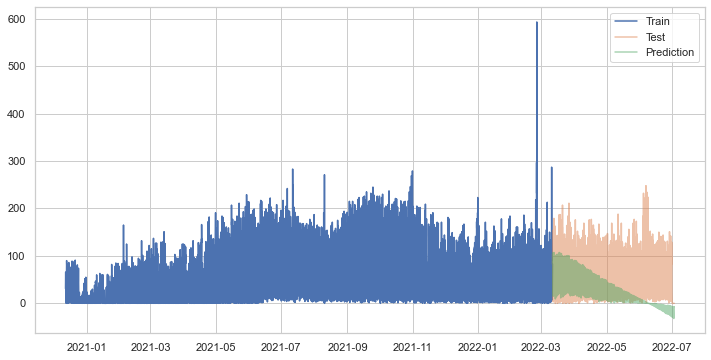

In [60]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

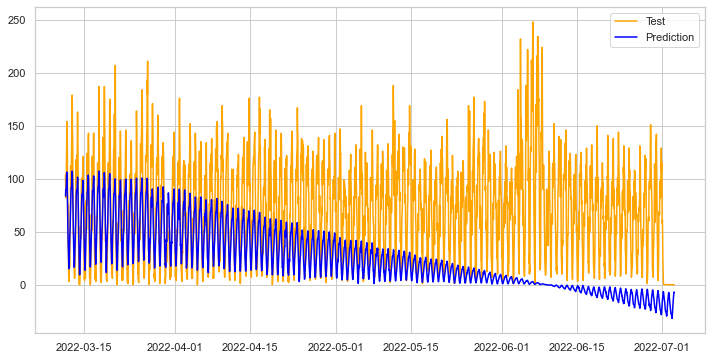

In [61]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

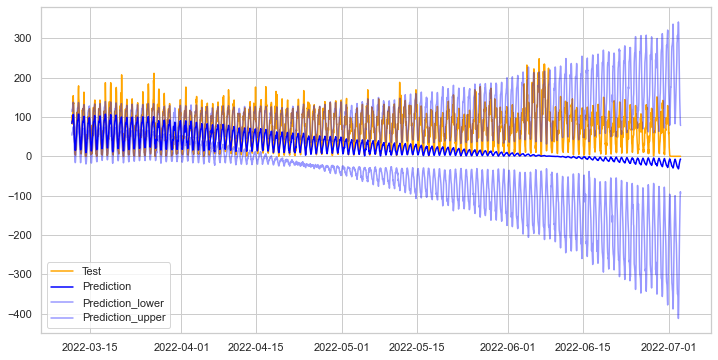

In [62]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

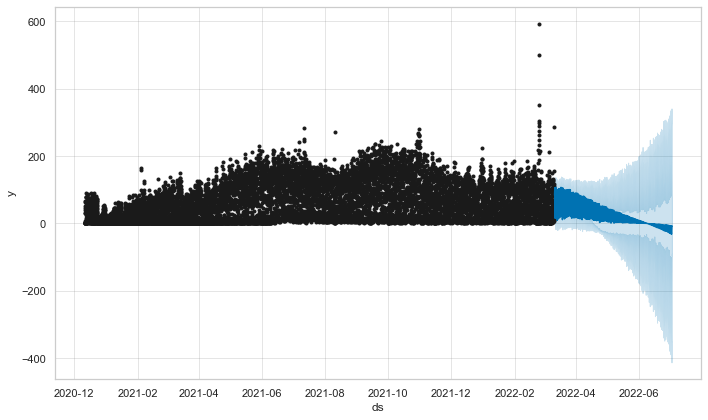

In [63]:
fig1 = m.plot(forecast)

In [64]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [65]:
plot_components_plotly(m, forecast)

In [66]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='200 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 47 forecasts with cutoffs between 2021-07-04 12:00:00 and 2022-02-19 12:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb53426fca0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -109.716
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -121.916
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -77.2945
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -72.7498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -80.4346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -84.9455
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -91.1693
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -82.2178
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8127.65     0.0211833       1010.35           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7681.47    0.00948456       163.301           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9460.86    0.00309671       215.009           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9928.39    0.00293899       159.675           1  

     699       8183.49      0.056583       233.527           1           1      774   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       7728.89    0.00160999       17.3862           1           1      754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599        9263.2    0.00087968       64.3391           1           1      656   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       9985.03    0.00146751       101.595           1           1      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       9739.42    0.00423848       188.258      0.6699      0.6699      685   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       9046.36   0.000295768       29.7995           1           1      778   
    Iter      log 

    1199       9515.32   0.000153726       11.3904      0.3068           1     1350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       9053.93   0.000146012        12.872           1           1     1431   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099         10226   0.000379109       21.0922      0.4861      0.4861     1219   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       9746.31    0.00181907       32.1897           1           1     1359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       9266.03    8.5161e-05       10.9109           1           1     1376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       8187.88   0.000638515        13.851           1           1     1589   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1499       10227.4   0.000150571       20.9344      0.9524      0.9524     1662   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       8188.56   0.000647787       6.51815           1           1     2099   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       9054.98   0.000170408       8.39533      0.2425           1     2011   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       9992.65   0.000709585       13.4944      0.8685      0.8685     1802   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1548       10227.4   1.01565e-05       5.17202      0.3503           1     1732   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1699       9266.68   0.000762137       10.4629      0.7059      0.7059     1957   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899        8188.6   0.000551782       19.1386      0.9726      0.9726     2211   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       9055.07    0.00782425       19.2123           1           1     2125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1699       9992.73   6.19425e-05       10.6633       0.337       0.337     1914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1721       9266.69   3.51001e-05       16.1389   3.939e-06       0.001     2035  LS failed, Hessian reset 
    1999       8188.65   0.000168701         8.137           1           1     2328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1760       9747.09   4.41588e-05       34.0759   1.568e-06       0.001     2055  LS failed, Hessian reset 
    1799        9266.7   8.05299e-05       4.97045      0.7807      0.7807     2125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1985       9055.14   1.94019e-05       14.3929    1.09e-06       0.001     2265  LS failed, Hessian reset 
    1799       9747.12   0.000415996       6.75856      0.5725           1     2097   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2099       8188.67   1.85691e-05       5.32892      0.1219      0.1219     2439   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2028       9055.15   5.73604e-06       4.86254           1           1     2314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899       9747.13   0.000120572       5.91547       0.665       0.665     2212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       9992.87    0.00913407       44.9805           1           1     2151   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1946       9747.14   3.48545e-05       5.38946           1           1     2264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1965       9993.06   0.000189372       66.0523   7.809e-06       0.001     2270  LS failed, Hessian reset 
    1999       9993.13   0.000612121        33.659           1           1     2310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2068       9993.18   0.000108025       14.3873   8.489e-06       0.001     2434  LS failed, Hessian reset 
    2088       9993.18   1.02614e-05       5.42584      0.3068      0.9577     2457   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -82.7369
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -111.03
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -86.3961
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         10360    0.00891898       397.411           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10595.7     0.0458591       742.395           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10844.7     0.0063171       642.534      0.7541     0.07541      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10391.3    0.00896372       102.702           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         10632    0.00231104        140.66      0.5204      0.5204      227   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -90.4208
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -93.0435
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -106.225
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10873.1    0.00188253       143.409           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       10401.8       0.01289        90.359           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         10646     0.0648225       1545.97      0.4902           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       11086.3     0.0215663       584.412           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11230.4    0.00851991       646.747           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -100.479
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       10882.6    0.00340359       342.419      0.1967      0.1967      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11495.7     0.0258929       1641.96      0.4296      0.4296      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       10409.5    0.00138298       56.7532           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -136.095
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       11122.8    0.00202318       72.8225           1           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       11364.8     0.0109091       273.193           1           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       10893.3    0.00100548         72.62           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       11791.7    0.00442227       138.413           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       10417.6   0.000411229       27.0999       1.187      0.1187      676   
    Iter      log prob        ||dx||      ||grad||       alpha  

    1099       10899.7    0.00435583       69.2339      0.4997           1     1247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       10664.4   9.23762e-05       73.0122     0.06959           1     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       11391.6    0.00050647       43.7085      0.8611      0.8611     1005   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1210       10423.8   1.66356e-05       16.5979   8.575e-07       0.001     1395  LS failed, Hessian reset 
     599         12061     0.0054875        57.419           1           1      676   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       11822.6    0.00290948       82.2073           1           1      910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       11151.4   0.000469329        25.676           1           1     1464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       11608.2    0.00117711       46.9772      0.2571      0.2571     1353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       10901.8   4.87253e-05       8.77239      0.3367      0.3367     1701   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       11824.2    0.00327204       29.8657           1           1     1260   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       11394.1   0.000444956       23.6298           1           1     1460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       10665.2   5.19345e-06       5.70993      0.5551      0.5551     1859   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1603       10665.2   8.76267e-06       3.89188           1           1     1864   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       12070.6   0.000290397       67.6071      0.3571           1     1128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       11151.8    0.00232902       24.7809           1           1     1579   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       11608.4    0.00213572       68.1796           1           1     1469   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       10901.9    0.00257776       18.4153           1           1     1828   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       11824.4    0.00033347       53.5075      0.2014      0.2014     1371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       11394.2   0.000506443        13.376           1           1     1574   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       12072.3    0.00116958       67.8086           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       11152.3   0.000506467       23.5889           1           1     1690   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1899       11394.5    7.0256e-05       16.6295      0.5117      0.5117     2194   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       12073.4   0.000277966       12.7858           1           1     1751   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       11609.1   2.46783e-05       9.72831      0.3765      0.3765     2133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699         11825   2.15584e-05       21.1954   1.316e-06       0.001     2026  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       11394.6    0.00230801       14.6824           1           1     2304   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       12073.5    0.00170476       31.3378           1           1     18

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2299       11394.8   3.73834e-05       7.57643           1           1     2638   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       11825.1   3.86949e-05       11.9413      0.1504           1     2378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2304       11394.8   6.64477e-06       6.01385      0.3632      0.3632     2644   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2099       11609.3   7.03035e-05       16.0658           1           1     2538   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -130.85
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2128       11609.3   7.59499e-06       6.49839      0.4376           1     2570   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -133.943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899         12074   0.000352605       33.2475           1           1     2202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2085       11825.2   3.14979e-05       5.70455      0.8613      0.8613     2472   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99         12166     0.0335794       488.358           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999         12074   0.000133586       5.90106      0.9042      0.9042     2319   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12353.4      0.031062           970      0.5227           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12252.8     0.0183014       313.668           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2070         12074   8.08597e-05       5.10979      0.2964      0.6177     2401   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       12447.7     0.0159703       555.959           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12263.6    0.00639014       155.155           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12458.2     0.0117795       233.801           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     399       12268.7    0.00414765       165.071       1.821      0.1821      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -112.252
Initial log joint probability = -141.798
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12465.6    0.00349049       708.948      0.1207           1      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12279.4    0.00123952       182.233      0.1784           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12642.3     0.0017974       507.261           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       124

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -132.409
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12790.1     0.0153856        474.43           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       12483.7     0.0188734       174.043      0.8739      0.8739      899   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       12587.3    0.00266374       452.767      0.3124      0.3124      478   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -128.867
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       12288.3    0.00267475       107.859      0.3996      0.3996     1029   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -124.401
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         12797     0.0199314       491.166       0.884       0.884      562   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       12490.3    0.00141413       26.6513           1           1     1015   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12836.3     0.0190112        1397.5           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12597.7    0.00513197       138.525      0.9386      0.9386      594   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13045.9     0.0234712       622.801           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -133.515
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       12291.5   0.000606129       47.3368           1           1     1249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       12492.5    0.00122858        53.224           1           1     1240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13424.1    0.00754687        703.62           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       12805.3    0.00101014       93.6582           1           1      787   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12990.9     0.0205884       281.834           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha  

     799       13231.2    0.00019494       16.3081           1           1      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       12293.6   0.000275524       11.9032           1           1     1987   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       12817.9   0.000229006        34.007      0.8211      0.8211     1456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699         12494   9.74571e-05       12.7336      0.5604      0.5604     1926   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       12616.4   0.000153746       65.2853      0.2111      0.2111     1498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       13681.3    0.00299482       83.8226           1           1      694   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1899       12494.2   0.000168171       18.6062           1           1     2153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       12818.7    0.00279796       98.7497           1           1     1693   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099         13018   0.000689462        19.939       1.106      0.1106     1236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       13689.6    0.00262223        95.284      0.1612           1      921   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       13470.2    9.6173e-05       31.4567      0.7076      0.7076     1143   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       13232.9   0.000417761       49.7076      0.2702           1     1236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       12617.5   0.000493996       35.7808       0.236           1     1836   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       12494.2   0.000269453       15.4944       1.609      0.1609     2268   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1299       13019.5     0.0014266       73.7048           1           1     1467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       13233.1    0.00100656       80.1324      0.2029           1     1462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       13691.2    0.00162427       92.8299           1           1     1150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       13471.8    0.00044533       45.5563           1           1     1369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       12618.2   0.000293438       26.9055      0.6741      0.6741     2067   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       12819.9   0.000342352       40.2663      0.4325      0.4325     2036   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1499       13694.9    0.00341453       31.6357      0.9445      0.9445     1726   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2295       12820.4   9.83464e-06       12.3407   1.087e-06       0.001     2666  LS failed, Hessian reset 
    2299       12820.4   9.48056e-06       5.90268           1           1     2670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2302       12820.4   9.25064e-06       5.78721      0.2239           1     2674   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -130.673
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       13020.9    0.00308598       25.2804      0.2508      0.2508     2157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       12618.8    0.00016386       6.21769           1           1     2760   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       13473.3    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1902         13021   0.000246059       48.0331   1.303e-05       0.001     2203  LS failed, Hessian reset 
    1599       13695.1   0.000162457       16.9439           1           1     1842   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13629.3     0.0302696        503.81           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2499       12618.8   0.000121284       6.24951           1           1     2877   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       13473.5    0.00642758       56.0266           1           1     2152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999         13021   0.000157787       16.7918      0.1902      0.8347     2321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1699       13695.3   0.000178919       13.5013       4.176      0.4176     1968   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -138.699
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2599       12618.8   6.04511e-05       6.08481           1           1     3000   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13789.1    0.00164264       264.923           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       13473.7   0.000590183       50.3982      0.3204           1     2273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2079       13021.1   1.93396e-05       25.1678    7.36e-07       0.001     2458  LS failed, Hessian reset 
    2099       13021.1   0.000111386    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2145       13021.1   3.47959e-05       11.0054   5.484e-06       0.001     2576  LS failed, Hessian reset 
    2146       13021.1   1.15518e-05       4.74292      0.2897           1     2578   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2067       13473.8   9.77769e-06       11.0271   4.208e-07       0.001     2401  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2099       13473.8   0.000111623       7.54755           1           1     2436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13891.6    0.00387902       559.418      0.6032      0.6032      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       13695.6   0.000582307       77.6947      0.5338      0.5338     2234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       13806.1    0.00375096       187.501           1           1      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       13473.8     0.0001473       12.0124      0.6659      0.6659     2546   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1963       13695.6   1.91687e-05       9.34367           1           1     2320   
Optimization termi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       13904.4     0.0089265       262.943      0.1389           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499         13811   0.000544793       67.7797           1           1      579   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       13910.2    0.00540994       107.865           1           1      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       13814.1    0.00538873       116.183           1           1      686   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       13918.3     0.0180101       165.188           1           1      576   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       13816.9    0.00131413       58.0075           1           1      793   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -136.684
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       13921.2    0.00100058       45.8486           1           1      688   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -197.854
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       13818.7    0.00318918       41.8869           1           1      916   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       13923.5    0.00217495       84.2213           1           1      799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13885.2     0.0205543       794.402           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         14154      0.151473       1506.74           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       13821.2    0.00411259       159.275           1           1     1029   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -141.843
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       14131.9   0.000931792       64.2543           1           1      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -166.463
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       13926.8    0.00082179        31.074           1           1     1141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       13825.6    0.00124463       93.5808           1           1     1355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       14358.6     0.0174995       206.834           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         14411     0.0352939       1156.66           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       14367.8     0.0139971       245.373      0.3267           1      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -150.369
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -168.839
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1133       13927.3   4.12189e-05       57.0634    8.16e-07       0.001     1345  LS failed, Hessian reset 
     199       14565.8    0.00146988       367.776      0.1658           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       14142.6    0.00239216       53.8568           1           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       13826.1     0.0010458       47.4568           1           1     1580   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       14826.7    0.00139186       64.1985           1           1      580   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       13928.9    0.00273245       26.2704           1           1     1764   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899         14388     0.0194421       260.905      0.2881           1     1020   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       15070.1    0.00326959        142.21       3.421      0.3421      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999         14151    0.00204425       73.9475           1           1     1123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       14591.7    0.00123978       117.943           1           1      690   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       15287.6    0.00076556       193.059      0.5298      0.5298      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       13929.1    0.00131377        38.338       0.695       0.695     1880   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       15302.7   0.000169205       33.9618           1           1      800   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       14834.7   0.000561377       31.0671       0.942       0.942     1029   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       14394.8     0.0017866       150.461      0.2167           1     1464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       14155.3   0.000579823       12.4904           1           1     1580   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       15085.2    0.00224461       59.5242       0.682       0.682      913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       14596.2     0.0100494       157.731           1           1     1146   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -154.343
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       14837.3    0.00126156       37.4273           1           1     1482   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       14395.8    0.00139381       69.6762           1           1     1929   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       15307.8    0.00553508       177.579           1           1     1257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       14155.9   0.000557821       30.0302           1           1     2045   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       14599.5   0.000993651       28.2154           1           1     1600   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1299       15308.9   0.000219602       23.8067           1           1     1481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       14156.5   0.000125841       50.4917      0.2229      0.2229     2275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       14602.1    0.00191466       35.5393           1           1     1838   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       15092.5   0.000198314        8.6702           1           1     1591   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -156.215
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       15527.5    0.00460321        429.96           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       14838.1    0.00108609       22.3098           1           1     1834   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       14156.5   0.000436486       20.6511           1           1     2385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       15309.1   0.000258894       22.7102           1           1     1587   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       14602.2   0.000477856        59.601      0.8228      0.8228     1949   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       15540.4     0.0172373       211.699      0.8228      0.8228      578   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1533       15309.3   2.89335e-05       44.4843    9.21e-07       0.001     1798  LS failed, Hessian reset 
    1799       14838.2    0.00113776       20.1824      0.9579      0.9579     2063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2278       14156.6    1.6439e-05       6.30957           1           1     2645   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1861       14602.5   2.09398e-05       22.5734   2.007e-06       0.001     2187  LS failed, Hessian reset 
    1599       15309.3   5.32503e-05       5.18922      0.4124      0.9447     1874   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       14602.5   6.83414e-05       27.4924      0.2769      0.2769     2230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         15777     0.0168698       432.638      0.3483           1      346   
     599       15544.1    0.00118717       163.453           1           1      692   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       14838.3    0.00160972       66.9072           1           1     2172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1999       14602.6   5.33333e-05       15.9217      0.6549      0.6549     2352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       14838.4   2.43954e-05       8.35806      0.6893      0.6893     2281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       15798.9     0.0010214       85.3617           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         15548     0.0025559       83.5801           1           1      812   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       14602.6   0.000327115       20.6868       0.895       0.895     2471   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       14838.4    0.00143639       51.4847      0.6143      0.6143     2397   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2103       14838.5   1.04751e-05       15.6255   4.693e-07       0.001     2445  LS failed, Hessian reset 
Initial log joint probability = -164.763
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       14602.7   0.000110558       17.8339           1           1     2582   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       15815.2    0.00331966       268.388      0.5061      0.5061      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       15554.7    0.00210356       28.6696           1           1     1042   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       14838.5   4.51299e-05        6.5622      0.7432      0.7432     2559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       15812.3      0.014773    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       15994.4     0.0178609       608.309           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2326       14838.5   4.86899e-06       7.56966   1.107e-06       0.001     2751  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       15558.8   0.000779929        43.068           1           1     1271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         15823    0.00699622       62.5335           1           1      913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -229.829
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       16042.7    0.00188178       121.285           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       15559.8   0.000272313       34.1259           1           1     1384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       15826.1      0.011969       129.725           1           1     1031   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         16080     0.0653268       2743.15           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       16048.3    0.00763429       183.691           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -172.533
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       16243.4     0.0180748       372.925      0.4711       0.996      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       16054.6    0.00351411       192.138      0.5383      0.5383      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       16435.2     0.0091518       477.946           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       15560.7   0.000327724       46.9396           1           1     1617   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       15829.6    0.00538472       152.102           1           1     1254   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       16070.4    0.00708273       146.211           1           1      931   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -185.082
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1367       15834.4   2.77011e-05        47.103   6.587e-07       0.001     1592  LS failed, Hessian reset 
     499       16507.9    0.00421284       330.711           1           1      580   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       15561.5   5.00234e-05       17.5724      0.2365      0.2365     1970   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       15834.6   0.000977389       30.0354      0.3139           1     1631   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -174.233
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       16294.7     0.0065364       121.891      0.9518      0.9518      694   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       16684.2    0.00329778       199.247           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         16072   0.000575243       84.0668      0.9277      0.9277     1043   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       16510.5    0.00118141       107.693           1           1      688   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799         16518   0.000505837       29.4127           1           1      916   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       15837.3    0.00186303       44.8679           1           1     1975   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       16906.9    0.00431472       195.643       2.163      0.2163      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       16305.1     0.0125657       456.175           1           1     1047   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       16787.7    0.00237491       434.228           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       16701.5    0.00117738       85.5843      0.3075           1      810   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       16076.7    0.00101773       59.5612           1           1     1387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       16519.5    0.00248743       146.141      0.1416      0.1416     1027   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2246       15838.3   1.47271e-05       25.4583   6.369e-07       0.001     2698  LS failed, Hessian reset 
Initial log joint probability = -243.106
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       16939.7    0.00423635       108.823           1           1     1041   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499         16309     0.0124548       92.8141           1           1     1741   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       16079.9   0.000526507       48.5713           1           1     2068   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2271       15838.3   5.84142e-06       10.0687   4.398e-07       0.001     2767  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       16707.9   0.000899288       21.5892           1           1     1488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       16525.8    0.00111816       57.1765      0.3396      0.3396     1706   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899         16874     0.0037599       85.8671           1           1     1051   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16902.8    0.00358524        654.81           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       16941.9    0.00589652       64.6362           1           1     1156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       16309.5     0.0014493       135.101      0.2028           1     1856   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899         16080   0.000233785       10.5237           1           1     2189   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       16708.6    0.00154218       50.5874           1           1     1605   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1799       16709.6   0.000999178       15.9261      0.4825      0.4825     2086   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       16880.5    0.00623614       51.4561           1           1     1627   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       16310.8    0.00130101       32.2024      0.6703      0.6703     2440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       17139.1    0.00932864       160.318           1           1      711   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       16527.3   5.69538e-05       14.9005      0.3123      0.6337     2385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       16945.1    0.00026863       49.3803           1           1     1740   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1999       16709.7   0.000499401       17.8413           1           1     2317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1608       16945.3   2.18368e-05       38.8604   5.356e-07       0.001     1910  LS failed, Hessian reset 
    1599       16881.7   0.000149736       63.5156      0.2631           1     1859   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       17144.6   0.000986884       165.212           1           1      942   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       16310.9   1.80573e-05       9.76412      0.5796           1     2728   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       16709.9   0.000375241       102.195     0.08841           1     2432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1699         16882    0.00240377       31.2829           1           1     1972   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -181.114
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       17147.6    0.00176657       132.514           1           1     1054   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399         16311    0.00236507       28.8533           1           1     2843   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2167       16710.1   5.33996e-05       5.92191       1.516      0.1516     2511   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1799       16945.6   0.000522198       20.2851           1           1     2134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       16882.5     0.0065052       169.022           1           1     2084   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17083.6    0.00350898       1575.56      0.7325      0.7325      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17148.6      0.012089        90.542      0.8923      0.8923     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2499       16311.1   0.000182547       13.0446       0.899      0.0899     2967   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       16945.9    0.00110357       15.5688           1           1     2253   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2599       16311.2   1.96056e-05       8.89915      0.4064      0.4064     3082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -181.375
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       16946.3     0.0023277       56.9393      0.9794      0.9794     2369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       16882.9   0.000346497       18.9102           1           1     2322   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       17332.4    0.00680054       316.746           1           1      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2699       16311.2    0.00185926       75.2629           1           1     3200   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       17348.4    0.00158065       98.6119           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2799       16311.3   0.000108446       16.7056           1           1     3311   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -193.995
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       17152.2    0.00360345       39.4183           1           1     1514   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2824       16311.3    2.4464e-05        6.7966           1           1     3341   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       17561.9    0.00780469        763.63           1           1      234   
    Iter      log prob        ||dx||      ||grad||

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2199       16883.2   0.000340632       69.6655           1           1     2553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       16947.1   0.000727086        33.849           1           1     2611   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       17353.5    0.00992306       354.274           1           1      570   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       17153.3     0.0311422       160.921      0.3795           1     1630   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17609.3     0.0141392       1607.52           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       17586.4     0.0182263       190.028           1           1      354   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2299       16883.6    0.00138724       43.1329           1           1     2671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -195.351
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       17357.7    0.00272896       84.2305           1           1      687   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       16947.1   8.27009e-05        8.6162       4.532      0.4532     2739   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       17154.1    0.00465113       98.3215       1.472      0.1472     1748   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17808.9    0.00604356       360.072           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       17598.6    0.00299931       142.956           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2399       16883.7    0.00258899       22.8315           1           1     2789   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       17360.6   0.000497644       152.177           1           1      799   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17851      0.057805       3776.84      0.3653           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       17155.4    0.00390303       100.749           1           1     1857   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       17840.6     0.0109316        225.07      0.8377      0.8377      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       17602.6   0.000335583       52.8985           1           1      581   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       18074.3     0.0148058       230.176           1           1      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       17155.9    0.00029327       36.3246      0.3822           1     2092   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         17860   0.000614084       144.372           1           1      576   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       17608.2   0.000156226       113.352      0.3979      0.3979      817   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17367.7    0.00774611       224.879           1           1     1150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899         17156    0.00049072       13.1632       0.354           1     2211   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       17867.6    0.00120053        217.42           1           1      687   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       18096.3     0.0020077       891.891       0.345           1      486   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       17615.2    0.00252363        149.22           1           1      936   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -188.924
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17368.2   5.13058e-05       62.1934           1           1     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999         17156    0.00237537        58.121           1           1     2331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699         17873   0.000556562       85.8928           1           1      804   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       18114.9    0.00137859       141.477           1           1      599   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       17619.8    0.00690699        263.08           1           1     1049   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -196.104
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       17875.6    0.00419545       108.358           1           1      918   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       17156.2    0.00584141       66.6822      0.1515           1     2455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       18126.6     0.0209378       226.772           1           1      717   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       17620.2    0.00085914       87.9127      0.3132      0.3132     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       17369.4    0.00139278       131.813           1           1     1504   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       18136.9   8.41831e-05       76.9793           1           1     1068   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       17622.3   0.000106141        65.867      0.1909           1     1530   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1599       17370.8     0.0354817       200.757           1           1     1868   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       18354.5    0.00290434       223.432      0.3624           1      605   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17880.1    0.00284637       134.683           1           1     1389   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         18597     0.0275903       1628.82           1           1      465   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       18137.5    0.00062027       46.3351      0.2739      0.2739     1187   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       17622.9    0.00179223       56.4955      0.8815      0.8815     1645   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       18629.9   0.000807548       58.3781           1           1      943   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1689       17881.7   9.28843e-05       7.03788           1           1     1959   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     999       18375.1     0.0097636       214.223           1           1     1195   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1899       17624.1   0.000124704       15.6116           1           1     2222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       18140.7    0.00177102       56.4173           1           1     1760   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       18630.8    0.00202595       302.499           1           1     1061   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1946       17624.1   0.000215667       6.70327           1           1     2277   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1099       18376.4     0.0015089       54.2424           1           1     1308   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       18141.3    0.00704669       53.0028           1           1     1876   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       18636.8     0.0214577       323.825      0.2621           1     1177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       18376.9    0.00748056       151.662           1           1     1436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       18141.6   0.000499527         127.3      0.0359           1     1988   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       18639.5    0.00197672       170.859      0.2355           1     1289   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1932       18379.3   4.00403e-05       56.0207   1.925e-06       0.001     2358  LS failed, Hessian reset 
    1899       18644.4   0.000253643       51.8788      0.8418      0.8418     2221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       18379.5    0.00024507       40.0401      0.2491           1     2444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       18644.5   6.48188e-05        21.585        0.49        0.49     2335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       18379.6     0.0026417       56.8557      0.4914           1     2558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2099       18644.5   0.000147859       26.7284           1           1     2458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2199       18645.1   0.000473203       131.978           1           1     2626   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       18645.3     0.0018246       21.9295       9.584      0.9584     2752   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       18645.3   9.67255e-05       8.11731           1           1     2876   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2465       18645.4   4.40226e-05       12.8739      0.2895      0.9649     2953   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [67]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-07-04 13:00:00,122.563857,96.951629,147.618447,121,2021-07-04 12:00:00
1,2021-07-04 14:00:00,130.598733,103.221134,156.581897,112,2021-07-04 12:00:00
2,2021-07-04 15:00:00,135.472949,109.701673,163.093698,130,2021-07-04 12:00:00
3,2021-07-04 16:00:00,141.737032,116.025197,169.103625,127,2021-07-04 12:00:00
4,2021-07-04 17:00:00,143.227085,115.545909,170.861968,128,2021-07-04 12:00:00


In [68]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,2 days 00:00:00,6.194714e+06,2488.918222,74.215652,0.237268,0.442027,0.703457
1,2 days 01:00:00,6.194717e+06,2488.918820,74.259136,0.238265,0.442988,0.703457
2,2 days 02:00:00,6.194725e+06,2488.920384,74.312381,0.239607,0.444235,0.702571
3,2 days 03:00:00,6.194736e+06,2488.922573,74.452086,0.241361,0.445707,0.700798
4,2 days 04:00:00,6.194738e+06,2488.923055,74.504009,0.241606,0.446344,0.699911


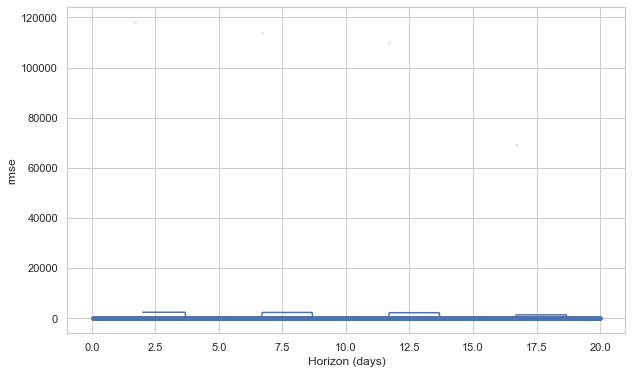

In [69]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [70]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  64.54020172924973
